## Notebook to screen original PubChem database

In [1]:
from rdkit import Chem
import pandas as pd
import numpy as np
from rdkit.Chem import AllChem, DataStructs, Fragments, Lipinski
import rdkit.Chem.rdMolDescriptors as MolDescriptors
import os, sys
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('all_smiles_list_pubchem.csv')
df

,smiles
0,[HH].C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
1,C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
2,CC1=C(C2=C(C=C1)NC(=O)C2=CC3=C(C=CN3)OC)NC(=C)...
3,CC.CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
4,CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
...,...
113920107,CCC1=CC2C(C1)CC2(CN)C(C(=O)O)C(=O)O
113920108,CC1(C2=C(CCC3=C1N=CC(=C3)Br)C=C(C=C2)Cl)N4CCC(...
113920109,C1=CC(=CC=C1C(CCO)O)I
113920110,C1=CC(=CN=C1)C2=C(C=C(C=C2)CC(CO)N)F


**Screen for GM model**

In [28]:
df_ref = pd.read_csv('just_solvents_list_all.csv')
ref = df_ref['solvent']
df_ref

,solvent
0,O=C1OCCO1
1,COC(=O)OC
2,CCCCOC(=O)OC
3,CC(C)COC(=O)OC
4,CCC(C)OC(=O)OC
...,...
208,CS(=O)(=O)CCOCC(F)(F)F
209,CC(C)S(=O)(=O)CCOCC(F)(F)F
210,O=S(=O)(CCOCC(F)(F)F)CC(F)(F)F
211,COS(=O)OC


In [56]:
for i in range(len(df_ref)):
    sm = df_ref['solvent'][i]
    if 'B' or 'S' in sm:
        print(sm)
    else:
        continue

O=C1OCCO1
COC(=O)OC
CCCCOC(=O)OC
CC(C)COC(=O)OC
CCC(C)OC(=O)OC
CCOC(=O)OCC
CCOC(=O)OC(C)F
CC(OC(=O)OCC(F)(F)F)F
FC1COC(=O)O1
C1(C(OC(=O)O1)F)F
CCOC(=O)OC
FC(F)C(F)(F)COC(F)(F)C(F)F
C1C(OC(=O)O1)CC(C(F)(F)F)(C(F)(F)F)F
COC(=O)OCC(F)(F)F
COC(F)(C(F)(F)C(F)(F)F)C(F)(C(F)(F)F)C(F)(F)F
CC(OC(F)(F)C(F)C(F)(F)F)C(F)(F)C(F)C(F)(F)F
CC(OC(F)(F)C(F)C(F)(F)F)C(F)(F)C(F)C(F)(F)F     
CC1COC(=O)O1
CCOCCOCC
ClCCl
C1CCOC1
Cc1ccccc1
COCCOCCOCCOC
CC1CCCO1
COCCOC
C1COCO1
O=c1occo1
C=CCCCOCC1COC(=O)O1
CO[Si](CCCOCC1COC(=O)O1)(OC)OC
CCO[Si](CCCOCC1COC(=O)O1)(OCC)OCC
C[Si](C)(C)O[Si](C)(C)CCCOCC1COC(=O)O1
CCCC(=O)OC
CN1CCCC1=O
CCCCOCCOCCCC
COP(=O)(OC)OC
O=C1CCCO1
COC(=O)OCCCF
CCCOC(=O)OC
COC(=O)OCCC(F)(F)F
COC(=O)OCC(F)(F)C(F)F
COC(=O)OCC(F)(F)C(F)(F)F
O=C1OCC(CF)O1
O=C(OCF)OCF
COC(=O)OCF
COC(=O)OCCF
CCOC(=O)OCCF
CCOC(=O)OCC(F)F
CCOC(=O)OCC(F)(F)F
C[Si](C)(C)O[Si](C)(CCC1COC(=O)O1)O[Si](C)(C)C
C[Si](C)(C)O[Si](C)(C)CCC1COC(=O)O1
CCC1COC(=O)O1
CS(=O)C
C1CCOCC1
CC1CCC(O1)C
CCOC(C(C(C(F)(F)F)(F)F)(F)F)(F)F
CO

In [40]:
tt = ['B','S']
df_ref.query('solvent.str.contains("S") | solvent.str.contains("B")')
s = df_ref.query('solvent.str.contains("S")')
len(s)
df_ref.query('~solvent.str.contains("B")')

,solvent
0,O=C1OCCO1
1,COC(=O)OC
2,CCCCOC(=O)OC
3,CC(C)COC(=O)OC
4,CCC(C)OC(=O)OC
...,...
208,CS(=O)(=O)CCOCC(F)(F)F
209,CC(C)S(=O)(=O)CCOCC(F)(F)F
210,O=S(=O)(CCOCC(F)(F)F)CC(F)(F)F
211,COS(=O)OC


In [39]:
df_trunc_1 = df.query('~smiles.str.contains(".") | ~smiles.str.contains("-")')
df_trunc_1

,smiles
0,[HH].C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
1,C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
2,CC1=C(C2=C(C=C1)NC(=O)C2=CC3=C(C=CN3)OC)NC(=C)...
3,CC.CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
4,CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
...,...
113920107,CCC1=CC2C(C1)CC2(CN)C(C(=O)O)C(=O)O
113920108,CC1(C2=C(CCC3=C1N=CC(=C3)Br)C=C(C=C2)Cl)N4CCC(...
113920109,C1=CC(=CC=C1C(CCO)O)I
113920110,C1=CC(=CN=C1)C2=C(C=C(C=C2)CC(CO)N)F


In [50]:
df_trunc_2 = df_trunc_1.query("~smiles.str.contains('C#C')")
df_trunc_2

,smiles
0,[HH].C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
1,C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
2,CC1=C(C2=C(C=C1)NC(=O)C2=CC3=C(C=CN3)OC)NC(=C)...
3,CC.CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
4,CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
...,...
113920107,CCC1=CC2C(C1)CC2(CN)C(C(=O)O)C(=O)O
113920108,CC1(C2=C(CCC3=C1N=CC(=C3)Br)C=C(C=C2)Cl)N4CCC(...
113920109,C1=CC(=CC=C1C(CCO)O)I
113920110,C1=CC(=CN=C1)C2=C(C=C(C=C2)CC(CO)N)F


In [53]:
def num_double_bond(mol):
    bond_number = 0
    for bond in mol.GetBonds():
        # e = bond.GetEndAtom()
        if bond.GetBondType() == Chem.BondType.DOUBLE:
            e = bond.GetEndAtom()
            f = bond.GetBeginAtom()
            if e.GetAtomicNum() == 8 or f.GetAtomicNum() == 8:
                # bond_number = 0
                continue
            elif e.GetAtomicNum() == 6 or e.GetAtomicNum() == 7:
                bond_number += 1
            elif f.GetAtomicNum() == 6 or f.GetAtomicNum() == 7:
                bond_number += 1
    return bond_number

In [ ]:
df_rem_elem = pd.read_csv('not-allowed-el.csv')
rem_elem = df_rem_elem['elements']

def check_present(smile):
    ctr = 0
    for el in rem_elem:
        if el in smile:
            ctr += 1
        else:
            continue
    return ctr

In [58]:
df_trunc_2.to_csv('trunc_smiles_list_pubchem.csv', index=False)

In [2]:
df = pd.read_csv('trunc_smiles_list_pubchem.csv')
df

,smiles
0,[HH].C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
1,C1C=CC=CC=C1C2=NC3=C(O2)C=CC4=C3CC(=O)N4
2,CC1=C(C2=C(C=C1)NC(=O)C2=CC3=C(C=CN3)OC)NC(=C)...
3,CC.CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
4,CC1=C(C=CC(=C1CC#N)N=O)NC(C=[CH])C2=CC=CC=C2
...,...
104485613,CCC1=CC2C(C1)CC2(CN)C(C(=O)O)C(=O)O
104485614,CC1(C2=C(CCC3=C1N=CC(=C3)Br)C=C(C=C2)Cl)N4CCC(...
104485615,C1=CC(=CC=C1C(CCO)O)I
104485616,C1=CC(=CN=C1)C2=C(C=C(C=C2)CC(CO)N)F


In [4]:
def num_double_bond(mol):
    bond_number = 0
    for bond in mol.GetBonds():
        # e = bond.GetEndAtom()
        if bond.GetBondType() == Chem.BondType.DOUBLE:
            e = bond.GetEndAtom()
            f = bond.GetBeginAtom()
            if e.GetAtomicNum() == 8 or f.GetAtomicNum() == 8:
                # bond_number = 0
                continue
            elif e.GetAtomicNum() == 6 or e.GetAtomicNum() == 7:
                bond_number += 1
            elif f.GetAtomicNum() == 6 or f.GetAtomicNum() == 7:
                bond_number += 1
    return bond_number

In [5]:
df_rem_elem = pd.read_csv('not-allowed-el.csv')
rem_elem = df_rem_elem['elements']

def check_present(smile):
    ctr = 0
    for el in rem_elem:
        if el in smile:
            ctr += 1
        else:
            continue
    return ctr

In [8]:
smiles_arr = []
for i in range(len(df)):
    if i % 100000 == 0:
        print("Currently on {}th data".format(i))
    smile = df['smiles'][i]
    mol = Chem.MolFromSmiles(smile)
    try:
        num = mol.GetNumHeavyAtoms()
        mw = MolDescriptors.CalcExactMolWt(mol)
        if MolDescriptors.CalcNumAromaticRings(mol) >= 1:
            continue
    #     elif rdMolDescriptors.CalcNumHBD(mol) >= 1:
    #         rem_ind.append(i)
        elif Fragments.fr_Imine(mol) >= 1:
            continue
        elif Fragments.fr_nitroso(mol) >= 1:
            continue
        elif '@' in smile:
            continue
        elif num_double_bond(mol) >= 1:
            continue
        elif '+' in smile:
            continue
        elif '-' in smile:
            continue
        elif '[2H' in smile:
            continue
        elif '[13C' in smile:
            continue
        elif '.' in smile:
            continue
        elif float(mw) > 500:
            continue
        elif num <= 4:
            continue
        elif check_present(smile) >= 1:
            continue
        else:
            smiles_arr.append(smile)
    except AttributeError:
        print("Wrong SMILES for: ", i, "(removed!)")
        pass

Currently on 0th data


[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:23] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not removing hydrogen atom without neighbors
[04:55:24] WARNING: not r

[04:55:26] WARNING: not removing hydrogen atom without neighbors
[04:55:26] WARNING: not removing hydrogen atom without neighbors
[04:55:26] WARNING: not removing hydrogen atom without neighbors
[04:55:26] WARNING: not removing hydrogen atom without neighbors
[04:55:26] WARNING: not removing hydrogen atom without neighbors
[04:55:26] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not removing hydrogen atom without neighbors
[04:55:27] WARNING: not r

[04:55:30] WARNING: not removing hydrogen atom without neighbors
[04:55:30] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not removing hydrogen atom without neighbors
[04:55:31] WARNING: not r

[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not removing hydrogen atom without neighbors
[04:55:33] WARNING: not r

[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:35] WARNING: not removing hydrogen atom without neighbors
[04:55:36] WARNING: not removing hydrogen atom without neighbors
[04:55:36] WARNING: not removing hydrogen atom without neighbors
[04:55:36] WARNING: not removing hydrogen atom without neighbors
[04:55:36] WARNING: not removing hydrogen atom without neighbors
[04:55:36] WARNING: not removing hydrogen atom without neighbors
[04:55:36] WARNING: not r

[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:39] WARNING: not removing hydrogen atom without neighbors
[04:55:40] WARNING: not removing hydrogen atom without neighbors
[04:55:40] WARNING: not removing hydrogen atom without neighbors
[04:55:40] WARNING: not removing hydrogen atom without neighbors
[04:55:40] WARNING: not removing hydrogen atom without neighbors
[04:55:40] WARNING: not r

[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not removing hydrogen atom without neighbors
[04:55:41] WARNING: not r

[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:43] WARNING: not removing hydrogen atom without neighbors
[04:55:44] WARNING: not removing hydrogen atom without neighbors
[04:55:44] WARNING: not removing hydrogen atom without neighbors
[04:55:44] WARNING: not removing hydrogen atom without neighbors
[04:55:44] WARNING: not removing hydrogen atom without neighbors
[04:55:44] WARNING: not r

[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not removing hydrogen atom without neighbors
[04:55:47] WARNING: not r

[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not removing hydrogen atom without neighbors
[04:55:53] WARNING: not r

Currently on 100000th data


[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:55] WARNING: not removing hydrogen atom without neighbors
[04:55:56] WARNING: not removing hydrogen atom without neighbors
[04:55:56] WARNING: not removing hydrogen atom without neighbors
[04:55:56] WARNING: not removing hydrogen atom without neighbors
[04:55:56] WARNING: not removing hydrogen atom without neighbors
[04:55:56] WARNING: not r

[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not removing hydrogen atom without neighbors
[04:56:00] WARNING: not r

[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not removing hydrogen atom without neighbors
[04:56:05] WARNING: not r

[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:08] WARNING: not removing hydrogen atom without neighbors
[04:56:09] WARNING: not removing hydrogen atom without neighbors
[04:56:09] WARNING: not removing hydrogen atom without neighbors
[04:56:09] WARNING: not removing hydrogen atom without neighbors
[04:56:09] WARNING: not removing hydrogen atom without neighbors
[04:56:09] WARNING: not removing hydrogen atom without neighbors
[04:56:09] WARNING: not r

[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not removing hydrogen atom without neighbors
[04:56:14] WARNING: not r

[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not removing hydrogen atom without neighbors
[04:56:18] WARNING: not r

[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not removing hydrogen atom without neighbors
[04:56:22] WARNING: not r

[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not removing hydrogen atom without neighbors
[04:56:23] WARNING: not r

[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:24] WARNING: not removing hydrogen atom without neighbors
[04:56:25] WARNING: not removing hydrogen atom without neighbors
[04:56:25] WARNING: not removing hydrogen atom without neighbors
[04:56:25] WARNING: not removing hydrogen atom without neighbors
[04:56:25] WARNING: not removing hydrogen atom without neighbors
[04:56:25] WARNING: not r

[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:27] WARNING: not removing hydrogen atom without neighbors


Currently on 200000th data


[04:56:27] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not removing hydrogen atom without neighbors
[04:56:28] WARNING: not r

[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not removing hydrogen atom without neighbors
[04:56:32] WARNING: not r

[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not removing hydrogen atom without neighbors
[04:56:36] WARNING: not r

[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:40] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not removing hydrogen atom without neighbors
[04:56:41] WARNING: not r

[04:56:43] WARNING: not removing hydrogen atom without neighbors
[04:56:43] WARNING: not removing hydrogen atom without neighbors
[04:56:43] WARNING: not removing hydrogen atom without neighbors
[04:56:43] WARNING: not removing hydrogen atom without neighbors
[04:56:43] WARNING: not removing hydrogen atom without neighbors
[04:56:43] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not removing hydrogen atom without neighbors
[04:56:44] WARNING: not r

[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:46] WARNING: not removing hydrogen atom without neighbors
[04:56:47] WARNING: not r

[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not removing hydrogen atom without neighbors
[04:56:50] WARNING: not r

[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not removing hydrogen atom without neighbors
[04:56:54] WARNING: not r

[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not removing hydrogen atom without neighbors
[04:56:56] WARNING: not r

[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not removing hydrogen atom without neighbors
[04:56:58] WARNING: not r

[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not removing hydrogen atom without neighbors
[04:57:01] WARNING: not r

[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not r

Currently on 300000th data


[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not removing hydrogen atom without neighbors
[04:57:03] WARNING: not r

[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not removing hydrogen atom without neighbors
[04:57:05] WARNING: not r

[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not removing hydrogen atom without neighbors
[04:57:06] WARNING: not r

[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not removing hydrogen atom without neighbors
[04:57:08] WARNING: not r

[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not removing hydrogen atom without neighbors
[04:57:11] WARNING: not r

[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not removing hydrogen atom without neighbors
[04:57:12] WARNING: not r

[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not removing hydrogen atom without neighbors
[04:57:13] WARNING: not r

[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not removing hydrogen atom without neighbors
[04:57:15] WARNING: not r

[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not removing hydrogen atom without neighbors
[04:57:16] WARNING: not r

[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not removing hydrogen atom without neighbors
[04:57:17] WARNING: not r

[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:19] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not removing hydrogen atom without neighbors
[04:57:20] WARNING: not r

[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not removing hydrogen atom without neighbors
[04:57:24] WARNING: not r

[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not removing hydrogen atom without neighbors
[04:57:26] WARNING: not r

[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:29] WARNING: not removing hydrogen atom without neighbors
[04:57:30] WARNING: not removing hydrogen atom without neighbors
[04:57:30] WARNING: not removing hydrogen atom without neighbors
[04:57:30] WARNING: not removing hydrogen atom without neighbors
[04:57:30] WARNING: not removing hydrogen atom without neighbors
[04:57:30] WARNING: not removing hydrogen atom without neighbors
[04:57:30] WARNING: not r

[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not removing hydrogen atom without neighbors
[04:57:35] WARNING: not r

Currently on 400000th data


[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not removing hydrogen atom without neighbors
[04:57:38] WARNING: not r

[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not removing hydrogen atom without neighbors
[04:57:43] WARNING: not r

[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not removing hydrogen atom without neighbors
[04:57:44] WARNING: not r

[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:47] WARNING: not removing hydrogen atom without neighbors
[04:57:48] WARNING: not removing hydrogen atom without neighbors
[04:57:48] WARNING: not removing hydrogen atom without neighbors
[04:57:48] WARNING: not removing hydrogen atom without neighbors
[04:57:48] WARNING: not removing hydrogen atom without neighbors
[04:57:48] WARNING: not r

[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not removing hydrogen atom without neighbors
[04:58:02] WARNING: not r

Currently on 500000th data


[04:58:19] WARNING: not removing hydrogen atom without neighbors
[04:58:20] WARNING: not removing hydrogen atom without neighbors


Currently on 600000th data


[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:58:59] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not removing hydrogen atom without neighbors
[04:59:01] WARNING: not r

Currently on 700000th data
Currently on 800000th data
Currently on 900000th data
Currently on 1000000th data
Currently on 1100000th data
Currently on 1200000th data
Currently on 1300000th data
Currently on 1400000th data
Currently on 1500000th data
Currently on 1600000th data


[05:04:29] WARNING: not removing hydrogen atom without neighbors
[05:04:29] WARNING: not removing hydrogen atom without neighbors
[05:04:35] WARNING: not removing hydrogen atom without neighbors


Currently on 1700000th data


[05:04:38] WARNING: not removing hydrogen atom without neighbors
[05:04:51] WARNING: not removing hydrogen atom without neighbors
[05:05:00] WARNING: not removing hydrogen atom without neighbors


Currently on 1800000th data
Currently on 1900000th data
Currently on 2000000th data
Currently on 2100000th data
Currently on 2200000th data


[05:07:02] WARNING: not removing hydrogen atom without neighbors
[05:07:06] WARNING: not removing hydrogen atom without neighbors
[05:07:07] WARNING: not removing hydrogen atom without neighbors
[05:07:07] WARNING: not removing hydrogen atom without neighbors


Currently on 2300000th data


[05:07:19] WARNING: not removing hydrogen atom without neighbors
[05:07:22] WARNING: not removing hydrogen atom without neighbors
[05:07:23] WARNING: not removing hydrogen atom without neighbors
[05:07:23] WARNING: not removing hydrogen atom without neighbors
[05:07:26] WARNING: not removing hydrogen atom without neighbors
[05:07:26] WARNING: not removing hydrogen atom without neighbors
[05:07:27] WARNING: not removing hydrogen atom without neighbors
[05:07:27] WARNING: not removing hydrogen atom without neighbors
[05:07:28] WARNING: not removing hydrogen atom without neighbors
[05:07:28] WARNING: not removing hydrogen atom without neighbors
[05:07:29] WARNING: not removing hydrogen atom without neighbors
[05:07:30] WARNING: not removing hydrogen atom without neighbors
[05:07:30] WARNING: not removing hydrogen atom without neighbors
[05:07:39] WARNING: not removing hydrogen atom without neighbors
[05:07:43] WARNING: not removing hydrogen atom without neighbors
[05:07:43] WARNING: not r

Currently on 2400000th data


[05:07:50] WARNING: not removing hydrogen atom without neighbors
[05:07:50] WARNING: not removing hydrogen atom without neighbors
[05:07:50] WARNING: not removing hydrogen atom without neighbors
[05:07:50] WARNING: not removing hydrogen atom without neighbors
[05:07:58] WARNING: not removing hydrogen atom without neighbors
[05:07:58] WARNING: not removing hydrogen atom without neighbors
[05:08:04] WARNING: not removing hydrogen atom without neighbors
[05:08:04] WARNING: not removing hydrogen atom without neighbors
[05:08:06] WARNING: not removing hydrogen atom without neighbors
[05:08:06] WARNING: not removing hydrogen atom without neighbors
[05:08:09] WARNING: not removing hydrogen atom without neighbors
[05:08:10] WARNING: not removing hydrogen atom without neighbors
[05:08:10] WARNING: not removing hydrogen atom without neighbors
[05:08:10] WARNING: not removing hydrogen atom without neighbors
[05:08:10] WARNING: not removing hydrogen atom without neighbors
[05:08:10] WARNING: not r

Currently on 2500000th data


[05:08:19] WARNING: not removing hydrogen atom without neighbors
[05:08:21] WARNING: not removing hydrogen atom without neighbors
[05:08:30] WARNING: not removing hydrogen atom without neighbors
[05:08:30] WARNING: not removing hydrogen atom without neighbors
[05:08:30] WARNING: not removing hydrogen atom without neighbors
[05:08:31] WARNING: not removing hydrogen atom without neighbors
[05:08:31] WARNING: not removing hydrogen atom without neighbors
[05:08:34] WARNING: not removing hydrogen atom without neighbors
[05:08:34] WARNING: not removing hydrogen atom without neighbors


Currently on 2600000th data
Currently on 2700000th data
Currently on 2800000th data
Currently on 2900000th data
Currently on 3000000th data
Currently on 3100000th data


[05:11:06] WARNING: not removing hydrogen atom without neighbors
[05:11:11] WARNING: not removing hydrogen atom without neighbors
[05:11:12] WARNING: not removing hydrogen atom without neighbors


Currently on 3200000th data


[05:11:34] WARNING: not removing hydrogen atom without neighbors
[05:11:35] WARNING: not removing hydrogen atom without neighbors
[05:11:35] WARNING: not removing hydrogen atom without neighbors
[05:11:36] WARNING: not removing hydrogen atom without neighbors
[05:11:36] WARNING: not removing hydrogen atom without neighbors
[05:11:38] WARNING: not removing hydrogen atom without neighbors
[05:11:38] WARNING: not removing hydrogen atom without neighbors
[05:11:41] WARNING: not removing hydrogen atom without neighbors
[05:11:41] WARNING: not removing hydrogen atom without neighbors
[05:11:41] WARNING: not removing hydrogen atom without neighbors


Currently on 3300000th data


[05:12:00] WARNING: not removing hydrogen atom without neighbors
[05:12:05] WARNING: not removing hydrogen atom without neighbors
[05:12:13] WARNING: not removing hydrogen atom without neighbors
[05:12:19] WARNING: not removing hydrogen atom without neighbors
[05:12:21] WARNING: not removing hydrogen atom without neighbors


Currently on 3400000th data


[05:12:25] WARNING: not removing hydrogen atom without neighbors
[05:12:25] WARNING: not removing hydrogen atom without neighbors
[05:12:33] WARNING: not removing hydrogen atom without neighbors
[05:12:34] WARNING: not removing hydrogen atom without neighbors
[05:12:48] WARNING: not removing hydrogen atom without neighbors
[05:12:51] WARNING: not removing hydrogen atom without neighbors
[05:12:51] WARNING: not removing hydrogen atom without neighbors
[05:12:52] WARNING: not removing hydrogen atom without neighbors


Currently on 3500000th data


[05:12:59] WARNING: not removing hydrogen atom without neighbors
[05:13:12] WARNING: not removing hydrogen atom without neighbors
[05:13:12] WARNING: not removing hydrogen atom without neighbors
[05:13:14] WARNING: not removing hydrogen atom without neighbors
[05:13:16] WARNING: not removing hydrogen atom without neighbors
[05:13:19] WARNING: not removing hydrogen atom without neighbors
[05:13:22] WARNING: not removing hydrogen atom without neighbors


Currently on 3600000th data


[05:13:27] WARNING: not removing hydrogen atom without neighbors
[05:13:30] WARNING: not removing hydrogen atom without neighbors
[05:13:38] WARNING: not removing hydrogen atom without neighbors
[05:13:38] WARNING: not removing hydrogen atom without neighbors
[05:13:45] WARNING: not removing hydrogen atom without neighbors


Currently on 3700000th data
Currently on 3800000th data
Currently on 3900000th data
Currently on 4000000th data
Currently on 4100000th data
Currently on 4200000th data
Currently on 4300000th data
Currently on 4400000th data


[05:17:08] WARNING: not removing hydrogen atom without neighbors
[05:17:08] WARNING: not removing hydrogen atom without neighbors
[05:17:09] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:10] WARNING: not removing hydrogen atom without neighbors
[05:17:13] WARNING: not removing hydrogen atom without neighbors
[05:17:13] WARNING: not removing hydrogen atom without neighbors
[05:17:13] WARNING: not removing hydrogen atom without neighbors
[05:17:14] WARNING: not r

Currently on 4500000th data


[05:17:33] WARNING: not removing hydrogen atom without neighbors
[05:17:33] WARNING: not removing hydrogen atom without neighbors
[05:17:33] WARNING: not removing hydrogen atom without neighbors
[05:17:33] WARNING: not removing hydrogen atom without neighbors
[05:17:33] WARNING: not removing hydrogen atom without neighbors
[05:17:33] WARNING: not removing hydrogen atom without neighbors
[05:17:38] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not removing hydrogen atom without neighbors
[05:17:39] WARNING: not r

Currently on 4600000th data
Currently on 4700000th data


[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:35] WARNING: not removing hydrogen atom without neighbors
[05:18:36] WARNING: not removing hydrogen atom without neighbors
[05:18:36] WARNING: not removing hydrogen atom without neighbors
[05:18:36] WARNING: not removing hydrogen atom without neighbors
[05:18:36] WARNING: not removing hydrogen atom without neighbors
[05:18:36] WARNING: not removing hydrogen atom without neighbors
[05:18:36] WARNING: not r

Currently on 4800000th data


[05:19:28] WARNING: not removing hydrogen atom without neighbors
[05:19:38] WARNING: not removing hydrogen atom without neighbors
[05:19:38] WARNING: not removing hydrogen atom without neighbors
[05:19:41] WARNING: not removing hydrogen atom without neighbors
[05:19:51] WARNING: not removing hydrogen atom without neighbors


Currently on 4900000th data


[05:20:04] WARNING: not removing hydrogen atom without neighbors
[05:20:08] WARNING: not removing hydrogen atom without neighbors


Currently on 5000000th data


[05:20:57] WARNING: not removing hydrogen atom without neighbors
[05:21:03] WARNING: not removing hydrogen atom without neighbors


Currently on 5100000th data


[05:21:09] WARNING: not removing hydrogen atom without neighbors
[05:21:16] WARNING: not removing hydrogen atom without neighbors
[05:21:26] WARNING: not removing hydrogen atom without neighbors
[05:21:34] WARNING: not removing hydrogen atom without neighbors


Currently on 5200000th data


[05:21:46] WARNING: not removing hydrogen atom without neighbors
[05:22:06] WARNING: not removing hydrogen atom without neighbors


Currently on 5300000th data


[05:22:39] WARNING: not removing hydrogen atom without neighbors


Currently on 5400000th data
Currently on 5500000th data


[05:23:41] WARNING: not removing hydrogen atom without neighbors
[05:23:43] WARNING: not removing hydrogen atom without neighbors
[05:23:43] WARNING: not removing hydrogen atom without neighbors


Currently on 5600000th data


[05:23:47] WARNING: not removing hydrogen atom without neighbors
[05:23:49] WARNING: not removing hydrogen atom without neighbors
[05:23:51] WARNING: not removing hydrogen atom without neighbors
[05:23:53] WARNING: not removing hydrogen atom without neighbors
[05:23:53] WARNING: not removing hydrogen atom without neighbors
[05:24:00] WARNING: not removing hydrogen atom without neighbors
[05:24:04] WARNING: not removing hydrogen atom without neighbors
[05:24:04] WARNING: not removing hydrogen atom without neighbors
[05:24:06] WARNING: not removing hydrogen atom without neighbors
[05:24:07] WARNING: not removing hydrogen atom without neighbors
[05:24:10] WARNING: not removing hydrogen atom without neighbors
[05:24:11] WARNING: not removing hydrogen atom without neighbors
[05:24:11] WARNING: not removing hydrogen atom without neighbors
[05:24:15] WARNING: not removing hydrogen atom without neighbors


Currently on 5700000th data


[05:24:24] WARNING: not removing hydrogen atom without neighbors
[05:24:37] WARNING: not removing hydrogen atom without neighbors
[05:24:37] WARNING: not removing hydrogen atom without neighbors
[05:24:43] WARNING: not removing hydrogen atom without neighbors
[05:24:46] WARNING: not removing hydrogen atom without neighbors
[05:24:46] WARNING: not removing hydrogen atom without neighbors
[05:24:46] WARNING: not removing hydrogen atom without neighbors
[05:24:46] WARNING: not removing hydrogen atom without neighbors
[05:24:48] WARNING: not removing hydrogen atom without neighbors


Currently on 5800000th data


[05:24:52] WARNING: not removing hydrogen atom without neighbors
[05:24:59] WARNING: not removing hydrogen atom without neighbors
[05:25:09] WARNING: not removing hydrogen atom without neighbors
[05:25:12] WARNING: not removing hydrogen atom without neighbors
[05:25:17] WARNING: not removing hydrogen atom without neighbors
[05:25:17] WARNING: not removing hydrogen atom without neighbors
[05:25:22] WARNING: not removing hydrogen atom without neighbors
[05:25:22] WARNING: not removing hydrogen atom without neighbors


Currently on 5900000th data


[05:25:24] WARNING: not removing hydrogen atom without neighbors
[05:25:25] WARNING: not removing hydrogen atom without neighbors
[05:25:27] WARNING: not removing hydrogen atom without neighbors
[05:25:28] WARNING: not removing hydrogen atom without neighbors
[05:25:29] WARNING: not removing hydrogen atom without neighbors
[05:25:33] WARNING: not removing hydrogen atom without neighbors
[05:25:40] WARNING: not removing hydrogen atom without neighbors
[05:25:40] WARNING: not removing hydrogen atom without neighbors


Currently on 6000000th data
Currently on 6100000th data
Currently on 6200000th data
Currently on 6300000th data
Currently on 6400000th data


[05:27:48] WARNING: not removing hydrogen atom without neighbors
[05:27:49] WARNING: not removing hydrogen atom without neighbors
[05:27:49] WARNING: not removing hydrogen atom without neighbors
[05:27:49] WARNING: not removing hydrogen atom without neighbors
[05:27:49] WARNING: not removing hydrogen atom without neighbors
[05:27:49] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not removing hydrogen atom without neighbors
[05:27:50] WARNING: not r

[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not removing hydrogen atom without neighbors
[05:27:52] WARNING: not r

[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not removing hydrogen atom without neighbors
[05:27:55] WARNING: not r

Currently on 6500000th data


[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not removing hydrogen atom without neighbors
[05:27:57] WARNING: not r

[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not removing hydrogen atom without neighbors
[05:28:00] WARNING: not r

[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not r

[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not removing hydrogen atom without neighbors
[05:28:02] WARNING: not r

[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not removing hydrogen atom without neighbors
[05:28:03] WARNING: not r

[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:05] WARNING: not removing hydrogen atom without neighbors
[05:28:06] WARNING: not removing hydrogen atom without neighbors
[05:28:06] WARNING: not r

[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not removing hydrogen atom without neighbors
[05:28:08] WARNING: not r

[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:09] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not removing hydrogen atom without neighbors
[05:28:10] WARNING: not r

[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:12] WARNING: not removing hydrogen atom without neighbors
[05:28:13] WARNING: not removing hydrogen atom without neighbors
[05:28:13] WARNING: not r

[05:28:15] WARNING: not removing hydrogen atom without neighbors
[05:28:15] WARNING: not removing hydrogen atom without neighbors
[05:28:15] WARNING: not removing hydrogen atom without neighbors
[05:28:15] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not removing hydrogen atom without neighbors
[05:28:16] WARNING: not r

[05:28:19] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not removing hydrogen atom without neighbors
[05:28:20] WARNING: not r

[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not removing hydrogen atom without neighbors
[05:28:22] WARNING: not r

[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not removing hydrogen atom without neighbors
[05:28:25] WARNING: not r

[05:28:26] WARNING: not removing hydrogen atom without neighbors
[05:28:26] WARNING: not removing hydrogen atom without neighbors
[05:28:26] WARNING: not removing hydrogen atom without neighbors
[05:28:26] WARNING: not removing hydrogen atom without neighbors
[05:28:26] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not removing hydrogen atom without neighbors
[05:28:27] WARNING: not r

[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not removing hydrogen atom without neighbors
[05:28:29] WARNING: not r

[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not removing hydrogen atom without neighbors
[05:28:30] WARNING: not r

Currently on 6600000th data


[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not removing hydrogen atom without neighbors
[05:28:33] WARNING: not r

[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not removing hydrogen atom without neighbors
[05:28:37] WARNING: not r

[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not removing hydrogen atom without neighbors
[05:28:40] WARNING: not r

[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not removing hydrogen atom without neighbors
[05:28:43] WARNING: not r

[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:45] WARNING: not removing hydrogen atom without neighbors
[05:28:46] WARNING: not removing hydrogen atom without neighbors
[05:28:46] WARNING: not removing hydrogen atom without neighbors
[05:28:46] WARNING: not removing hydrogen atom without neighbors
[05:28:46] WARNING: not removing hydrogen atom without neighbors
[05:28:46] WARNING: not r

[05:28:48] WARNING: not removing hydrogen atom without neighbors
[05:28:48] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not removing hydrogen atom without neighbors
[05:28:49] WARNING: not r

[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not r

[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not removing hydrogen atom without neighbors
[05:28:52] WARNING: not r

[05:28:55] WARNING: not removing hydrogen atom without neighbors
[05:28:55] WARNING: not removing hydrogen atom without neighbors


Currently on 6700000th data
Currently on 6800000th data
Currently on 6900000th data
Currently on 7000000th data
Currently on 7100000th data
Currently on 7200000th data
Currently on 7300000th data
Currently on 7400000th data
Currently on 7500000th data


[05:33:06] WARNING: not removing hydrogen atom without neighbors
[05:33:12] WARNING: not removing hydrogen atom without neighbors
[05:33:12] WARNING: not removing hydrogen atom without neighbors
[05:33:12] WARNING: not removing hydrogen atom without neighbors
[05:33:13] WARNING: not removing hydrogen atom without neighbors
[05:33:19] WARNING: not removing hydrogen atom without neighbors


Currently on 7600000th data
Currently on 7700000th data
Currently on 7800000th data


[05:34:55] WARNING: not removing hydrogen atom without neighbors
[05:34:55] WARNING: not removing hydrogen atom without neighbors
[05:35:13] WARNING: not removing hydrogen atom without neighbors
[05:35:13] WARNING: not removing hydrogen atom without neighbors


Currently on 7900000th data


[05:35:20] WARNING: not removing hydrogen atom without neighbors
[05:35:20] WARNING: not removing hydrogen atom without neighbors
[05:35:38] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:39] WARNING: not removing hydrogen atom without neighbors
[05:35:41] WARNING: not removing hydrogen atom without neighbors
[05:35:41] WARNING: not removing hydrogen atom without neighbors
[05:35:41] WARNING: not removing hydrogen atom without neighbors
[05:35:41] WARNING: not removing hydrogen atom without neighbors
[05:35:41] WARNING: not r

[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not removing hydrogen atom without neighbors
[05:35:44] WARNING: not r

[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not removing hydrogen atom without neighbors
[05:35:45] WARNING: not r

[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not removing hydrogen atom without neighbors
[05:35:47] WARNING: not r

[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:49] WARNING: not removing hydrogen atom without neighbors
[05:35:50] WARNING: not removing hydrogen atom without neighbors
[05:35:50] WARNING: not removing hydrogen atom without neighbors
[05:35:50] WARNING: not removing hydrogen atom without neighbors
[05:35:50] WARNING: not r

Currently on 8000000th data


[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not removing hydrogen atom without neighbors
[05:35:51] WARNING: not r

[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not removing hydrogen atom without neighbors
[05:35:53] WARNING: not r

[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not removing hydrogen atom without neighbors
[05:35:54] WARNING: not r

[05:35:57] WARNING: not removing hydrogen atom without neighbors
[05:35:57] WARNING: not removing hydrogen atom without neighbors
[05:35:57] WARNING: not removing hydrogen atom without neighbors
[05:35:57] WARNING: not removing hydrogen atom without neighbors
[05:35:57] WARNING: not removing hydrogen atom without neighbors
[05:35:57] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:58] WARNING: not removing hydrogen atom without neighbors
[05:35:59] WARNING: not r

[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not removing hydrogen atom without neighbors
[05:36:00] WARNING: not r

[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not removing hydrogen atom without neighbors
[05:36:02] WARNING: not r

[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not r

[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:05] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not removing hydrogen atom without neighbors
[05:36:06] WARNING: not r

[05:36:07] WARNING: not removing hydrogen atom without neighbors
[05:36:07] WARNING: not removing hydrogen atom without neighbors
[05:36:07] WARNING: not removing hydrogen atom without neighbors
[05:36:07] WARNING: not removing hydrogen atom without neighbors
[05:36:07] WARNING: not removing hydrogen atom without neighbors
[05:36:07] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not removing hydrogen atom without neighbors
[05:36:08] WARNING: not r

[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not removing hydrogen atom without neighbors
[05:36:09] WARNING: not r

[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not removing hydrogen atom without neighbors
[05:36:10] WARNING: not r

[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not removing hydrogen atom without neighbors
[05:36:12] WARNING: not r

[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not removing hydrogen atom without neighbors
[05:36:13] WARNING: not r

[05:36:15] WARNING: not removing hydrogen atom without neighbors
[05:36:15] WARNING: not removing hydrogen atom without neighbors
[05:36:15] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not removing hydrogen atom without neighbors
[05:36:16] WARNING: not r

[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not removing hydrogen atom without neighbors
[05:36:18] WARNING: not r

[05:36:19] WARNING: not removing hydrogen atom without neighbors
[05:36:19] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not removing hydrogen atom without neighbors
[05:36:20] WARNING: not r

[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not r

[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not removing hydrogen atom without neighbors
[05:36:22] WARNING: not r

[05:36:24] WARNING: not removing hydrogen atom without neighbors
[05:36:24] WARNING: not removing hydrogen atom without neighbors
[05:36:24] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not r

Currently on 8100000th data


[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not removing hydrogen atom without neighbors
[05:36:25] WARNING: not r

[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not removing hydrogen atom without neighbors
[05:36:28] WARNING: not r

[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not removing hydrogen atom without neighbors
[05:36:29] WARNING: not r

[05:36:31] WARNING: not removing hydrogen atom without neighbors
[05:36:31] WARNING: not removing hydrogen atom without neighbors
[05:36:31] WARNING: not removing hydrogen atom without neighbors
[05:36:31] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not removing hydrogen atom without neighbors
[05:36:32] WARNING: not r

[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not removing hydrogen atom without neighbors
[05:36:33] WARNING: not r

[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not removing hydrogen atom without neighbors
[05:36:34] WARNING: not r

[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not removing hydrogen atom without neighbors
[05:36:35] WARNING: not r

[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not removing hydrogen atom without neighbors
[05:36:36] WARNING: not r

[05:36:37] WARNING: not removing hydrogen atom without neighbors
[05:36:37] WARNING: not removing hydrogen atom without neighbors
[05:36:37] WARNING: not removing hydrogen atom without neighbors
[05:36:37] WARNING: not removing hydrogen atom without neighbors
[05:36:37] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not removing hydrogen atom without neighbors
[05:36:38] WARNING: not r

[05:36:40] WARNING: not removing hydrogen atom without neighbors
[05:36:40] WARNING: not removing hydrogen atom without neighbors
[05:36:40] WARNING: not removing hydrogen atom without neighbors
[05:36:40] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not removing hydrogen atom without neighbors
[05:36:41] WARNING: not r

[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not removing hydrogen atom without neighbors
[05:36:42] WARNING: not r

[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not removing hydrogen atom without neighbors
[05:36:44] WARNING: not r

[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:45] WARNING: not removing hydrogen atom without neighbors
[05:36:46] WARNING: not removing hydrogen atom without neighbors
[05:36:46] WARNING: not removing hydrogen atom without neighbors
[05:36:46] WARNING: not r

[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not removing hydrogen atom without neighbors
[05:36:48] WARNING: not r

[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not removing hydrogen atom without neighbors
[05:36:49] WARNING: not r

[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not removing hydrogen atom without neighbors
[05:36:50] WARNING: not r

[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not removing hydrogen atom without neighbors
[05:36:51] WARNING: not r

[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not removing hydrogen atom without neighbors
[05:36:54] WARNING: not r

[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not removing hydrogen atom without neighbors
[05:36:55] WARNING: not r

[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not removing hydrogen atom without neighbors
[05:36:57] WARNING: not r

Currently on 8200000th data


[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not removing hydrogen atom without neighbors
[05:37:00] WARNING: not r

[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:01] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not r

[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:02] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not removing hydrogen atom without neighbors
[05:37:03] WARNING: not r

[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not removing hydrogen atom without neighbors
[05:37:05] WARNING: not r

[05:37:07] WARNING: not removing hydrogen atom without neighbors
[05:37:07] WARNING: not removing hydrogen atom without neighbors
[05:37:07] WARNING: not removing hydrogen atom without neighbors
[05:37:07] WARNING: not removing hydrogen atom without neighbors
[05:37:07] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not removing hydrogen atom without neighbors
[05:37:08] WARNING: not r

[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not removing hydrogen atom without neighbors
[05:37:10] WARNING: not r

[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:13] WARNING: not removing hydrogen atom without neighbors
[05:37:14] WARNING: not r

[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:16] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not removing hydrogen atom without neighbors
[05:37:17] WARNING: not r

[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not removing hydrogen atom without neighbors
[05:37:19] WARNING: not r

[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not removing hydrogen atom without neighbors
[05:37:21] WARNING: not r

[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not removing hydrogen atom without neighbors
[05:37:25] WARNING: not r

[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:26] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not removing hydrogen atom without neighbors
[05:37:27] WARNING: not r

[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not removing hydrogen atom without neighbors
[05:37:28] WARNING: not r

[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not removing hydrogen atom without neighbors
[05:37:29] WARNING: not r

[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not removing hydrogen atom without neighbors
[05:37:31] WARNING: not r

[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not removing hydrogen atom without neighbors
[05:37:34] WARNING: not r

Currently on 8300000th data


[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:35] WARNING: not removing hydrogen atom without neighbors
[05:37:36] WARNING: not removing hydrogen atom without neighbors
[05:37:36] WARNING: not removing hydrogen atom without neighbors
[05:37:36] WARNING: not removing hydrogen atom without neighbors
[05:37:36] WARNING: not removing hydrogen atom without neighbors
[05:37:36] WARNING: not r

[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not removing hydrogen atom without neighbors
[05:37:37] WARNING: not r

[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not removing hydrogen atom without neighbors
[05:37:38] WARNING: not r

[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not removing hydrogen atom without neighbors
[05:37:41] WARNING: not r

[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:44] WARNING: not removing hydrogen atom without neighbors
[05:37:45] WARNING: not removing hydrogen atom without neighbors
[05:37:45] WARNING: not r

[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:47] WARNING: not removing hydrogen atom without neighbors
[05:37:48] WARNING: not removing hydrogen atom without neighbors
[05:37:48] WARNING: not r

[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not removing hydrogen atom without neighbors
[05:37:51] WARNING: not r

[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not r

[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not r

[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:53] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not removing hydrogen atom without neighbors
[05:37:54] WARNING: not r

[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not removing hydrogen atom without neighbors
[05:37:55] WARNING: not r

[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not removing hydrogen atom without neighbors
[05:37:58] WARNING: not r

[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors
[05:38:01] WARNING: not removing hydrogen atom without neighbors


Currently on 8400000th data


[05:38:20] WARNING: not removing hydrogen atom without neighbors
[05:38:25] WARNING: not removing hydrogen atom without neighbors
[05:38:26] WARNING: not removing hydrogen atom without neighbors


Currently on 8500000th data
Currently on 8600000th data
Currently on 8700000th data
Currently on 8800000th data
Currently on 8900000th data


[05:40:54] WARNING: not removing hydrogen atom without neighbors
[05:40:59] WARNING: not removing hydrogen atom without neighbors
[05:40:59] WARNING: not removing hydrogen atom without neighbors
[05:40:59] WARNING: not removing hydrogen atom without neighbors
[05:40:59] WARNING: not removing hydrogen atom without neighbors
[05:40:59] WARNING: not removing hydrogen atom without neighbors
[05:41:01] WARNING: not removing hydrogen atom without neighbors


Currently on 9000000th data
Currently on 9100000th data
Currently on 9200000th data


[05:42:10] WARNING: not removing hydrogen atom without neighbors
[05:42:11] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[05:42:11] WARNING: not removing hydrogen atom without neighbors
[05:42:11] WARNING: not removing hydrogen atom without neighbors
[05:42:12] WARNING: not removing hydrogen atom without neighbors
[05:42:12] WARNING: not removing hydrogen atom without neighbors
[05:42:12] WARNING: not removing hydrogen atom without neighbors
[05:42:13] WARNING: not removing hydrogen atom without neighbors
[05:42:14] WARNING: not removing hydrogen atom without neighbors
[05:42:14] WARNING: not removing hydrogen atom without neighbors
[05:42:14] WARNING: not removing hydrogen atom without neighbors
[05:42:14] WARNING: not removing hydrogen atom without neighbors
[05:42:14] WARNING: not removing hydrogen atom without neighbors
[05:42:14] WARNING: not removing hydrogen atom without neighbors
[05:42:16] WARNING: not removing hydrogen 

Currently on 9300000th data
Currently on 9400000th data
Currently on 9500000th data
Currently on 9600000th data
Currently on 9700000th data
Currently on 9800000th data
Currently on 9900000th data
Currently on 10000000th data


[05:46:05] WARNING: not removing hydrogen atom without neighbors
[05:46:10] WARNING: not removing hydrogen atom without neighbors


Currently on 10100000th data


[05:46:47] WARNING: not removing hydrogen atom without neighbors
[05:46:47] WARNING: not removing hydrogen atom without neighbors
[05:46:58] WARNING: not removing hydrogen atom without neighbors


Currently on 10200000th data


[05:47:15] WARNING: not removing hydrogen atom without neighbors
[05:47:15] WARNING: not removing hydrogen atom without neighbors
[05:47:15] WARNING: not removing hydrogen atom without neighbors
[05:47:27] WARNING: not removing hydrogen atom without neighbors


Currently on 10300000th data


[05:47:40] WARNING: not removing hydrogen atom without neighbors
[05:47:51] WARNING: not removing hydrogen atom without neighbors
[05:47:55] WARNING: not removing hydrogen atom without neighbors
[05:47:55] WARNING: not removing hydrogen atom without neighbors
[05:48:00] WARNING: not removing hydrogen atom without neighbors


Currently on 10400000th data


[05:48:13] WARNING: not removing hydrogen atom without neighbors


Currently on 10500000th data


[05:48:59] WARNING: not removing hydrogen atom without neighbors
[05:49:01] WARNING: not removing hydrogen atom without neighbors
[05:49:02] WARNING: not removing hydrogen atom without neighbors


Currently on 10600000th data


[05:49:22] WARNING: not removing hydrogen atom without neighbors
[05:49:23] WARNING: not removing hydrogen atom without neighbors
[05:49:30] WARNING: not removing hydrogen atom without neighbors
[05:49:34] WARNING: not removing hydrogen atom without neighbors
[05:49:34] WARNING: not removing hydrogen atom without neighbors
[05:49:45] WARNING: not removing hydrogen atom without neighbors
[05:49:45] WARNING: not removing hydrogen atom without neighbors


Currently on 10700000th data


[05:49:54] WARNING: not removing hydrogen atom without neighbors
[05:49:54] WARNING: not removing hydrogen atom without neighbors
[05:50:01] WARNING: not removing hydrogen atom without neighbors
[05:50:01] WARNING: not removing hydrogen atom without neighbors
[05:50:01] WARNING: not removing hydrogen atom without neighbors
[05:50:03] WARNING: not removing hydrogen atom without neighbors
[05:50:14] WARNING: not removing hydrogen atom without neighbors
[05:50:19] WARNING: not removing hydrogen atom without neighbors
[05:50:21] WARNING: not removing hydrogen atom without neighbors


Currently on 10800000th data


[05:50:45] WARNING: not removing hydrogen atom without neighbors
[05:50:57] WARNING: not removing hydrogen atom without neighbors


Currently on 10900000th data


[05:51:06] WARNING: not removing hydrogen atom without neighbors
[05:51:07] WARNING: not removing hydrogen atom without neighbors
[05:51:07] WARNING: not removing hydrogen atom without neighbors
[05:51:07] WARNING: not removing hydrogen atom without neighbors
[05:51:07] WARNING: not removing hydrogen atom without neighbors
[05:51:09] WARNING: not removing hydrogen atom without neighbors
[05:51:09] WARNING: not removing hydrogen atom without neighbors
[05:51:09] WARNING: not removing hydrogen atom without neighbors
[05:51:10] WARNING: not removing hydrogen atom without neighbors
[05:51:10] WARNING: not removing hydrogen atom without neighbors
[05:51:10] WARNING: not removing hydrogen atom without neighbors
[05:51:10] WARNING: not removing hydrogen atom without neighbors
[05:51:10] WARNING: not removing hydrogen atom without neighbors


Currently on 11000000th data


[05:52:00] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 11100000th data
Currently on 11200000th data
Currently on 11300000th data
Currently on 11400000th data
Currently on 11500000th data
Currently on 11600000th data
Currently on 11700000th data


[05:55:23] WARNING: not removing hydrogen atom without neighbors
[05:55:23] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not removing hydrogen atom without neighbors
[05:55:24] WARNING: not r

[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not removing hydrogen atom without neighbors
[05:55:27] WARNING: not r

[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not removing hydrogen atom without neighbors
[05:55:29] WARNING: not r

[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:30] WARNING: not r

Currently on 11800000th data


[05:55:30] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not removing hydrogen atom without neighbors
[05:55:31] WARNING: not r

[05:55:35] WARNING: not removing hydrogen atom without neighbors
[05:55:35] WARNING: not removing hydrogen atom without neighbors
[05:55:35] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not removing hydrogen atom without neighbors
[05:55:36] WARNING: not r

[05:55:40] WARNING: not removing hydrogen atom without neighbors
[05:55:40] WARNING: not removing hydrogen atom without neighbors
[05:55:40] WARNING: not removing hydrogen atom without neighbors
[05:55:40] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not removing hydrogen atom without neighbors
[05:55:41] WARNING: not r

[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not removing hydrogen atom without neighbors
[05:55:42] WARNING: not r

[05:55:43] WARNING: not removing hydrogen atom without neighbors
[05:55:43] WARNING: not removing hydrogen atom without neighbors
[05:55:43] WARNING: not removing hydrogen atom without neighbors
[05:55:43] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not removing hydrogen atom without neighbors
[05:55:44] WARNING: not r

[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not removing hydrogen atom without neighbors
[05:55:46] WARNING: not r

[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not removing hydrogen atom without neighbors
[05:55:49] WARNING: not r

[05:55:52] WARNING: not removing hydrogen atom without neighbors
[05:55:52] WARNING: not removing hydrogen atom without neighbors
[05:55:52] WARNING: not removing hydrogen atom without neighbors
[05:55:52] WARNING: not removing hydrogen atom without neighbors
[05:55:52] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not removing hydrogen atom without neighbors
[05:55:53] WARNING: not r

[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:56] WARNING: not removing hydrogen atom without neighbors
[05:55:57] WARNING: not r

[05:55:59] WARNING: not removing hydrogen atom without neighbors
[05:55:59] WARNING: not removing hydrogen atom without neighbors
[05:55:59] WARNING: not removing hydrogen atom without neighbors
[05:55:59] WARNING: not removing hydrogen atom without neighbors
[05:55:59] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not removing hydrogen atom without neighbors
[05:56:00] WARNING: not r

[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:01] WARNING: not removing hydrogen atom without neighbors
[05:56:02] WARNING: not removing hydrogen atom without neighbors
[05:56:02] WARNING: not removing hydrogen atom without neighbors
[05:56:02] WARNING: not removing hydrogen atom without neighbors
[05:56:02] WARNING: not removing hydrogen atom without neighbors
[05:56:02] WARNING: not removing hydrogen atom without neighbors
[05:56:02] WARNING: not r

[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not removing hydrogen atom without neighbors
[05:56:06] WARNING: not r

[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not removing hydrogen atom without neighbors
[05:56:10] WARNING: not r

[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:11] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not removing hydrogen atom without neighbors
[05:56:12] WARNING: not r

[05:56:15] WARNING: not removing hydrogen atom without neighbors
[05:56:15] WARNING: not removing hydrogen atom without neighbors
[05:56:15] WARNING: not removing hydrogen atom without neighbors
[05:56:15] WARNING: not removing hydrogen atom without neighbors
[05:56:15] WARNING: not removing hydrogen atom without neighbors
[05:56:15] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not removing hydrogen atom without neighbors
[05:56:16] WARNING: not r

[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not removing hydrogen atom without neighbors
[05:56:20] WARNING: not r

[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not removing hydrogen atom without neighbors
[05:56:25] WARNING: not r

[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:26] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not removing hydrogen atom without neighbors
[05:56:27] WARNING: not r

[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:29] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not r

[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not removing hydrogen atom without neighbors
[05:56:30] WARNING: not r

[05:56:31] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not removing hydrogen atom without neighbors
[05:56:32] WARNING: not r

[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:34] WARNING: not removing hydrogen atom without neighbors
[05:56:35] WARNING: not removing hydrogen atom without neighbors
[05:56:35] WARNING: not removing hydrogen atom without neighbors
[05:56:35] WARNING: not removing hydrogen atom without neighbors
[05:56:35] WARNING: not r

[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not removing hydrogen atom without neighbors
[05:56:37] WARNING: not r

[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:38] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not removing hydrogen atom without neighbors
[05:56:39] WARNING: not r

[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not removing hydrogen atom without neighbors
[05:56:42] WARNING: not r

[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:43] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not removing hydrogen atom without neighbors
[05:56:44] WARNING: not r

[05:56:46] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not removing hydrogen atom without neighbors
[05:56:47] WARNING: not r

[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:50] WARNING: not removing hydrogen atom without neighbors
[05:56:51] WARNING: not removing hydrogen atom without neighbors
[05:56:51] WARNING: not removing hydrogen atom without neighbors
[05:56:51] WARNING: not removing hydrogen atom without neighbors
[05:56:51] WARNING: not r

[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not removing hydrogen atom without neighbors
[05:56:53] WARNING: not r

[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not removing hydrogen atom without neighbors
[05:56:56] WARNING: not r

[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not removing hydrogen atom without neighbors
[05:57:00] WARNING: not r

[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not removing hydrogen atom without neighbors
[05:57:03] WARNING: not r

[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not removing hydrogen atom without neighbors
[05:57:07] WARNING: not r

[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not removing hydrogen atom without neighbors
[05:57:11] WARNING: not r

Currently on 11900000th data


[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not removing hydrogen atom without neighbors
[05:57:14] WARNING: not r

[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not removing hydrogen atom without neighbors
[05:57:16] WARNING: not r

[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not removing hydrogen atom without neighbors
[05:57:18] WARNING: not r

[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:20] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not removing hydrogen atom without neighbors
[05:57:21] WARNING: not r

[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not removing hydrogen atom without neighbors
[05:57:23] WARNING: not r

[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not removing hydrogen atom without neighbors
[05:57:25] WARNING: not r

[05:57:28] WARNING: not removing hydrogen atom without neighbors
[05:57:28] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not removing hydrogen atom without neighbors
[05:57:29] WARNING: not r

[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not removing hydrogen atom without neighbors
[05:57:32] WARNING: not r

[05:57:34] WARNING: not removing hydrogen atom without neighbors
[05:57:34] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not removing hydrogen atom without neighbors
[05:57:35] WARNING: not r

[05:57:37] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not removing hydrogen atom without neighbors
[05:57:38] WARNING: not r

[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not removing hydrogen atom without neighbors
[05:57:41] WARNING: not r

[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not removing hydrogen atom without neighbors
[05:57:43] WARNING: not r

[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:45] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not removing hydrogen atom without neighbors
[05:57:46] WARNING: not r

[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:48] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not removing hydrogen atom without neighbors
[05:57:49] WARNING: not r

[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:52] WARNING: not removing hydrogen atom without neighbors
[05:57:53] WARNING: not removing hydrogen atom without neighbors
[05:57:53] WARNING: not r

[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not removing hydrogen atom without neighbors
[05:57:57] WARNING: not r

[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not removing hydrogen atom without neighbors
[05:57:58] WARNING: not r

[05:58:00] WARNING: not removing hydrogen atom without neighbors
[05:58:00] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not removing hydrogen atom without neighbors
[05:58:01] WARNING: not r

[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not removing hydrogen atom without neighbors
[05:58:03] WARNING: not r

[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:04] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not removing hydrogen atom without neighbors
[05:58:05] WARNING: not r

[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:07] WARNING: not removing hydrogen atom without neighbors
[05:58:08] WARNING: not removing hydrogen atom without neighbors
[05:58:08] WARNING: not removing hydrogen atom without neighbors
[05:58:08] WARNING: not removing hydrogen atom without neighbors
[05:58:08] WARNING: not removing hydrogen atom without neighbors
[05:58:08] WARNING: not removing hydrogen atom without neighbors
[05:58:08] WARNING: not r

[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:11] WARNING: not removing hydrogen atom without neighbors
[05:58:12] WARNING: not removing hydrogen atom without neighbors
[05:58:12] WARNING: not removing hydrogen atom without neighbors
[05:58:12] WARNING: not removing hydrogen atom without neighbors
[05:58:12] WARNING: not removing hydrogen atom without neighbors
[05:58:12] WARNING: not r

[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:15] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not removing hydrogen atom without neighbors
[05:58:16] WARNING: not r

[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not removing hydrogen atom without neighbors
[05:58:18] WARNING: not r

[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not removing hydrogen atom without neighbors
[05:58:21] WARNING: not r

[05:58:23] WARNING: not removing hydrogen atom without neighbors
[05:58:23] WARNING: not removing hydrogen atom without neighbors
[05:58:23] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not r

[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:24] WARNING: not removing hydrogen atom without neighbors
[05:58:25] WARNING: not removing hydrogen atom without neighbors
[05:58:25] WARNING: not removing hydrogen atom without neighbors
[05:58:25] WARNING: not r

[05:58:27] WARNING: not removing hydrogen atom without neighbors
[05:58:27] WARNING: not removing hydrogen atom without neighbors
[05:58:27] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not removing hydrogen atom without neighbors
[05:58:28] WARNING: not r

[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:30] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not r

[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:31] WARNING: not removing hydrogen atom without neighbors
[05:58:32] WARNING: not removing hydrogen atom without neighbors
[05:58:32] WARNING: not removing hydrogen atom without neighbors
[05:58:32] WARNING: not removing hydrogen atom without neighbors
[05:58:32] WARNING: not r

[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not removing hydrogen atom without neighbors
[05:58:34] WARNING: not r

[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:35] WARNING: not removing hydrogen atom without neighbors
[05:58:36] WARNING: not r

[05:58:37] WARNING: not removing hydrogen atom without neighbors
[05:58:37] WARNING: not removing hydrogen atom without neighbors
[05:58:37] WARNING: not removing hydrogen atom without neighbors
[05:58:37] WARNING: not removing hydrogen atom without neighbors
[05:58:37] WARNING: not removing hydrogen atom without neighbors
[05:58:37] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not removing hydrogen atom without neighbors
[05:58:38] WARNING: not r

[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not removing hydrogen atom without neighbors
[05:58:40] WARNING: not r

[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not removing hydrogen atom without neighbors
[05:58:44] WARNING: not r

[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not removing hydrogen atom without neighbors
[05:58:47] WARNING: not r

[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not removing hydrogen atom without neighbors
[05:58:52] WARNING: not r

[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not r

Currently on 12000000th data


[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:55] WARNING: not removing hydrogen atom without neighbors
[05:58:56] WARNING: not removing hydrogen atom without neighbors
[05:58:56] WARNING: not removing hydrogen atom without neighbors
[05:58:56] WARNING: not removing hydrogen atom without neighbors
[05:58:56] WARNING: not removing hydrogen atom without neighbors
[05:58:56] WARNING: not r

[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not removing hydrogen atom without neighbors
[05:58:58] WARNING: not r

[05:59:00] WARNING: not removing hydrogen atom without neighbors
[05:59:00] WARNING: not removing hydrogen atom without neighbors
[05:59:00] WARNING: not removing hydrogen atom without neighbors
[05:59:00] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not removing hydrogen atom without neighbors
[05:59:01] WARNING: not r

[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not removing hydrogen atom without neighbors
[05:59:02] WARNING: not r

[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not removing hydrogen atom without neighbors
[05:59:05] WARNING: not r

[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not removing hydrogen atom without neighbors
[05:59:07] WARNING: not r

[05:59:08] WARNING: not removing hydrogen atom without neighbors
[05:59:08] WARNING: not removing hydrogen atom without neighbors
[05:59:08] WARNING: not removing hydrogen atom without neighbors
[05:59:08] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not removing hydrogen atom without neighbors
[05:59:09] WARNING: not r

[05:59:13] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not removing hydrogen atom without neighbors
[05:59:14] WARNING: not r

[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not r

[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not removing hydrogen atom without neighbors
[05:59:15] WARNING: not r

[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not removing hydrogen atom without neighbors
[05:59:17] WARNING: not r

[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:19] WARNING: not removing hydrogen atom without neighbors
[05:59:20] WARNING: not removing hydrogen atom without neighbors
[05:59:20] WARNING: not removing hydrogen atom without neighbors
[05:59:20] WARNING: not removing hydrogen atom without neighbors
[05:59:20] WARNING: not r

[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not removing hydrogen atom without neighbors
[05:59:21] WARNING: not r

[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not removing hydrogen atom without neighbors
[05:59:25] WARNING: not r

[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not removing hydrogen atom without neighbors
[05:59:29] WARNING: not r

[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not removing hydrogen atom without neighbors
[05:59:32] WARNING: not r

[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not removing hydrogen atom without neighbors
[05:59:34] WARNING: not r

[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not r

[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:35] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not removing hydrogen atom without neighbors
[05:59:36] WARNING: not r

[05:59:37] WARNING: not removing hydrogen atom without neighbors
[05:59:37] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not removing hydrogen atom without neighbors
[05:59:38] WARNING: not r

[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not removing hydrogen atom without neighbors
[05:59:41] WARNING: not r

[05:59:43] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not removing hydrogen atom without neighbors
[05:59:44] WARNING: not r

[05:59:45] WARNING: not removing hydrogen atom without neighbors
[05:59:45] WARNING: not removing hydrogen atom without neighbors
[05:59:45] WARNING: not removing hydrogen atom without neighbors
[05:59:45] WARNING: not removing hydrogen atom without neighbors
[05:59:45] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not removing hydrogen atom without neighbors
[05:59:46] WARNING: not r

[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not removing hydrogen atom without neighbors
[05:59:49] WARNING: not r

[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not removing hydrogen atom without neighbors
[05:59:52] WARNING: not r

[05:59:55] WARNING: not removing hydrogen atom without neighbors
[05:59:55] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not removing hydrogen atom without neighbors
[05:59:56] WARNING: not r

[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not removing hydrogen atom without neighbors
[05:59:58] WARNING: not r

[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not removing hydrogen atom without neighbors
[06:00:01] WARNING: not r

[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:04] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not removing hydrogen atom without neighbors
[06:00:05] WARNING: not r

[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:08] WARNING: not removing hydrogen atom without neighbors
[06:00:09] WARNING: not removing hydrogen atom without neighbors
[06:00:09] WARNING: not removing hydrogen atom without neighbors
[06:00:09] WARNING: not removing hydrogen atom without neighbors
[06:00:09] WARNING: not removing hydrogen atom without neighbors
[06:00:09] WARNING: not r

[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not removing hydrogen atom without neighbors
[06:00:13] WARNING: not r

[06:00:15] WARNING: not removing hydrogen atom without neighbors
[06:00:15] WARNING: not removing hydrogen atom without neighbors
[06:00:15] WARNING: not removing hydrogen atom without neighbors
[06:00:15] WARNING: not removing hydrogen atom without neighbors
[06:00:15] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not removing hydrogen atom without neighbors
[06:00:16] WARNING: not r

[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not removing hydrogen atom without neighbors
[06:00:19] WARNING: not r

[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not removing hydrogen atom without neighbors
[06:00:21] WARNING: not r

[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not removing hydrogen atom without neighbors
[06:00:22] WARNING: not r

[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not removing hydrogen atom without neighbors
[06:00:23] WARNING: not r

[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not removing hydrogen atom without neighbors
[06:00:26] WARNING: not r

[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not removing hydrogen atom without neighbors
[06:00:29] WARNING: not r

[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not removing hydrogen atom without neighbors
[06:00:32] WARNING: not r

[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not r

Currently on 12100000th data


[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not removing hydrogen atom without neighbors
[06:00:37] WARNING: not r

[06:00:41] WARNING: not removing hydrogen atom without neighbors
[06:00:41] WARNING: not removing hydrogen atom without neighbors
[06:00:41] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not removing hydrogen atom without neighbors
[06:00:42] WARNING: not r

[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not r

[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:45] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not removing hydrogen atom without neighbors
[06:00:46] WARNING: not r

[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not removing hydrogen atom without neighbors
[06:00:50] WARNING: not r

[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not removing hydrogen atom without neighbors
[06:00:51] WARNING: not r

[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not removing hydrogen atom without neighbors
[06:00:52] WARNING: not r

[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not removing hydrogen atom without neighbors
[06:00:55] WARNING: not r

[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:00:59] WARNING: not removing hydrogen atom without neighbors
[06:01:00] WARNING: not removing hydrogen atom without neighbors
[06:01:00] WARNING: not removing hydrogen atom without neighbors
[06:01:00] WARNING: not removing hydrogen atom without neighbors
[06:01:00] WARNING: not removing hydrogen atom without neighbors
[06:01:00] WARNING: not removing hydrogen atom without neighbors
[06:01:00] WARNING: not r

[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not removing hydrogen atom without neighbors
[06:01:01] WARNING: not r

[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not removing hydrogen atom without neighbors
[06:01:02] WARNING: not r

[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not removing hydrogen atom without neighbors
[06:01:06] WARNING: not r

[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not removing hydrogen atom without neighbors
[06:01:09] WARNING: not r

[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not removing hydrogen atom without neighbors
[06:01:11] WARNING: not r

[06:01:32] WARNING: not removing hydrogen atom without neighbors
[06:01:32] WARNING: not removing hydrogen atom without neighbors
[06:01:32] WARNING: not removing hydrogen atom without neighbors
[06:01:32] WARNING: not removing hydrogen atom without neighbors
[06:01:33] WARNING: not removing hydrogen atom without neighbors
[06:01:33] WARNING: not removing hydrogen atom without neighbors


Currently on 12200000th data


[06:01:33] WARNING: not removing hydrogen atom without neighbors
[06:01:33] WARNING: not removing hydrogen atom without neighbors
[06:01:33] WARNING: not removing hydrogen atom without neighbors
[06:01:33] WARNING: not removing hydrogen atom without neighbors
[06:01:34] WARNING: not removing hydrogen atom without neighbors
[06:01:34] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not removing hydrogen atom without neighbors
[06:01:35] WARNING: not r

[06:01:54] WARNING: not removing hydrogen atom without neighbors
[06:01:56] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:57] WARNING: not removing hydrogen atom without neighbors
[06:01:58] WARNING: not removing hydrogen atom without neighbors
[06:01:59] WARNING: not removing hydrogen atom without neighbors
[06:01:59] WARNING: not removing hydrogen atom without neighbors
[06:02:00] WARNING: not removing hydrogen atom without neighbors
[06:02:00] WARNING: not r

Currently on 12300000th data


[06:02:15] WARNING: not removing hydrogen atom without neighbors
[06:02:15] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:16] WARNING: not removing hydrogen atom without neighbors
[06:02:17] WARNING: not removing hydrogen atom without neighbors
[06:02:17] WARNING: not removing hydrogen atom without neighbors
[06:02:19] WARNING: not removing hydrogen atom without neighbors
[06:02:19] WARNING: not removing hydrogen atom without neighbors
[06:02:19] WARNING: not removing hydrogen atom without neighbors
[06:02:19] WARNING: not removing hydrogen atom without neighbors
[06:02:19] WARNING: not r

[06:02:43] WARNING: not removing hydrogen atom without neighbors
[06:02:43] WARNING: not removing hydrogen atom without neighbors
[06:02:43] WARNING: not removing hydrogen atom without neighbors
[06:02:43] WARNING: not removing hydrogen atom without neighbors
[06:02:45] WARNING: not removing hydrogen atom without neighbors
[06:02:45] WARNING: not removing hydrogen atom without neighbors
[06:02:47] WARNING: not removing hydrogen atom without neighbors
[06:02:47] WARNING: not removing hydrogen atom without neighbors
[06:02:48] WARNING: not removing hydrogen atom without neighbors
[06:02:48] WARNING: not removing hydrogen atom without neighbors
[06:02:50] WARNING: not removing hydrogen atom without neighbors
[06:02:50] WARNING: not removing hydrogen atom without neighbors
[06:02:50] WARNING: not removing hydrogen atom without neighbors
[06:02:50] WARNING: not removing hydrogen atom without neighbors
[06:02:51] WARNING: not removing hydrogen atom without neighbors
[06:02:51] WARNING: not r

Currently on 12400000th data


[06:02:58] WARNING: not removing hydrogen atom without neighbors
[06:02:58] WARNING: not removing hydrogen atom without neighbors
[06:02:58] WARNING: not removing hydrogen atom without neighbors
[06:03:01] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not removing hydrogen atom without neighbors
[06:03:02] WARNING: not r

Currently on 12500000th data


[06:03:39] WARNING: not removing hydrogen atom without neighbors
[06:03:39] WARNING: not removing hydrogen atom without neighbors
[06:03:39] WARNING: not removing hydrogen atom without neighbors
[06:03:40] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:41] WARNING: not removing hydrogen atom without neighbors
[06:03:42] WARNING: not removing hydrogen atom without neighbors
[06:03:42] WARNING: not removing hydrogen atom without neighbors
[06:03:44] WARNING: not removing hydrogen atom without neighbors
[06:03:44] WARNING: not removing hydrogen atom without neighbors
[06:03:44] WARNING: not r

Currently on 12600000th data
Currently on 12700000th data
Currently on 12800000th data
Currently on 12900000th data


[06:06:00] WARNING: not removing hydrogen atom without neighbors
[06:06:00] WARNING: not removing hydrogen atom without neighbors
[06:06:00] WARNING: not removing hydrogen atom without neighbors


Currently on 13000000th data


[06:06:26] WARNING: not removing hydrogen atom without neighbors
[06:06:27] WARNING: not removing hydrogen atom without neighbors
[06:06:27] WARNING: not removing hydrogen atom without neighbors
[06:06:27] WARNING: not removing hydrogen atom without neighbors
[06:06:28] WARNING: not removing hydrogen atom without neighbors
[06:06:38] WARNING: not removing hydrogen atom without neighbors


Currently on 13100000th data
Currently on 13200000th data
Currently on 13300000th data
Currently on 13400000th data
Currently on 13500000th data
Currently on 13600000th data
Currently on 13700000th data
Currently on 13800000th data
Currently on 13900000th data


[06:10:52] WARNING: not removing hydrogen atom without neighbors


Currently on 14000000th data


[06:11:34] WARNING: not removing hydrogen atom without neighbors
[06:11:34] WARNING: not removing hydrogen atom without neighbors
[06:11:35] WARNING: not removing hydrogen atom without neighbors
[06:11:35] WARNING: not removing hydrogen atom without neighbors
[06:11:35] WARNING: not removing hydrogen atom without neighbors
[06:11:35] WARNING: not removing hydrogen atom without neighbors


Currently on 14100000th data
Currently on 14200000th data


[06:12:17] WARNING: not removing hydrogen atom without neighbors
[06:12:18] WARNING: not removing hydrogen atom without neighbors
[06:12:18] WARNING: not removing hydrogen atom without neighbors
[06:12:19] WARNING: not removing hydrogen atom without neighbors
[06:12:19] WARNING: not removing hydrogen atom without neighbors
[06:12:19] WARNING: not removing hydrogen atom without neighbors
[06:12:19] WARNING: not removing hydrogen atom without neighbors
[06:12:24] WARNING: not removing hydrogen atom without neighbors
[06:12:25] WARNING: not removing hydrogen atom without neighbors
[06:12:25] WARNING: not removing hydrogen atom without neighbors
[06:12:25] WARNING: not removing hydrogen atom without neighbors
[06:12:25] WARNING: not removing hydrogen atom without neighbors
[06:12:25] WARNING: not removing hydrogen atom without neighbors
[06:12:27] WARNING: not removing hydrogen atom without neighbors
[06:12:34] WARNING: not removing hydrogen atom without neighbors
[06:12:40] WARNING: not r

Currently on 14300000th data


[06:12:48] WARNING: not removing hydrogen atom without neighbors
[06:13:12] WARNING: not removing hydrogen atom without neighbors


Currently on 14400000th data


[06:13:15] WARNING: not removing hydrogen atom without neighbors
[06:13:18] WARNING: not removing hydrogen atom without neighbors
[06:13:30] WARNING: not removing hydrogen atom without neighbors
[06:13:34] WARNING: not removing hydrogen atom without neighbors
[06:13:37] WARNING: not removing hydrogen atom without neighbors
[06:13:38] WARNING: not removing hydrogen atom without neighbors
[06:13:43] WARNING: not removing hydrogen atom without neighbors


Currently on 14500000th data


[06:13:49] WARNING: not removing hydrogen atom without neighbors
[06:13:50] WARNING: not removing hydrogen atom without neighbors
[06:13:50] WARNING: not removing hydrogen atom without neighbors
[06:13:55] WARNING: not removing hydrogen atom without neighbors
[06:13:55] WARNING: not removing hydrogen atom without neighbors
[06:14:10] WARNING: not removing hydrogen atom without neighbors
[06:14:13] WARNING: not removing hydrogen atom without neighbors


Currently on 14600000th data


[06:14:18] WARNING: not removing hydrogen atom without neighbors
[06:14:26] WARNING: not removing hydrogen atom without neighbors
[06:14:27] WARNING: not removing hydrogen atom without neighbors
[06:14:28] WARNING: not removing hydrogen atom without neighbors
[06:14:31] WARNING: not removing hydrogen atom without neighbors
[06:14:34] WARNING: not removing hydrogen atom without neighbors
[06:14:35] WARNING: not removing hydrogen atom without neighbors


Currently on 14700000th data


[06:14:47] WARNING: not removing hydrogen atom without neighbors
[06:15:07] WARNING: not removing hydrogen atom without neighbors
[06:15:10] WARNING: not removing hydrogen atom without neighbors


Currently on 14800000th data


[06:15:19] WARNING: not removing hydrogen atom without neighbors
[06:15:24] WARNING: not removing hydrogen atom without neighbors


Currently on 14900000th data
Currently on 15000000th data
Currently on 15100000th data
Currently on 15200000th data
Currently on 15300000th data
Currently on 15400000th data
Currently on 15500000th data
Currently on 15600000th data
Currently on 15700000th data
Currently on 15800000th data
Currently on 15900000th data
Currently on 16000000th data
Currently on 16100000th data
Currently on 16200000th data
Currently on 16300000th data
Currently on 16400000th data
Currently on 16500000th data


[06:23:54] WARNING: not removing hydrogen atom without neighbors
[06:23:54] WARNING: not removing hydrogen atom without neighbors
[06:23:54] WARNING: not removing hydrogen atom without neighbors
[06:23:54] WARNING: not removing hydrogen atom without neighbors
[06:23:54] WARNING: not removing hydrogen atom without neighbors


Currently on 16600000th data
Currently on 16700000th data
Currently on 16800000th data
Currently on 16900000th data
Currently on 17000000th data
Currently on 17100000th data
Currently on 17200000th data


[06:26:54] WARNING: not removing hydrogen atom without neighbors
[06:26:55] WARNING: not removing hydrogen atom without neighbors
[06:26:55] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not removing hydrogen atom without neighbors
[06:27:15] WARNING: not r

Currently on 17300000th data


[06:27:21] WARNING: not removing hydrogen atom without neighbors
[06:27:21] WARNING: not removing hydrogen atom without neighbors
[06:27:23] WARNING: not removing hydrogen atom without neighbors


Currently on 17400000th data


[06:27:55] WARNING: not removing hydrogen atom without neighbors
[06:27:55] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not removing hydrogen atom without neighbors
[06:27:56] WARNING: not r

[06:28:07] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:28:07] WARNING: not removing hydrogen atom without neighbors
[06:28:16] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:28:16] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:28:16] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:28:16] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:28:21] WARNING: not removing hydrogen atom without neighbors


Currently on 17500000th data
Currently on 17600000th data
Currently on 17700000th data
Currently on 17800000th data
Currently on 17900000th data
Currently on 18000000th data
Currently on 18100000th data
Currently on 18200000th data


[06:31:41] WARNING: not removing hydrogen atom without neighbors
[06:31:41] WARNING: not removing hydrogen atom without neighbors
[06:31:41] WARNING: not removing hydrogen atom without neighbors
[06:31:41] WARNING: not removing hydrogen atom without neighbors
[06:31:41] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not removing hydrogen atom without neighbors
[06:31:45] WARNING: not r

[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not removing hydrogen atom without neighbors
[06:31:50] WARNING: not r

[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not removing hydrogen atom without neighbors
[06:31:51] WARNING: not r

[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not removing hydrogen atom without neighbors
[06:31:53] WARNING: not r

[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not removing hydrogen atom without neighbors
[06:31:55] WARNING: not r

[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not removing hydrogen atom without neighbors
[06:31:58] WARNING: not r

[06:31:59] WARNING: not removing hydrogen atom without neighbors
[06:31:59] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:00] WARNING: not removing hydrogen atom without neighbors
[06:32:01] WARNING: not removing hydrogen atom without neighbors
[06:32:01] WARNING: not removing hydrogen atom without neighbors
[06:32:01] WARNING: not removing hydrogen atom without neighbors
[06:32:01] WARNING: not removing hydrogen atom without neighbors
[06:32:01] WARNING: not removing hydrogen atom without neighbors
[06:32:01] WARNING: not r

[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:05] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not r

[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not removing hydrogen atom without neighbors
[06:32:06] WARNING: not r

Currently on 18300000th data


[06:32:08] WARNING: not removing hydrogen atom without neighbors
[06:32:08] WARNING: not removing hydrogen atom without neighbors
[06:32:08] WARNING: not removing hydrogen atom without neighbors
[06:32:08] WARNING: not removing hydrogen atom without neighbors
[06:32:08] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not removing hydrogen atom without neighbors
[06:32:09] WARNING: not r

[06:32:11] WARNING: not removing hydrogen atom without neighbors


Currently on 18400000th data
Currently on 18500000th data


[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not removing hydrogen atom without neighbors
[06:33:42] WARNING: not r

[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not removing hydrogen atom without neighbors
[06:33:48] WARNING: not r

[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not removing hydrogen atom without neighbors
[06:33:56] WARNING: not r

[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:33:59] WARNING: not removing hydrogen atom without neighbors
[06:34:00] WARNING: not removing hydrogen atom without neighbors
[06:34:00] WARNING: not r

Currently on 18600000th data


[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not removing hydrogen atom without neighbors
[06:34:13] WARNING: not r

[06:34:17] WARNING: not removing hydrogen atom without neighbors
[06:34:18] WARNING: not removing hydrogen atom without neighbors
[06:34:18] WARNING: not removing hydrogen atom without neighbors
[06:34:18] WARNING: not removing hydrogen atom without neighbors
[06:34:18] WARNING: not removing hydrogen atom without neighbors
[06:34:18] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not removing hydrogen atom without neighbors
[06:34:19] WARNING: not r

[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not removing hydrogen atom without neighbors
[06:34:21] WARNING: not r

[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:28] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not removing hydrogen atom without neighbors
[06:34:29] WARNING: not r

[06:34:32] WARNING: not removing hydrogen atom without neighbors
[06:34:32] WARNING: not removing hydrogen atom without neighbors
[06:34:32] WARNING: not removing hydrogen atom without neighbors
[06:34:32] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not removing hydrogen atom without neighbors
[06:34:33] WARNING: not r

[06:34:38] WARNING: not removing hydrogen atom without neighbors
[06:34:39] WARNING: not removing hydrogen atom without neighbors
[06:34:39] WARNING: not removing hydrogen atom without neighbors
[06:34:39] WARNING: not removing hydrogen atom without neighbors
[06:34:39] WARNING: not removing hydrogen atom without neighbors
[06:34:39] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:40] WARNING: not removing hydrogen atom without neighbors
[06:34:41] WARNING: not removing hydrogen atom without neighbors
[06:34:41] WARNING: not r

[06:34:44] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:45] WARNING: not removing hydrogen atom without neighbors
[06:34:46] WARNING: not removing hydrogen atom without neighbors
[06:34:46] WARNING: not removing hydrogen atom without neighbors
[06:34:46] WARNING: not removing hydrogen atom without neighbors
[06:34:46] WARNING: not removing hydrogen atom without neighbors
[06:34:46] WARNING: not r

[06:34:52] WARNING: not removing hydrogen atom without neighbors
[06:34:52] WARNING: not removing hydrogen atom without neighbors
[06:34:52] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:53] WARNING: not removing hydrogen atom without neighbors
[06:34:54] WARNING: not removing hydrogen atom without neighbors
[06:34:54] WARNING: not removing hydrogen atom without neighbors
[06:34:54] WARNING: not removing hydrogen atom without neighbors
[06:34:54] WARNING: not removing hydrogen atom without neighbors
[06:34:54] WARNING: not r

[06:34:57] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not removing hydrogen atom without neighbors
[06:34:58] WARNING: not r

[06:35:02] WARNING: not removing hydrogen atom without neighbors
[06:35:02] WARNING: not removing hydrogen atom without neighbors
[06:35:02] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not removing hydrogen atom without neighbors
[06:35:03] WARNING: not r

Currently on 18700000th data


[06:35:29] WARNING: not removing hydrogen atom without neighbors
[06:35:32] WARNING: not removing hydrogen atom without neighbors
[06:35:35] WARNING: not removing hydrogen atom without neighbors
[06:35:48] WARNING: not removing hydrogen atom without neighbors
[06:35:49] WARNING: not removing hydrogen atom without neighbors
[06:35:49] WARNING: not removing hydrogen atom without neighbors
[06:35:49] WARNING: not removing hydrogen atom without neighbors
[06:35:53] WARNING: not removing hydrogen atom without neighbors


Currently on 18800000th data
Currently on 18900000th data
Currently on 19000000th data
Currently on 19100000th data
Currently on 19200000th data
Currently on 19300000th data
Currently on 19400000th data
Currently on 19500000th data


[06:38:52] WARNING: not removing hydrogen atom without neighbors
[06:39:06] WARNING: not removing hydrogen atom without neighbors
[06:39:23] WARNING: not removing hydrogen atom without neighbors


Currently on 19600000th data


[06:39:37] WARNING: not removing hydrogen atom without neighbors


Currently on 19700000th data
Currently on 19800000th data


[06:40:53] WARNING: not removing hydrogen atom without neighbors
[06:40:53] WARNING: not removing hydrogen atom without neighbors


Currently on 19900000th data
Currently on 20000000th data
Currently on 20100000th data
Currently on 20200000th data
Currently on 20300000th data


[06:43:22] WARNING: not removing hydrogen atom without neighbors
[06:43:26] WARNING: not removing hydrogen atom without neighbors
[06:43:26] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:27] WARNING: not removing hydrogen atom without neighbors
[06:43:28] WARNING: not removing hydrogen atom without neighbors
[06:43:28] WARNING: not r

[06:43:32] WARNING: not removing hydrogen atom without neighbors
[06:43:32] WARNING: not removing hydrogen atom without neighbors
[06:43:32] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:33] WARNING: not removing hydrogen atom without neighbors
[06:43:34] WARNING: not removing hydrogen atom without neighbors
[06:43:34] WARNING: not removing hydrogen atom without neighbors
[06:43:34] WARNING: not r

[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:35] WARNING: not removing hydrogen atom without neighbors
[06:43:36] WARNING: not removing hydrogen atom without neighbors
[06:43:36] WARNING: not removing hydrogen atom without neighbors
[06:43:36] WARNING: not removing hydrogen atom without neighbors
[06:43:36] WARNING: not removing hydrogen atom without neighbors
[06:43:36] WARNING: not removing hydrogen atom without neighbors
[06:43:36] WARNING: not r

Currently on 20400000th data


[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not removing hydrogen atom without neighbors
[06:43:37] WARNING: not r

[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:41] WARNING: not removing hydrogen atom without neighbors
[06:43:42] WARNING: not r

[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not removing hydrogen atom without neighbors
[06:43:44] WARNING: not r

[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not removing hydrogen atom without neighbors
[06:43:46] WARNING: not r

[06:43:48] WARNING: not removing hydrogen atom without neighbors
[06:43:48] WARNING: not removing hydrogen atom without neighbors
[06:43:48] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not removing hydrogen atom without neighbors
[06:43:49] WARNING: not r

[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not removing hydrogen atom without neighbors
[06:43:52] WARNING: not r

[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:56] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not removing hydrogen atom without neighbors
[06:43:57] WARNING: not r

[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:00] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not removing hydrogen atom without neighbors
[06:44:01] WARNING: not r

[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not removing hydrogen atom without neighbors
[06:44:05] WARNING: not r

[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not removing hydrogen atom without neighbors
[06:44:09] WARNING: not r

[06:44:11] WARNING: not removing hydrogen atom without neighbors
[06:44:11] WARNING: not removing hydrogen atom without neighbors
[06:44:11] WARNING: not removing hydrogen atom without neighbors
[06:44:11] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:44:11] WARNING: not removing hydrogen atom without neighbors
[06:44:11] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen atom without neighbors
[06:44:12] WARNING: not removing hydrogen 

[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not removing hydrogen atom without neighbors
[06:44:15] WARNING: not r

[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not removing hydrogen atom without neighbors
[06:44:17] WARNING: not r

[06:44:19] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not removing hydrogen atom without neighbors
[06:44:20] WARNING: not r

[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not removing hydrogen atom without neighbors
[06:44:21] WARNING: not r

[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:23] WARNING: not removing hydrogen atom without neighbors
[06:44:24] WARNING: not r

[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not removing hydrogen atom without neighbors
[06:44:26] WARNING: not r

[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not removing hydrogen atom without neighbors
[06:44:27] WARNING: not r

[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not removing hydrogen atom without neighbors
[06:44:28] WARNING: not r

[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:30] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not removing hydrogen atom without neighbors
[06:44:31] WARNING: not r

[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:34] WARNING: not removing hydrogen atom without neighbors
[06:44:35] WARNING: not removing hydrogen atom without neighbors
[06:44:35] WARNING: not removing hydrogen atom without neighbors
[06:44:35] WARNING: not removing hydrogen atom without neighbors
[06:44:35] WARNING: not removing hydrogen atom without neighbors
[06:44:35] WARNING: not r

[06:44:36] WARNING: not removing hydrogen atom without neighbors
[06:44:36] WARNING: not removing hydrogen atom without neighbors
[06:44:36] WARNING: not removing hydrogen atom without neighbors
[06:44:36] WARNING: not removing hydrogen atom without neighbors
[06:44:36] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not removing hydrogen atom without neighbors
[06:44:37] WARNING: not r

[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not removing hydrogen atom without neighbors
[06:44:41] WARNING: not r

[06:44:43] WARNING: not removing hydrogen atom without neighbors
[06:44:43] WARNING: not removing hydrogen atom without neighbors
[06:44:43] WARNING: not removing hydrogen atom without neighbors
[06:44:43] WARNING: not removing hydrogen atom without neighbors
[06:44:43] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not removing hydrogen atom without neighbors
[06:44:44] WARNING: not r

[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not removing hydrogen atom without neighbors
[06:44:47] WARNING: not r

[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not removing hydrogen atom without neighbors
[06:44:51] WARNING: not r

[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:55] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not removing hydrogen atom without neighbors
[06:44:56] WARNING: not r

[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:44:59] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not r

[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:00] WARNING: not removing hydrogen atom without neighbors
[06:45:01] WARNING: not removing hydrogen atom without neighbors
[06:45:01] WARNING: not removing hydrogen atom without neighbors
[06:45:01] WARNING: not removing hydrogen atom without neighbors
[06:45:01] WARNING: not r

[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not removing hydrogen atom without neighbors
[06:45:02] WARNING: not r

[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not removing hydrogen atom without neighbors
[06:45:06] WARNING: not r

[06:45:09] WARNING: not removing hydrogen atom without neighbors
[06:45:09] WARNING: not removing hydrogen atom without neighbors
[06:45:09] WARNING: not removing hydrogen atom without neighbors
[06:45:09] WARNING: not removing hydrogen atom without neighbors
[06:45:09] WARNING: not removing hydrogen atom without neighbors
[06:45:09] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not removing hydrogen atom without neighbors
[06:45:10] WARNING: not r

Currently on 20500000th data


[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not removing hydrogen atom without neighbors
[06:45:12] WARNING: not r

[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:14] WARNING: not removing hydrogen atom without neighbors
[06:45:15] WARNING: not r

[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:17] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not removing hydrogen atom without neighbors
[06:45:18] WARNING: not r

[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not removing hydrogen atom without neighbors
[06:45:20] WARNING: not r

[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not removing hydrogen atom without neighbors
[06:45:23] WARNING: not r

[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not removing hydrogen atom without neighbors
[06:45:25] WARNING: not r

[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:29] WARNING: not removing hydrogen atom without neighbors
[06:45:30] WARNING: not removing hydrogen atom without neighbors
[06:45:30] WARNING: not removing hydrogen atom without neighbors
[06:45:30] WARNING: not r

[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not removing hydrogen atom without neighbors
[06:45:32] WARNING: not r

[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not removing hydrogen atom without neighbors
[06:45:34] WARNING: not r

[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:43] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not removing hydrogen atom without neighbors
[06:45:44] WARNING: not r

[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not removing hydrogen atom without neighbors
[06:45:48] WARNING: not r

[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:51] WARNING: not removing hydrogen atom without neighbors
[06:45:52] WARNING: not removing hydrogen atom without neighbors
[06:45:52] WARNING: not removing hydrogen atom without neighbors
[06:45:52] WARNING: not r

[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:55] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not r

[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:56] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not removing hydrogen atom without neighbors
[06:45:57] WARNING: not r

[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not removing hydrogen atom without neighbors
[06:46:00] WARNING: not r

[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:02] WARNING: not removing hydrogen atom without neighbors
[06:46:03] WARNING: not removing hydrogen atom without neighbors
[06:46:03] WARNING: not removing hydrogen atom without neighbors
[06:46:03] WARNING: not removing hydrogen atom without neighbors
[06:46:03] WARNING: not removing hydrogen atom without neighbors
[06:46:03] WARNING: not removing hydrogen 

[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:04] WARNING: not removing hydrogen atom without neighbors
[06:46:05] WARNING: not removing hydrogen atom without neighbors
[06:46:05] WARNING: not removing hydrogen atom without neighbors
[06:46:05] WARNING: not removing hydrogen atom without neighbors
[06:46:05] WARNING: not removing hydrogen atom without neighbors
[06:46:05] WARNING: not removing hydrogen atom without neighbors
[06:46:05] WARNING: not r

[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:08] WARNING: not removing hydrogen atom without neighbors
[06:46:09] WARNING: not removing hydrogen atom without neighbors
[06:46:09] WARNING: not removing hydrogen atom without neighbors
[06:46:09] WARNING: not removing hydrogen atom without neighbors
[06:46:09] WARNING: not removing hydrogen atom without neighbors
[06:46:09] WARNING: not removing hydrogen atom without neighbors
[06:46:09] WARNING: not r

[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:13] WARNING: not removing hydrogen atom without neighbors
[06:46:14] WARNING: not removing hydrogen atom without neighbors
[06:46:14] WARNING: not removing hydrogen atom without neighbors
[06:46:14] WARNING: not r

[06:46:15] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not removing hydrogen atom without neighbors
[06:46:16] WARNING: not r

[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not removing hydrogen atom without neighbors
[06:46:19] WARNING: not r

Wrong SMILES for:  20571580 (removed!)


[06:46:20] WARNING: not removing hydrogen atom without neighbors
[06:46:20] WARNING: not removing hydrogen atom without neighbors
[06:46:20] WARNING: not removing hydrogen atom without neighbors
[06:46:20] WARNING: not removing hydrogen atom without neighbors
[06:46:20] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not removing hydrogen atom without neighbors
[06:46:21] WARNING: not r

[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not removing hydrogen atom without neighbors
[06:46:23] WARNING: not r

[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not removing hydrogen atom without neighbors
[06:46:26] WARNING: not r

[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:29] WARNING: not removing hydrogen atom without neighbors
[06:46:30] WARNING: not removing hydrogen atom without neighbors
[06:46:30] WARNING: not removing hydrogen atom without neighbors
[06:46:30] WARNING: not removing hydrogen atom without neighbors
[06:46:30] WARNING: not removing hydrogen atom without neighbors
[06:46:30] WARNING: not removing hydrogen atom without neighbors
[06:46:30] WARNING: not r

[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:33] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not removing hydrogen atom without neighbors
[06:46:34] WARNING: not r

[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:38] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not removing hydrogen atom without neighbors
[06:46:39] WARNING: not r

[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not removing hydrogen atom without neighbors
[06:46:43] WARNING: not r

[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not removing hydrogen atom without neighbors
[06:46:46] WARNING: not r

Currently on 20600000th data


[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not removing hydrogen atom without neighbors
[06:46:48] WARNING: not r

[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not removing hydrogen atom without neighbors
[06:46:50] WARNING: not r

[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not removing hydrogen atom without neighbors
[06:46:51] WARNING: not r

[06:46:52] WARNING: not removing hydrogen atom without neighbors
[06:46:52] WARNING: not removing hydrogen atom without neighbors
[06:46:52] WARNING: not removing hydrogen atom without neighbors
[06:46:52] WARNING: not removing hydrogen atom without neighbors
[06:46:52] WARNING: not removing hydrogen atom without neighbors
[06:46:52] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not removing hydrogen atom without neighbors
[06:46:53] WARNING: not r

[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:55] WARNING: not removing hydrogen atom without neighbors
[06:46:56] WARNING: not removing hydrogen atom without neighbors
[06:46:56] WARNING: not removing hydrogen atom without neighbors
[06:46:56] WARNING: not r

[06:46:57] WARNING: not removing hydrogen atom without neighbors
[06:46:57] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not removing hydrogen atom without neighbors
[06:46:58] WARNING: not r

[06:46:59] WARNING: not removing hydrogen atom without neighbors
[06:46:59] WARNING: not removing hydrogen atom without neighbors
[06:46:59] WARNING: not removing hydrogen atom without neighbors
[06:46:59] WARNING: not removing hydrogen atom without neighbors
[06:46:59] WARNING: not removing hydrogen atom without neighbors
[06:46:59] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not removing hydrogen atom without neighbors
[06:47:00] WARNING: not r

[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not removing hydrogen atom without neighbors
[06:47:02] WARNING: not r

[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not removing hydrogen atom without neighbors
[06:47:05] WARNING: not r

[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not removing hydrogen atom without neighbors
[06:47:08] WARNING: not r

[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not removing hydrogen atom without neighbors
[06:47:11] WARNING: not r

[06:47:15] WARNING: not removing hydrogen atom without neighbors
[06:47:15] WARNING: not removing hydrogen atom without neighbors
[06:47:15] WARNING: not removing hydrogen atom without neighbors
[06:47:15] WARNING: not removing hydrogen atom without neighbors
[06:47:15] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not removing hydrogen atom without neighbors
[06:47:16] WARNING: not r

[06:47:19] WARNING: not removing hydrogen atom without neighbors
[06:47:19] WARNING: not removing hydrogen atom without neighbors
[06:47:19] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not removing hydrogen atom without neighbors
[06:47:20] WARNING: not r

[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not removing hydrogen atom without neighbors
[06:47:23] WARNING: not r

[06:47:26] WARNING: not removing hydrogen atom without neighbors
[06:47:26] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not removing hydrogen atom without neighbors
[06:47:27] WARNING: not r

[06:47:30] WARNING: not removing hydrogen atom without neighbors
[06:47:30] WARNING: not removing hydrogen atom without neighbors
[06:47:30] WARNING: not removing hydrogen atom without neighbors
[06:47:30] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not removing hydrogen atom without neighbors
[06:47:31] WARNING: not r

[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not removing hydrogen atom without neighbors
[06:47:34] WARNING: not r

[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:38] WARNING: not removing hydrogen atom without neighbors
[06:47:39] WARNING: not removing hydrogen atom without neighbors
[06:47:39] WARNING: not removing hydrogen atom without neighbors
[06:47:39] WARNING: not removing hydrogen atom without neighbors
[06:47:39] WARNING: not r

[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not removing hydrogen atom without neighbors
[06:47:43] WARNING: not r

[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not removing hydrogen atom without neighbors
[06:47:47] WARNING: not r

[06:47:50] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not removing hydrogen atom without neighbors
[06:47:51] WARNING: not r

[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:54] WARNING: not removing hydrogen atom without neighbors
[06:47:55] WARNING: not removing hydrogen atom without neighbors
[06:47:55] WARNING: not removing hydrogen atom without neighbors
[06:47:55] WARNING: not removing hydrogen atom without neighbors
[06:47:55] WARNING: not removing hydrogen atom without neighbors
[06:47:55] WARNING: not removing hydrogen atom without neighbors
[06:47:55] WARNING: not r

[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not removing hydrogen atom without neighbors
[06:47:57] WARNING: not r

[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not removing hydrogen atom without neighbors
[06:48:00] WARNING: not r

[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not removing hydrogen atom without neighbors
[06:48:03] WARNING: not r

[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:05] WARNING: not removing hydrogen atom without neighbors
[06:48:06] WARNING: not removing hydrogen atom without neighbors
[06:48:06] WARNING: not removing hydrogen atom without neighbors
[06:48:06] WARNING: not r

[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not removing hydrogen atom without neighbors
[06:48:10] WARNING: not r

[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:14] WARNING: not removing hydrogen atom without neighbors
[06:48:15] WARNING: not r

[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not removing hydrogen atom without neighbors
[06:48:18] WARNING: not r

[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not removing hydrogen atom without neighbors
[06:48:21] WARNING: not r

[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:23] WARNING: not removing hydrogen atom without neighbors
[06:48:24] WARNING: not r

Currently on 20700000th data


[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not removing hydrogen atom without neighbors
[06:48:26] WARNING: not r

[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not removing hydrogen atom without neighbors
[06:48:27] WARNING: not r

[06:48:29] WARNING: not removing hydrogen atom without neighbors
[06:48:29] WARNING: not removing hydrogen atom without neighbors
[06:48:29] WARNING: not removing hydrogen atom without neighbors
[06:48:29] WARNING: not removing hydrogen atom without neighbors
[06:48:29] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not removing hydrogen atom without neighbors
[06:48:30] WARNING: not r

[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:33] WARNING: not removing hydrogen atom without neighbors
[06:48:34] WARNING: not removing hydrogen atom without neighbors
[06:48:34] WARNING: not r

Currently on 20800000th data
Currently on 20900000th data
Currently on 21000000th data
Currently on 21100000th data
Currently on 21200000th data
Currently on 21300000th data
Currently on 21400000th data
Currently on 21500000th data
Currently on 21600000th data


[06:52:28] WARNING: not removing hydrogen atom without neighbors
[06:52:28] WARNING: not removing hydrogen atom without neighbors
[06:52:28] WARNING: not removing hydrogen atom without neighbors
[06:52:28] WARNING: not removing hydrogen atom without neighbors
[06:52:28] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not removing hydrogen atom without neighbors
[06:52:29] WARNING: not r

[06:52:31] WARNING: not removing hydrogen atom without neighbors
[06:52:31] WARNING: not removing hydrogen atom without neighbors
[06:52:31] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not removing hydrogen atom without neighbors
[06:52:32] WARNING: not r

[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:34] WARNING: not removing hydrogen atom without neighbors
[06:52:35] WARNING: not r

[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not removing hydrogen atom without neighbors
[06:52:36] WARNING: not r

[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:37] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not removing hydrogen atom without neighbors
[06:52:38] WARNING: not r

[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not removing hydrogen atom without neighbors
[06:52:41] WARNING: not r

[06:52:42] WARNING: not removing hydrogen atom without neighbors
[06:52:42] WARNING: not removing hydrogen atom without neighbors
[06:52:42] WARNING: not removing hydrogen atom without neighbors
[06:52:42] WARNING: not removing hydrogen atom without neighbors
[06:52:42] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not removing hydrogen atom without neighbors
[06:52:43] WARNING: not r

[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:46] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not removing hydrogen atom without neighbors
[06:52:47] WARNING: not r

[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not removing hydrogen atom without neighbors
[06:52:48] WARNING: not r

[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:52] WARNING: not removing hydrogen atom without neighbors
[06:52:53] WARNING: not removing hydrogen atom without neighbors
[06:52:53] WARNING: not r

[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not removing hydrogen atom without neighbors
[06:52:56] WARNING: not r

[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:58] WARNING: not removing hydrogen atom without neighbors
[06:52:59] WARNING: not removing hydrogen atom without neighbors
[06:52:59] WARNING: not removing hydrogen atom without neighbors
[06:52:59] WARNING: not removing hydrogen atom without neighbors
[06:52:59] WARNING: not removing hydrogen atom without neighbors
[06:52:59] WARNING: not removing hydrogen atom without neighbors
[06:52:59] WARNING: not r

[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:00] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not removing hydrogen atom without neighbors
[06:53:01] WARNING: not r

[06:53:03] WARNING: not removing hydrogen atom without neighbors
[06:53:03] WARNING: not removing hydrogen atom without neighbors
[06:53:03] WARNING: not removing hydrogen atom without neighbors
[06:53:03] WARNING: not removing hydrogen atom without neighbors
[06:53:03] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not removing hydrogen atom without neighbors
[06:53:04] WARNING: not r

[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:05] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not removing hydrogen atom without neighbors
[06:53:06] WARNING: not r

[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not removing hydrogen atom without neighbors
[06:53:07] WARNING: not r

[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not removing hydrogen atom without neighbors
[06:53:10] WARNING: not r

[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:12] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not removing hydrogen atom without neighbors
[06:53:13] WARNING: not r

[06:53:16] WARNING: not removing hydrogen atom without neighbors
[06:53:16] WARNING: not removing hydrogen atom without neighbors
[06:53:16] WARNING: not removing hydrogen atom without neighbors
[06:53:16] WARNING: not removing hydrogen atom without neighbors
[06:53:16] WARNING: not removing hydrogen atom without neighbors
[06:53:16] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not removing hydrogen atom without neighbors
[06:53:17] WARNING: not r

[06:53:20] WARNING: not removing hydrogen atom without neighbors
[06:53:20] WARNING: not removing hydrogen atom without neighbors
[06:53:20] WARNING: not removing hydrogen atom without neighbors
[06:53:20] WARNING: not removing hydrogen atom without neighbors
[06:53:20] WARNING: not removing hydrogen atom without neighbors
[06:53:20] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not removing hydrogen atom without neighbors
[06:53:21] WARNING: not r

[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not removing hydrogen atom without neighbors
[06:53:24] WARNING: not r

[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not removing hydrogen atom without neighbors
[06:53:28] WARNING: not r

[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:32] WARNING: not removing hydrogen atom without neighbors
[06:53:33] WARNING: not removing hydrogen atom without neighbors
[06:53:33] WARNING: not r

[06:53:36] WARNING: not removing hydrogen atom without neighbors
[06:53:36] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not removing hydrogen atom without neighbors
[06:53:37] WARNING: not r

[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not removing hydrogen atom without neighbors
[06:53:40] WARNING: not r

[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not removing hydrogen atom without neighbors
[06:53:44] WARNING: not r

[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:48] WARNING: not removing hydrogen atom without neighbors
[06:53:49] WARNING: not removing hydrogen atom without neighbors
[06:53:49] WARNING: not removing hydrogen atom without neighbors
[06:53:49] WARNING: not removing hydrogen atom without neighbors
[06:53:49] WARNING: not r

[06:53:51] WARNING: not removing hydrogen atom without neighbors
[06:53:51] WARNING: not removing hydrogen atom without neighbors
[06:53:51] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not removing hydrogen atom without neighbors
[06:53:52] WARNING: not r

[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not removing hydrogen atom without neighbors
[06:53:54] WARNING: not r

[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not removing hydrogen atom without neighbors
[06:53:57] WARNING: not r

[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not removing hydrogen atom without neighbors
[06:53:59] WARNING: not r

[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:00] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not r

Currently on 21700000th data


[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:01] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not removing hydrogen atom without neighbors
[06:54:02] WARNING: not r

[06:54:03] WARNING: not removing hydrogen atom without neighbors
[06:54:03] WARNING: not removing hydrogen atom without neighbors
[06:54:03] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not removing hydrogen atom without neighbors
[06:54:04] WARNING: not r

[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not removing hydrogen atom without neighbors
[06:54:07] WARNING: not r

[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not removing hydrogen atom without neighbors
[06:54:10] WARNING: not r

[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not removing hydrogen atom without neighbors
[06:54:13] WARNING: not r

[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:16] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not removing hydrogen atom without neighbors
[06:54:17] WARNING: not r

[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not removing hydrogen atom without neighbors
[06:54:19] WARNING: not r

[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not removing hydrogen atom without neighbors
[06:54:21] WARNING: not r

[06:54:24] WARNING: not removing hydrogen atom without neighbors
[06:54:24] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not removing hydrogen atom without neighbors
[06:54:25] WARNING: not r

[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not removing hydrogen atom without neighbors
[06:54:27] WARNING: not r

[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:30] WARNING: not removing hydrogen atom without neighbors
[06:54:31] WARNING: not removing hydrogen atom without neighbors
[06:54:31] WARNING: not r

[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not removing hydrogen atom without neighbors
[06:54:33] WARNING: not r

[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not removing hydrogen atom without neighbors
[06:54:35] WARNING: not r

[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not removing hydrogen atom without neighbors
[06:54:39] WARNING: not r

[06:54:41] WARNING: not removing hydrogen atom without neighbors
[06:54:41] WARNING: not removing hydrogen atom without neighbors
[06:54:41] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not removing hydrogen atom without neighbors
[06:54:42] WARNING: not r

[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not removing hydrogen atom without neighbors
[06:54:47] WARNING: not r

[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not removing hydrogen atom without neighbors
[06:54:48] WARNING: not r

[06:54:52] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not removing hydrogen atom without neighbors
[06:54:53] WARNING: not r

[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not removing hydrogen atom without neighbors
[06:54:57] WARNING: not r

[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not removing hydrogen atom without neighbors
[06:55:01] WARNING: not r

[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not removing hydrogen atom without neighbors
[06:55:02] WARNING: not r

[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not removing hydrogen atom without neighbors
[06:55:03] WARNING: not r

[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not removing hydrogen atom without neighbors
[06:55:07] WARNING: not r

[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not removing hydrogen atom without neighbors
[06:55:12] WARNING: not r

[06:55:13] WARNING: not removing hydrogen atom without neighbors
[06:55:13] WARNING: not removing hydrogen atom without neighbors
[06:55:13] WARNING: not removing hydrogen atom without neighbors
[06:55:13] WARNING: not removing hydrogen atom without neighbors
[06:55:13] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not removing hydrogen atom without neighbors
[06:55:14] WARNING: not r

[06:55:15] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not removing hydrogen atom without neighbors
[06:55:16] WARNING: not r

[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not removing hydrogen atom without neighbors
[06:55:18] WARNING: not r

[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:22] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not removing hydrogen atom without neighbors
[06:55:23] WARNING: not r

[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not removing hydrogen atom without neighbors
[06:55:26] WARNING: not r

[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not removing hydrogen atom without neighbors
[06:55:29] WARNING: not r

[06:55:31] WARNING: not removing hydrogen atom without neighbors
[06:55:31] WARNING: not removing hydrogen atom without neighbors
[06:55:31] WARNING: not removing hydrogen atom without neighbors
[06:55:31] WARNING: not removing hydrogen atom without neighbors
[06:55:31] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not removing hydrogen atom without neighbors
[06:55:32] WARNING: not r

[06:55:35] WARNING: not removing hydrogen atom without neighbors
[06:55:35] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not removing hydrogen atom without neighbors
[06:55:36] WARNING: not r

Currently on 21800000th data


[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not removing hydrogen atom without neighbors
[06:55:39] WARNING: not r

[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not removing hydrogen atom without neighbors
[06:55:43] WARNING: not r

[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:46] WARNING: not removing hydrogen atom without neighbors
[06:55:47] WARNING: not removing hydrogen atom without neighbors
[06:55:47] WARNING: not removing hydrogen atom without neighbors
[06:55:47] WARNING: not removing hydrogen atom without neighbors
[06:55:47] WARNING: not removing hydrogen atom without neighbors
[06:55:47] WARNING: not removing hydrogen atom without neighbors
[06:55:47] WARNING: not r

[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not removing hydrogen atom without neighbors
[06:55:48] WARNING: not r

[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:51] WARNING: not removing hydrogen atom without neighbors
[06:55:52] WARNING: not removing hydrogen atom without neighbors
[06:55:52] WARNING: not removing hydrogen atom without neighbors
[06:55:52] WARNING: not r

[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not removing hydrogen atom without neighbors
[06:55:54] WARNING: not r

[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not removing hydrogen atom without neighbors
[06:55:57] WARNING: not r

[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not removing hydrogen atom without neighbors
[06:56:00] WARNING: not r

[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:02] WARNING: not removing hydrogen atom without neighbors
[06:56:03] WARNING: not removing hydrogen atom without neighbors
[06:56:03] WARNING: not removing hydrogen atom without neighbors
[06:56:03] WARNING: not removing hydrogen atom without neighbors
[06:56:03] WARNING: not removing hydrogen atom without neighbors
[06:56:03] WARNING: not removing hydrogen atom without neighbors
[06:56:03] WARNING: not r

[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:06] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not removing hydrogen atom without neighbors
[06:56:07] WARNING: not r

[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not removing hydrogen atom without neighbors
[06:56:09] WARNING: not r

[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not removing hydrogen atom without neighbors
[06:56:12] WARNING: not r

[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not removing hydrogen atom without neighbors
[06:56:16] WARNING: not r

[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not removing hydrogen atom without neighbors
[06:56:17] WARNING: not r

[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not r

[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not removing hydrogen atom without neighbors
[06:56:20] WARNING: not r

[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not removing hydrogen atom without neighbors
[06:56:21] WARNING: not r

[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:25] WARNING: not removing hydrogen atom without neighbors
[06:56:26] WARNING: not r

[06:56:30] WARNING: not removing hydrogen atom without neighbors
[06:56:30] WARNING: not removing hydrogen atom without neighbors
[06:56:30] WARNING: not removing hydrogen atom without neighbors
[06:56:30] WARNING: not removing hydrogen atom without neighbors
[06:56:30] WARNING: not removing hydrogen atom without neighbors
[06:56:30] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not removing hydrogen atom without neighbors
[06:56:31] WARNING: not r

[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not removing hydrogen atom without neighbors
[06:56:33] WARNING: not r

[06:56:37] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not removing hydrogen atom without neighbors
[06:56:38] WARNING: not r

[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not removing hydrogen atom without neighbors
[06:56:40] WARNING: not r

[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not removing hydrogen atom without neighbors
[06:56:42] WARNING: not r

[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not removing hydrogen atom without neighbors
[06:56:46] WARNING: not r

[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:49] WARNING: not removing hydrogen atom without neighbors
[06:56:50] WARNING: not removing hydrogen atom without neighbors
[06:56:50] WARNING: not removing hydrogen atom without neighbors
[06:56:50] WARNING: not r

[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not removing hydrogen atom without neighbors
[06:56:53] WARNING: not r

[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:56] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not removing hydrogen atom without neighbors
[06:56:57] WARNING: not r

[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:01] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not removing hydrogen atom without neighbors
[06:57:02] WARNING: not r

[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not r

[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not removing hydrogen atom without neighbors
[06:57:04] WARNING: not r

[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not removing hydrogen atom without neighbors
[06:57:06] WARNING: not r

[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:08] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not r

[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:09] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not removing hydrogen atom without neighbors
[06:57:10] WARNING: not r

[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not removing hydrogen atom without neighbors
[06:57:12] WARNING: not r

[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not removing hydrogen atom without neighbors
[06:57:13] WARNING: not r

Currently on 21900000th data


[06:57:16] WARNING: not removing hydrogen atom without neighbors
[06:57:16] WARNING: not removing hydrogen atom without neighbors
[06:57:16] WARNING: not removing hydrogen atom without neighbors
[06:57:16] WARNING: not removing hydrogen atom without neighbors
[06:57:16] WARNING: not removing hydrogen atom without neighbors
[06:57:16] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not removing hydrogen atom without neighbors
[06:57:17] WARNING: not r

[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:20] WARNING: not removing hydrogen atom without neighbors
[06:57:21] WARNING: not removing hydrogen atom without neighbors
[06:57:21] WARNING: not removing hydrogen atom without neighbors
[06:57:21] WARNING: not r

[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:22] WARNING: not removing hydrogen atom without neighbors
[06:57:23] WARNING: not removing hydrogen atom without neighbors
[06:57:23] WARNING: not removing hydrogen atom without neighbors
[06:57:23] WARNING: not removing hydrogen atom without neighbors
[06:57:23] WARNING: not removing hydrogen atom without neighbors
[06:57:23] WARNING: not removing hydrogen atom without neighbors
[06:57:23] WARNING: not r

[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not removing hydrogen atom without neighbors
[06:57:25] WARNING: not r

[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:27] WARNING: not removing hydrogen atom without neighbors
[06:57:28] WARNING: not removing hydrogen atom without neighbors
[06:57:28] WARNING: not removing hydrogen atom without neighbors
[06:57:28] WARNING: not removing hydrogen atom without neighbors
[06:57:28] WARNING: not r

[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not removing hydrogen atom without neighbors
[06:57:30] WARNING: not r

[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not removing hydrogen atom without neighbors
[06:57:33] WARNING: not r

[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not removing hydrogen atom without neighbors
[06:57:36] WARNING: not r

[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not removing hydrogen atom without neighbors
[06:57:38] WARNING: not r

[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:41] WARNING: not removing hydrogen atom without neighbors
[06:57:42] WARNING: not removing hydrogen atom without neighbors
[06:57:42] WARNING: not r

[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:45] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not removing hydrogen atom without neighbors
[06:57:46] WARNING: not r

[06:57:50] WARNING: not removing hydrogen atom without neighbors
[06:57:50] WARNING: not removing hydrogen atom without neighbors
[06:57:50] WARNING: not removing hydrogen atom without neighbors
[06:57:50] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not removing hydrogen atom without neighbors
[06:57:51] WARNING: not r

[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:54] WARNING: not removing hydrogen atom without neighbors
[06:57:55] WARNING: not removing hydrogen atom without neighbors
[06:57:55] WARNING: not removing hydrogen atom without neighbors
[06:57:55] WARNING: not r

[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not removing hydrogen atom without neighbors
[06:57:56] WARNING: not r

[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not removing hydrogen atom without neighbors
[06:57:58] WARNING: not r

[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not removing hydrogen atom without neighbors
[06:57:59] WARNING: not r

[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not removing hydrogen atom without neighbors
[06:58:01] WARNING: not r

[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:04] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not r

[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:05] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not removing hydrogen atom without neighbors
[06:58:06] WARNING: not r

[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:08] WARNING: not removing hydrogen atom without neighbors
[06:58:09] WARNING: not removing hydrogen atom without neighbors
[06:58:09] WARNING: not removing hydrogen atom without neighbors
[06:58:09] WARNING: not r

[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:10] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not r

[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not r

[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:11] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not removing hydrogen atom without neighbors
[06:58:12] WARNING: not r

[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not removing hydrogen atom without neighbors
[06:58:15] WARNING: not r

[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:19] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not removing hydrogen atom without neighbors
[06:58:20] WARNING: not r

[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not removing hydrogen atom without neighbors
[06:58:23] WARNING: not r

[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not removing hydrogen atom without neighbors
[06:58:26] WARNING: not r

[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not removing hydrogen atom without neighbors
[06:58:28] WARNING: not r

[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not removing hydrogen atom without neighbors
[06:58:31] WARNING: not r

[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not removing hydrogen atom without neighbors
[06:58:34] WARNING: not r

[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:37] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not removing hydrogen atom without neighbors
[06:58:38] WARNING: not r

[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:41] WARNING: not removing hydrogen atom without neighbors
[06:58:42] WARNING: not removing hydrogen atom without neighbors
[06:58:42] WARNING: not r

[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not removing hydrogen atom without neighbors
[06:58:45] WARNING: not r

[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: not removing hydrogen atom without neighbors
[06:58:48] WARNING: could not find number of expected rings. Switching to an approximate r

[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:52] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not removing hydrogen atom without neighbors
[06:58:53] WARNING: not r

[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not removing hydrogen atom without neighbors
[06:58:55] WARNING: not r

[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not removing hydrogen atom without neighbors
[06:58:58] WARNING: not r

Currently on 22000000th data


[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not removing hydrogen atom without neighbors
[06:58:59] WARNING: not r

[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not removing hydrogen atom without neighbors
[06:59:01] WARNING: not r

[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not removing hydrogen atom without neighbors
[09:00:28] WARNING: not r

[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not removing hydrogen atom without neighbors
[09:00:31] WARNING: not r

[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:34] WARNING: not removing hydrogen atom without neighbors
[09:00:35] WARNING: not removing hydrogen atom without neighbors
[09:00:35] WARNING: not r

[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:36] WARNING: not removing hydrogen atom without neighbors
[09:00:37] WARNING: not r

[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not removing hydrogen atom without neighbors
[09:00:40] WARNING: not r

[09:00:45] WARNING: not removing hydrogen atom without neighbors
[09:00:45] WARNING: not removing hydrogen atom without neighbors
[09:00:45] WARNING: not removing hydrogen atom without neighbors
[09:00:45] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not removing hydrogen atom without neighbors
[09:00:46] WARNING: not r

[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not removing hydrogen atom without neighbors
[09:00:48] WARNING: not r

[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not removing hydrogen atom without neighbors
[09:00:50] WARNING: not r

[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not removing hydrogen atom without neighbors
[09:00:52] WARNING: not r

[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not r

[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:55] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not removing hydrogen atom without neighbors
[09:00:56] WARNING: not r

[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not removing hydrogen atom without neighbors
[09:00:59] WARNING: not r

[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not removing hydrogen atom without neighbors
[09:01:02] WARNING: not r

[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:04] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not removing hydrogen atom without neighbors
[09:01:05] WARNING: not r

Currently on 43300000th data


[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not removing hydrogen atom without neighbors
[09:01:09] WARNING: not r

[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not removing hydrogen atom without neighbors
[09:01:11] WARNING: not r

[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:14] WARNING: not removing hydrogen atom without neighbors
[09:01:15] WARNING: not removing hydrogen atom without neighbors
[09:01:15] WARNING: not removing hydrogen atom without neighbors
[09:01:15] WARNING: not removing hydrogen atom without neighbors
[09:01:15] WARNING: not r

[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:17] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not r

[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not removing hydrogen atom without neighbors
[09:01:18] WARNING: not r

[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not removing hydrogen atom without neighbors
[09:01:20] WARNING: not r

[09:01:23] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not removing hydrogen atom without neighbors
[09:01:24] WARNING: not r

[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not removing hydrogen atom without neighbors
[09:01:27] WARNING: not r

[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not removing hydrogen atom without neighbors
[09:01:31] WARNING: not r

[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not removing hydrogen atom without neighbors
[09:01:34] WARNING: not r

[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not removing hydrogen atom without neighbors
[09:01:36] WARNING: not r

[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not removing hydrogen atom without neighbors
[09:01:40] WARNING: not r

[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:42] WARNING: not r

[09:01:42] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not removing hydrogen atom without neighbors
[09:01:43] WARNING: not r

[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not removing hydrogen atom without neighbors
[09:01:47] WARNING: not r

[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not removing hydrogen atom without neighbors
[09:01:52] WARNING: not r

[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not removing hydrogen atom without neighbors
[09:01:55] WARNING: not r

[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not removing hydrogen atom without neighbors
[09:01:57] WARNING: not r

[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not removing hydrogen atom without neighbors
[09:02:00] WARNING: not r

[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not removing hydrogen atom without neighbors
[09:02:04] WARNING: not r

[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not r

[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:06] WARNING: not r

[09:02:06] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not removing hydrogen atom without neighbors
[09:02:07] WARNING: not r

[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not removing hydrogen atom without neighbors
[09:02:10] WARNING: not r

[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:13] WARNING: not removing hydrogen atom without neighbors
[09:02:14] WARNING: not removing hydrogen atom without neighbors
[09:02:14] WARNING: not r

[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:18] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not removing hydrogen atom without neighbors
[09:02:19] WARNING: not r

[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not removing hydrogen atom without neighbors
[09:02:21] WARNING: not r

[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:22] WARNING: not removing hydrogen atom without neighbors
[09:02:23] WARNING: not removing hydrogen atom without neighbors
[09:02:23] WARNING: not r

[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not removing hydrogen atom without neighbors
[09:02:24] WARNING: not r

[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors
[09:02:25] WARNING: not removing hydrogen atom without neighbors


Currently on 43400000th data
Currently on 43500000th data
Currently on 43600000th data
Currently on 43700000th data
Currently on 43800000th data
Currently on 43900000th data
Currently on 44000000th data


[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not removing hydrogen atom without neighbors
[09:05:52] WARNING: not r

Currently on 44100000th data


[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:56] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not removing hydrogen atom without neighbors
[09:05:57] WARNING: not r

[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not removing hydrogen atom without neighbors
[09:06:02] WARNING: not r

[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not removing hydrogen atom without neighbors
[09:06:05] WARNING: not r

[09:06:08] WARNING: not removing hydrogen atom without neighbors
[09:06:08] WARNING: not removing hydrogen atom without neighbors
[09:06:08] WARNING: not removing hydrogen atom without neighbors
[09:06:08] WARNING: not removing hydrogen atom without neighbors
[09:06:08] WARNING: not removing hydrogen atom without neighbors
[09:06:08] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not removing hydrogen atom without neighbors
[09:06:09] WARNING: not r

[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not removing hydrogen atom without neighbors
[09:06:14] WARNING: not r

[09:06:18] WARNING: not removing hydrogen atom without neighbors
[09:06:18] WARNING: not removing hydrogen atom without neighbors
[09:06:18] WARNING: not removing hydrogen atom without neighbors
[09:06:18] WARNING: not removing hydrogen atom without neighbors
[09:06:18] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not removing hydrogen atom without neighbors
[09:06:19] WARNING: not r

[09:06:23] WARNING: not removing hydrogen atom without neighbors
[09:06:23] WARNING: not removing hydrogen atom without neighbors
[09:06:23] WARNING: not removing hydrogen atom without neighbors
[09:06:23] WARNING: not removing hydrogen atom without neighbors
[09:06:23] WARNING: not removing hydrogen atom without neighbors
[09:06:23] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not removing hydrogen atom without neighbors
[09:06:24] WARNING: not r

Currently on 44200000th data
Currently on 44300000th data
Currently on 44400000th data


[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not removing hydrogen atom without neighbors
[09:07:41] WARNING: not r

[09:07:42] WARNING: not removing hydrogen atom without neighbors
[09:07:42] WARNING: not removing hydrogen atom without neighbors
[09:07:42] WARNING: not removing hydrogen atom without neighbors
[09:07:42] WARNING: not removing hydrogen atom without neighbors
[09:07:42] WARNING: not removing hydrogen atom without neighbors
[09:07:42] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not removing hydrogen atom without neighbors
[09:07:43] WARNING: not r

[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not removing hydrogen atom without neighbors
[09:07:47] WARNING: not r

[09:07:50] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:51] WARNING: not removing hydrogen atom without neighbors
[09:07:52] WARNING: not removing hydrogen atom without neighbors
[09:07:52] WARNING: not r

Currently on 44500000th data
Currently on 44600000th data
Currently on 44700000th data
Currently on 44800000th data
Currently on 44900000th data
Currently on 45000000th data


[09:09:50] WARNING: not removing hydrogen atom without neighbors


Currently on 45100000th data


[09:10:24] WARNING: not removing hydrogen atom without neighbors
[09:10:25] WARNING: not removing hydrogen atom without neighbors
[09:10:25] WARNING: not removing hydrogen atom without neighbors
[09:10:44] WARNING: not removing hydrogen atom without neighbors


Currently on 45200000th data


[09:10:56] WARNING: not removing hydrogen atom without neighbors
[09:10:56] WARNING: not removing hydrogen atom without neighbors
[09:10:56] WARNING: not removing hydrogen atom without neighbors
[09:10:57] WARNING: not removing hydrogen atom without neighbors


Currently on 45300000th data


[09:11:30] WARNING: not removing hydrogen atom without neighbors
[09:11:43] WARNING: not removing hydrogen atom without neighbors
[09:11:43] WARNING: not removing hydrogen atom without neighbors


Currently on 45400000th data


[09:11:55] WARNING: not removing hydrogen atom without neighbors
[09:11:58] WARNING: not removing hydrogen atom without neighbors
[09:11:59] WARNING: not removing hydrogen atom without neighbors
[09:11:59] WARNING: not removing hydrogen atom without neighbors
[09:12:00] WARNING: not removing hydrogen atom without neighbors
[09:12:02] WARNING: not removing hydrogen atom without neighbors
[09:12:04] WARNING: not removing hydrogen atom without neighbors


Currently on 45500000th data
Currently on 45600000th data


[09:13:07] WARNING: not removing hydrogen atom without neighbors
[09:13:12] WARNING: not removing hydrogen atom without neighbors
[09:13:12] WARNING: not removing hydrogen atom without neighbors
[09:13:12] WARNING: not removing hydrogen atom without neighbors
[09:13:13] WARNING: not removing hydrogen atom without neighbors


Currently on 45700000th data


[09:13:22] WARNING: not removing hydrogen atom without neighbors
[09:13:22] WARNING: not removing hydrogen atom without neighbors
[09:13:22] WARNING: not removing hydrogen atom without neighbors


Currently on 45800000th data
Currently on 45900000th data
Currently on 46000000th data
Currently on 46100000th data
Currently on 46200000th data


[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:45] WARNING: not removing hydrogen atom without neighbors
[09:15:47] WARNING: not removing hydrogen atom without neighbors
[09:15:47] WARNING: not removing hydrogen atom without neighbors
[09:15:50] WARNING: not removing hydrogen atom without neighbors
[09:15:50] WARNING: not removing hydrogen atom without neighbors


Currently on 46300000th data
Currently on 46400000th data


[09:16:45] WARNING: not removing hydrogen atom without neighbors


Currently on 46500000th data
Currently on 46600000th data
Currently on 46700000th data
Currently on 46800000th data
Currently on 46900000th data
Currently on 47000000th data
Currently on 47100000th data
Currently on 47200000th data
Currently on 47300000th data
Currently on 47400000th data


[09:21:03] WARNING: not removing hydrogen atom without neighbors
[09:21:03] WARNING: not removing hydrogen atom without neighbors
[09:21:03] WARNING: not removing hydrogen atom without neighbors
[09:21:03] WARNING: not removing hydrogen atom without neighbors
[09:21:03] WARNING: not removing hydrogen atom without neighbors


Currently on 47500000th data
Currently on 47600000th data
Currently on 47700000th data
Currently on 47800000th data
Currently on 47900000th data
Currently on 48000000th data
Currently on 48100000th data
Currently on 48200000th data
Currently on 48300000th data
Currently on 48400000th data
Currently on 48500000th data
Currently on 48600000th data
Currently on 48700000th data
Currently on 48800000th data


[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:07] WARNING: not removing hydrogen atom without neighbors
[09:27:08] WARNING: not removing hydrogen atom without neighbors
[09:27:08] WARNING: not removing hydrogen atom without neighbors
[09:27:08] WARNING: not removing hydrogen atom without neighbors
[09:27:08] WARNING: not removing hydrogen atom without neighbors
[09:27:08] WARNING: not removing hydrogen atom without neighbors
[09:27:08] WARNING: not r

[09:27:09] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not removing hydrogen atom without neighbors
[09:27:10] WARNING: not r

[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:11] WARNING: not removing hydrogen atom without neighbors
[09:27:12] WARNING: not removing hydrogen atom without neighbors
[09:27:12] WARNING: not r

[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not removing hydrogen atom without neighbors
[09:27:15] WARNING: not r

[09:27:18] WARNING: not removing hydrogen atom without neighbors
[09:27:18] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not removing hydrogen atom without neighbors
[09:27:19] WARNING: not r

Currently on 48900000th data


[09:27:21] WARNING: not removing hydrogen atom without neighbors
[09:27:21] WARNING: not removing hydrogen atom without neighbors
[09:27:21] WARNING: not removing hydrogen atom without neighbors
[09:27:21] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not removing hydrogen atom without neighbors
[09:27:22] WARNING: not r

[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not removing hydrogen atom without neighbors
[09:27:26] WARNING: not r

[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not removing hydrogen atom without neighbors
[09:27:31] WARNING: not r

[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not removing hydrogen atom without neighbors
[09:27:33] WARNING: not r

[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not removing hydrogen atom without neighbors
[09:27:36] WARNING: not r

[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not removing hydrogen atom without neighbors
[09:27:38] WARNING: not r

[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:41] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not removing hydrogen atom without neighbors
[09:27:42] WARNING: not r

[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not removing hydrogen atom without neighbors
[09:27:46] WARNING: not r

[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not r

[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not removing hydrogen atom without neighbors
[09:27:49] WARNING: not r

[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not removing hydrogen atom without neighbors
[09:27:53] WARNING: not r

[09:27:56] WARNING: not removing hydrogen atom without neighbors
[09:27:56] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not removing hydrogen atom without neighbors
[09:27:57] WARNING: not r

[09:27:59] WARNING: not removing hydrogen atom without neighbors
[09:27:59] WARNING: not removing hydrogen atom without neighbors
[09:27:59] WARNING: not removing hydrogen atom without neighbors
[09:27:59] WARNING: not removing hydrogen atom without neighbors
[09:27:59] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not removing hydrogen atom without neighbors
[09:28:00] WARNING: not r

[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not removing hydrogen atom without neighbors
[09:28:02] WARNING: not r

[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not r

[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not removing hydrogen atom without neighbors
[09:28:05] WARNING: not r

[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not removing hydrogen atom without neighbors
[09:28:06] WARNING: not r

[09:28:08] WARNING: not removing hydrogen atom without neighbors
[09:28:08] WARNING: not removing hydrogen atom without neighbors
[09:28:08] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not removing hydrogen atom without neighbors
[09:28:09] WARNING: not r

[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not removing hydrogen atom without neighbors
[09:28:13] WARNING: not r

[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not removing hydrogen atom without neighbors
[09:28:17] WARNING: not r

[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not removing hydrogen atom without neighbors
[09:28:21] WARNING: not r

[09:28:22] WARNING: not removing hydrogen atom without neighbors
[09:28:22] WARNING: not removing hydrogen atom without neighbors
[09:28:22] WARNING: not removing hydrogen atom without neighbors
[09:28:22] WARNING: not removing hydrogen atom without neighbors
[09:28:22] WARNING: not removing hydrogen atom without neighbors
[09:28:22] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not removing hydrogen atom without neighbors
[09:28:23] WARNING: not r

[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not removing hydrogen atom without neighbors
[09:28:25] WARNING: not r

[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not removing hydrogen atom without neighbors
[09:28:28] WARNING: not r

[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:30] WARNING: not removing hydrogen atom without neighbors
[09:28:31] WARNING: not removing hydrogen atom without neighbors
[09:28:31] WARNING: not removing hydrogen atom without neighbors
[09:28:31] WARNING: not removing hydrogen atom without neighbors
[09:28:31] WARNING: not r

[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not removing hydrogen atom without neighbors
[09:28:33] WARNING: not r

[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not removing hydrogen atom without neighbors
[09:28:35] WARNING: not r

[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not removing hydrogen atom without neighbors
[09:28:36] WARNING: not r

[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not removing hydrogen atom without neighbors
[09:28:38] WARNING: not r

[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not removing hydrogen atom without neighbors
[09:28:42] WARNING: not r

[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not removing hydrogen atom without neighbors
[09:28:44] WARNING: not r

[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not removing hydrogen atom without neighbors
[09:28:47] WARNING: not r

[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not removing hydrogen atom without neighbors
[09:28:49] WARNING: not r

[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not removing hydrogen atom without neighbors
[09:28:53] WARNING: not r

[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not removing hydrogen atom without neighbors
[09:28:56] WARNING: not r

[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:28:59] WARNING: not removing hydrogen atom without neighbors
[09:29:00] WARNING: not removing hydrogen atom without neighbors
[09:29:00] WARNING: not removing hydrogen atom without neighbors
[09:29:00] WARNING: not r

[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not removing hydrogen atom without neighbors
[09:29:01] WARNING: not r

[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not removing hydrogen atom without neighbors
[09:29:02] WARNING: not r

Currently on 49000000th data


[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not removing hydrogen atom without neighbors
[09:29:05] WARNING: not r

[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:08] WARNING: not removing hydrogen atom without neighbors
[09:29:09] WARNING: not removing hydrogen atom without neighbors
[09:29:09] WARNING: not removing hydrogen atom without neighbors
[09:29:09] WARNING: not removing hydrogen atom without neighbors
[09:29:09] WARNING: not removing hydrogen atom without neighbors
[09:29:09] WARNING: not r

[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not removing hydrogen atom without neighbors
[09:29:12] WARNING: not r

[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:14] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not removing hydrogen atom without neighbors
[09:29:15] WARNING: not r

[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not removing hydrogen atom without neighbors
[09:29:18] WARNING: not r

[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not removing hydrogen atom without neighbors
[09:29:22] WARNING: not r

[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not removing hydrogen atom without neighbors
[09:29:23] WARNING: not r

[09:29:24] WARNING: not removing hydrogen atom without neighbors
[09:29:24] WARNING: not removing hydrogen atom without neighbors
[09:29:24] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not removing hydrogen atom without neighbors
[09:29:25] WARNING: not r

[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:28] WARNING: not removing hydrogen atom without neighbors
[09:29:29] WARNING: not removing hydrogen atom without neighbors
[09:29:29] WARNING: not removing hydrogen atom without neighbors
[09:29:29] WARNING: not removing hydrogen atom without neighbors
[09:29:29] WARNING: not removing hydrogen atom without neighbors
[09:29:29] WARNING: not removing hydrogen atom without neighbors
[09:29:29] WARNING: not r

[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not removing hydrogen atom without neighbors
[09:29:33] WARNING: not r

[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not removing hydrogen atom without neighbors
[09:29:37] WARNING: not r

[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:38] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not removing hydrogen atom without neighbors
[09:29:39] WARNING: not r

[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not removing hydrogen atom without neighbors
[09:29:41] WARNING: not r

[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not removing hydrogen atom without neighbors
[09:29:43] WARNING: not r

[09:29:46] WARNING: not removing hydrogen atom without neighbors
[09:29:46] WARNING: not removing hydrogen atom without neighbors
[09:29:46] WARNING: not removing hydrogen atom without neighbors
[09:29:46] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not removing hydrogen atom without neighbors
[09:29:47] WARNING: not r

[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not removing hydrogen atom without neighbors
[09:29:49] WARNING: not r

[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:52] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not r

[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not removing hydrogen atom without neighbors
[09:29:53] WARNING: not r

[09:29:56] WARNING: not removing hydrogen atom without neighbors
[09:29:56] WARNING: not removing hydrogen atom without neighbors
[09:29:56] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not removing hydrogen atom without neighbors
[09:29:57] WARNING: not r

[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not removing hydrogen atom without neighbors
[09:30:01] WARNING: not r

[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:03] WARNING: not removing hydrogen atom without neighbors
[09:30:04] WARNING: not removing hydrogen atom without neighbors
[09:30:04] WARNING: not removing hydrogen atom without neighbors
[09:30:04] WARNING: not removing hydrogen atom without neighbors
[09:30:04] WARNING: not removing hydrogen atom without neighbors
[09:30:04] WARNING: not removing hydrogen atom without neighbors
[09:30:04] WARNING: not r

[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not removing hydrogen atom without neighbors
[09:30:09] WARNING: not r

[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:10] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not r

[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:11] WARNING: not removing hydrogen atom without neighbors
[09:30:12] WARNING: not removing hydrogen atom without neighbors
[09:30:12] WARNING: not removing hydrogen atom without neighbors
[09:30:12] WARNING: not removing hydrogen atom without neighbors
[09:30:12] WARNING: not removing hydrogen atom without neighbors
[09:30:12] WARNING: not r

[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not removing hydrogen atom without neighbors
[09:30:14] WARNING: not r

[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not removing hydrogen atom without neighbors
[09:30:17] WARNING: not r

[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not r

[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:21] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not removing hydrogen atom without neighbors
[09:30:22] WARNING: not r

[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:23] WARNING: not removing hydrogen atom without neighbors
[09:30:24] WARNING: not removing hydrogen atom without neighbors
[09:30:24] WARNING: not removing hydrogen atom without neighbors
[09:30:24] WARNING: not removing hydrogen atom without neighbors
[09:30:24] WARNING: not removing hydrogen atom without neighbors
[09:30:24] WARNING: not r

[09:30:27] WARNING: not removing hydrogen atom without neighbors
[09:30:27] WARNING: not removing hydrogen atom without neighbors
[09:30:27] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not removing hydrogen atom without neighbors
[09:30:28] WARNING: not r

[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:30] WARNING: not removing hydrogen atom without neighbors
[09:30:31] WARNING: not removing hydrogen atom without neighbors
[09:30:31] WARNING: not r

[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not removing hydrogen atom without neighbors
[09:30:34] WARNING: not r

[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not removing hydrogen atom without neighbors
[09:30:38] WARNING: not r

[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:40] WARNING: not removing hydrogen atom without neighbors
[09:30:41] WARNING: not removing hydrogen atom without neighbors
[09:30:41] WARNING: not r

[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not removing hydrogen atom without neighbors
[09:30:44] WARNING: not r

[09:30:46] WARNING: not removing hydrogen atom without neighbors
[09:30:46] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not removing hydrogen atom without neighbors
[09:30:47] WARNING: not r

Currently on 49100000th data


[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not removing hydrogen atom without neighbors
[09:30:48] WARNING: not r

[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not removing hydrogen atom without neighbors
[09:30:51] WARNING: not r

[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not removing hydrogen atom without neighbors
[09:30:53] WARNING: not r

[09:30:54] WARNING: not removing hydrogen atom without neighbors
[09:30:54] WARNING: not removing hydrogen atom without neighbors
[09:30:54] WARNING: not removing hydrogen atom without neighbors
[09:30:54] WARNING: not removing hydrogen atom without neighbors
[09:30:54] WARNING: not removing hydrogen atom without neighbors
[09:30:54] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not removing hydrogen atom without neighbors
[09:30:55] WARNING: not r

[09:30:57] WARNING: not removing hydrogen atom without neighbors
[09:30:57] WARNING: not removing hydrogen atom without neighbors
[09:30:57] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not removing hydrogen atom without neighbors
[09:30:58] WARNING: not r

[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:01] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not removing hydrogen atom without neighbors
[09:31:02] WARNING: not r

[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:05] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not r

[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not removing hydrogen atom without neighbors
[09:31:06] WARNING: not r

[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not removing hydrogen atom without neighbors
[09:31:09] WARNING: not r

[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:12] WARNING: not removing hydrogen atom without neighbors
[09:31:13] WARNING: not removing hydrogen atom without neighbors
[09:31:13] WARNING: not removing hydrogen atom without neighbors
[09:31:13] WARNING: not removing hydrogen atom without neighbors
[09:31:13] WARNING: not r

[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not removing hydrogen atom without neighbors
[09:31:17] WARNING: not r

[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not removing hydrogen atom without neighbors
[09:31:21] WARNING: not r

[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:22] WARNING: not removing hydrogen atom without neighbors
[09:31:23] WARNING: not removing hydrogen atom without neighbors
[09:31:23] WARNING: not removing hydrogen atom without neighbors
[09:31:23] WARNING: not removing hydrogen atom without neighbors
[09:31:23] WARNING: not removing hydrogen atom without neighbors
[09:31:23] WARNING: not r

[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:24] WARNING: not removing hydrogen atom without neighbors
[09:31:25] WARNING: not removing hydrogen atom without neighbors
[09:31:25] WARNING: not removing hydrogen atom without neighbors
[09:31:25] WARNING: not removing hydrogen atom without neighbors
[09:31:25] WARNING: not r

[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not removing hydrogen atom without neighbors
[09:31:27] WARNING: not r

[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not removing hydrogen atom without neighbors
[09:31:30] WARNING: not r

[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:32] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not r

[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:33] WARNING: not removing hydrogen atom without neighbors
[09:31:34] WARNING: not removing hydrogen atom without neighbors
[09:31:34] WARNING: not removing hydrogen atom without neighbors
[09:31:34] WARNING: not removing hydrogen atom without neighbors
[09:31:34] WARNING: not r

[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:35] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not removing hydrogen atom without neighbors
[09:31:36] WARNING: not r

[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:39] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not r

[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not removing hydrogen atom without neighbors
[09:31:40] WARNING: not r

[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not removing hydrogen atom without neighbors
[09:31:43] WARNING: not r

[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not removing hydrogen atom without neighbors
[09:31:46] WARNING: not r

[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not removing hydrogen atom without neighbors
[09:31:48] WARNING: not r

[09:31:51] WARNING: not removing hydrogen atom without neighbors
[09:31:51] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not removing hydrogen atom without neighbors
[09:31:52] WARNING: not r

[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not removing hydrogen atom without neighbors
[09:31:54] WARNING: not r

[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not removing hydrogen atom without neighbors
[09:31:57] WARNING: not r

[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not removing hydrogen atom without neighbors
[09:32:01] WARNING: not r

[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not removing hydrogen atom without neighbors
[09:32:02] WARNING: not r

[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not removing hydrogen atom without neighbors
[09:32:04] WARNING: not r

[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not removing hydrogen atom without neighbors
[09:32:07] WARNING: not r

[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not removing hydrogen atom without neighbors
[09:32:11] WARNING: not r

[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not removing hydrogen atom without neighbors
[09:32:14] WARNING: not r

[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:15] WARNING: not removing hydrogen atom without neighbors
[09:32:16] WARNING: not removing hydrogen atom without neighbors
[09:32:16] WARNING: not r

[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not removing hydrogen atom without neighbors
[09:32:19] WARNING: not r

[09:32:22] WARNING: not removing hydrogen atom without neighbors
[09:32:22] WARNING: not removing hydrogen atom without neighbors
[09:32:22] WARNING: not removing hydrogen atom without neighbors
[09:32:22] WARNING: not removing hydrogen atom without neighbors
[09:32:22] WARNING: not removing hydrogen atom without neighbors
[09:32:22] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not removing hydrogen atom without neighbors
[09:32:23] WARNING: not r

[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not removing hydrogen atom without neighbors
[09:32:27] WARNING: not r

[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:30] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not removing hydrogen atom without neighbors
[09:32:31] WARNING: not r

Currently on 49200000th data


[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not removing hydrogen atom without neighbors
[09:32:32] WARNING: not r

[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not removing hydrogen atom without neighbors
[09:32:35] WARNING: not r

[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not removing hydrogen atom without neighbors
[09:32:38] WARNING: not r

[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not removing hydrogen atom without neighbors
[09:32:40] WARNING: not r

[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:42] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not r

[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:43] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not removing hydrogen atom without neighbors
[09:32:44] WARNING: not r

[09:32:47] WARNING: not removing hydrogen atom without neighbors
[09:32:47] WARNING: not removing hydrogen atom without neighbors
[09:32:47] WARNING: not removing hydrogen atom without neighbors
[09:32:47] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not removing hydrogen atom without neighbors
[09:32:48] WARNING: not r

[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not removing hydrogen atom without neighbors
[09:32:50] WARNING: not r

[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not removing hydrogen atom without neighbors
[09:32:52] WARNING: not r

[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:56] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not removing hydrogen atom without neighbors
[09:32:57] WARNING: not r

Currently on 49300000th data


[09:33:39] WARNING: not removing hydrogen atom without neighbors
[09:33:45] WARNING: not removing hydrogen atom without neighbors
[09:33:45] WARNING: not removing hydrogen atom without neighbors


Currently on 49400000th data
Currently on 49500000th data
Currently on 49600000th data
Currently on 49700000th data
Currently on 49800000th data
Currently on 49900000th data
Currently on 50000000th data
Currently on 50100000th data
Currently on 50200000th data


[09:37:21] WARNING: not removing hydrogen atom without neighbors
[09:37:55] WARNING: not removing hydrogen atom without neighbors
[09:37:56] WARNING: not removing hydrogen atom without neighbors


Currently on 50300000th data
Currently on 50400000th data


[09:38:55] WARNING: not removing hydrogen atom without neighbors


Currently on 50500000th data
Currently on 50600000th data


[09:39:37] WARNING: not removing hydrogen atom without neighbors
[09:39:37] WARNING: not removing hydrogen atom without neighbors
[09:40:05] WARNING: not removing hydrogen atom without neighbors


Currently on 50700000th data


[09:40:27] WARNING: not removing hydrogen atom without neighbors
[09:40:27] WARNING: not removing hydrogen atom without neighbors
[09:40:28] WARNING: not removing hydrogen atom without neighbors
[09:40:47] WARNING: not removing hydrogen atom without neighbors
[09:40:47] WARNING: not removing hydrogen atom without neighbors
[09:40:52] WARNING: not removing hydrogen atom without neighbors
[09:40:52] WARNING: not removing hydrogen atom without neighbors
[09:40:52] WARNING: not removing hydrogen atom without neighbors
[09:40:55] WARNING: not removing hydrogen atom without neighbors


Currently on 50800000th data


[09:41:14] WARNING: not removing hydrogen atom without neighbors
[09:41:14] WARNING: not removing hydrogen atom without neighbors
[09:41:26] WARNING: not removing hydrogen atom without neighbors
[09:41:26] WARNING: not removing hydrogen atom without neighbors
[09:41:29] WARNING: not removing hydrogen atom without neighbors
[09:41:30] WARNING: not removing hydrogen atom without neighbors
[09:41:33] WARNING: not removing hydrogen atom without neighbors
[09:41:40] WARNING: not removing hydrogen atom without neighbors


Currently on 50900000th data


[09:41:58] WARNING: not removing hydrogen atom without neighbors
[09:41:58] WARNING: not removing hydrogen atom without neighbors
[09:41:58] WARNING: not removing hydrogen atom without neighbors
[09:42:06] WARNING: not removing hydrogen atom without neighbors
[09:42:07] WARNING: not removing hydrogen atom without neighbors
[09:42:11] WARNING: not removing hydrogen atom without neighbors
[09:42:11] WARNING: not removing hydrogen atom without neighbors
[09:42:14] WARNING: not removing hydrogen atom without neighbors
[09:42:14] WARNING: not removing hydrogen atom without neighbors
[09:42:15] WARNING: not removing hydrogen atom without neighbors
[09:42:16] WARNING: not removing hydrogen atom without neighbors
[09:42:18] WARNING: not removing hydrogen atom without neighbors


Currently on 51000000th data


[09:42:18] WARNING: not removing hydrogen atom without neighbors
[09:42:18] WARNING: not removing hydrogen atom without neighbors
[09:42:19] WARNING: not removing hydrogen atom without neighbors
[09:42:20] WARNING: not removing hydrogen atom without neighbors
[09:42:24] WARNING: not removing hydrogen atom without neighbors
[09:42:28] WARNING: not removing hydrogen atom without neighbors
[09:42:29] WARNING: not removing hydrogen atom without neighbors
[09:42:32] WARNING: not removing hydrogen atom without neighbors
[09:42:33] WARNING: not removing hydrogen atom without neighbors
[09:42:35] WARNING: not removing hydrogen atom without neighbors
[09:42:35] WARNING: not removing hydrogen atom without neighbors
[09:42:35] WARNING: not removing hydrogen atom without neighbors
[09:42:43] WARNING: not removing hydrogen atom without neighbors


Currently on 51100000th data


[09:42:52] WARNING: not removing hydrogen atom without neighbors
[09:42:57] WARNING: not removing hydrogen atom without neighbors
[09:42:57] WARNING: not removing hydrogen atom without neighbors
[09:42:57] WARNING: not removing hydrogen atom without neighbors
[09:42:57] WARNING: not removing hydrogen atom without neighbors
[09:42:57] WARNING: not removing hydrogen atom without neighbors
[09:42:57] WARNING: not removing hydrogen atom without neighbors


Currently on 51200000th data


[09:43:28] WARNING: not removing hydrogen atom without neighbors


Currently on 51300000th data
Currently on 51400000th data


[09:44:58] WARNING: not removing hydrogen atom without neighbors
[09:44:58] WARNING: not removing hydrogen atom without neighbors
[09:45:04] WARNING: not removing hydrogen atom without neighbors
[09:45:04] WARNING: not removing hydrogen atom without neighbors


Currently on 51500000th data


[09:45:22] WARNING: not removing hydrogen atom without neighbors
[09:45:22] WARNING: not removing hydrogen atom without neighbors
[09:45:22] WARNING: not removing hydrogen atom without neighbors
[09:45:23] WARNING: not removing hydrogen atom without neighbors
[09:45:23] WARNING: not removing hydrogen atom without neighbors
[09:45:23] WARNING: not removing hydrogen atom without neighbors
[09:45:25] WARNING: not removing hydrogen atom without neighbors
[09:45:25] WARNING: not removing hydrogen atom without neighbors
[09:45:32] WARNING: not removing hydrogen atom without neighbors
[09:45:35] WARNING: not removing hydrogen atom without neighbors
[09:45:35] WARNING: not removing hydrogen atom without neighbors
[09:45:35] WARNING: not removing hydrogen atom without neighbors
[09:45:36] WARNING: not removing hydrogen atom without neighbors
[09:45:36] WARNING: not removing hydrogen atom without neighbors
[09:45:36] WARNING: not removing hydrogen atom without neighbors
[09:45:36] WARNING: not r

Currently on 51600000th data


[09:45:42] WARNING: not removing hydrogen atom without neighbors
[09:45:42] WARNING: not removing hydrogen atom without neighbors
[09:45:42] WARNING: not removing hydrogen atom without neighbors
[09:45:44] WARNING: not removing hydrogen atom without neighbors


Currently on 51700000th data


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Currently on 54600000th data
Currently on 54700000th data


[09:59:41] WARNING: not removing hydrogen atom without neighbors


Currently on 54800000th data
Currently on 54900000th data
Currently on 55000000th data
Currently on 55100000th data
Currently on 55200000th data
Currently on 55300000th data


[10:02:21] WARNING: not removing hydrogen atom without neighbors
[10:02:21] WARNING: not removing hydrogen atom without neighbors
[10:02:29] WARNING: not removing hydrogen atom without neighbors
[10:02:29] WARNING: not removing hydrogen atom without neighbors


Currently on 55400000th data


[10:02:51] WARNING: not removing hydrogen atom without neighbors


Currently on 55500000th data


[10:03:25] WARNING: not removing hydrogen atom without neighbors
[10:03:25] WARNING: not removing hydrogen atom without neighbors
[10:03:34] WARNING: not removing hydrogen atom without neighbors
[10:03:35] WARNING: not removing hydrogen atom without neighbors
[10:03:35] WARNING: not removing hydrogen atom without neighbors
[10:03:43] WARNING: not removing hydrogen atom without neighbors
[10:03:48] WARNING: not removing hydrogen atom without neighbors
[10:03:48] WARNING: not removing hydrogen atom without neighbors
[10:03:48] WARNING: not removing hydrogen atom without neighbors
[10:03:53] WARNING: not removing hydrogen atom without neighbors
[10:03:53] WARNING: not removing hydrogen atom without neighbors
[10:03:53] WARNING: not removing hydrogen atom without neighbors
[10:03:53] WARNING: not removing hydrogen atom without neighbors
[10:03:53] WARNING: not removing hydrogen atom without neighbors
[10:03:55] WARNING: not removing hydrogen atom without neighbors
[10:03:56] WARNING: not r

Currently on 55600000th data


[10:04:02] WARNING: not removing hydrogen atom without neighbors
[10:04:04] WARNING: not removing hydrogen atom without neighbors
[10:04:05] WARNING: not removing hydrogen atom without neighbors
[10:04:06] WARNING: not removing hydrogen atom without neighbors
[10:04:09] WARNING: not removing hydrogen atom without neighbors
[10:04:09] WARNING: not removing hydrogen atom without neighbors
[10:04:09] WARNING: not removing hydrogen atom without neighbors
[10:04:10] WARNING: not removing hydrogen atom without neighbors
[10:04:12] WARNING: not removing hydrogen atom without neighbors
[10:04:21] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 55700000th data


[10:04:43] WARNING: not removing hydrogen atom without neighbors


Currently on 55800000th data


[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:04] WARNING: not removing hydrogen atom without neighbors
[10:05:05] WARNING: not removing hydrogen atom without neighbors


Currently on 55900000th data
Currently on 56000000th data
Currently on 56100000th data
Currently on 56200000th data
Currently on 56300000th data
Currently on 56400000th data


[10:08:04] WARNING: not removing hydrogen atom without neighbors
[10:08:04] WARNING: not removing hydrogen atom without neighbors
[10:08:04] WARNING: not removing hydrogen atom without neighbors
[10:08:04] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not removing hydrogen atom without neighbors
[10:08:05] WARNING: not r

[10:08:16] WARNING: not removing hydrogen atom without neighbors
[10:08:16] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:18] WARNING: not removing hydrogen atom without neighbors
[10:08:19] WARNING: not removing hydrogen atom without neighbors
[10:08:24] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[10:08:24] WARNING: not removing hydrogen atom without neighbors
[10:08:24] WARNING: not removing hydrogen atom without neighbors
[10:08:24] WARNING: not removing hydrogen 

Currently on 56500000th data


[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:31] WARNING: not removing hydrogen atom without neighbors
[10:08:32] WARNING: not removing hydrogen atom without neighbors
[10:08:32] WARNING: not removing hydrogen atom without neighbors
[10:08:32] WARNING: not removing hydrogen atom without neighbors
[10:08:33] WARNING: not removing hydrogen atom without neighbors
[10:08:33] WARNING: not removing hydrogen atom without neighbors
[10:08:33] WARNING: not removing hydrogen atom without neighbors
[10:08:33] WARNING: not removing hydrogen atom without neighbors
[10:08:33] WARNING: not removing hydrogen atom without neighbors
[10:08:33] WARNING: not r

Currently on 56600000th data
Currently on 56700000th data
Currently on 56800000th data
Currently on 56900000th data


[10:10:33] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:34] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not removing hydrogen atom without neighbors
[10:10:56] WARNING: not r

Currently on 57000000th data


[10:11:12] WARNING: not removing hydrogen atom without neighbors
[10:11:28] WARNING: not removing hydrogen atom without neighbors
[10:11:28] WARNING: not removing hydrogen atom without neighbors


Currently on 57100000th data
Currently on 57200000th data


[10:12:36] WARNING: not removing hydrogen atom without neighbors


Currently on 57300000th data


[10:13:05] WARNING: not removing hydrogen atom without neighbors
[10:13:09] WARNING: not removing hydrogen atom without neighbors
[10:13:19] WARNING: not removing hydrogen atom without neighbors


Currently on 57400000th data
Currently on 57500000th data


[10:14:18] WARNING: not removing hydrogen atom without neighbors


Currently on 57600000th data


[10:15:06] WARNING: not removing hydrogen atom without neighbors
[10:15:06] WARNING: not removing hydrogen atom without neighbors
[10:15:06] WARNING: not removing hydrogen atom without neighbors
[10:15:06] WARNING: not removing hydrogen atom without neighbors
[10:15:08] WARNING: not removing hydrogen atom without neighbors


Currently on 57700000th data


[10:15:22] WARNING: not removing hydrogen atom without neighbors
[10:15:37] WARNING: not removing hydrogen atom without neighbors
[10:15:41] WARNING: not removing hydrogen atom without neighbors
[10:15:47] WARNING: not removing hydrogen atom without neighbors
[10:15:47] WARNING: not removing hydrogen atom without neighbors
[10:15:47] WARNING: not removing hydrogen atom without neighbors


Currently on 57800000th data


[10:15:50] WARNING: not removing hydrogen atom without neighbors
[10:16:14] WARNING: not removing hydrogen atom without neighbors


Currently on 57900000th data


[10:16:38] WARNING: not removing hydrogen atom without neighbors
[10:16:40] WARNING: not removing hydrogen atom without neighbors
[10:16:41] WARNING: not removing hydrogen atom without neighbors
[10:16:44] WARNING: not removing hydrogen atom without neighbors
[10:16:47] WARNING: not removing hydrogen atom without neighbors


Currently on 58000000th data
Currently on 58100000th data


[10:17:36] WARNING: not removing hydrogen atom without neighbors
[10:17:36] WARNING: not removing hydrogen atom without neighbors
[10:17:36] WARNING: not removing hydrogen atom without neighbors
[10:17:39] WARNING: not removing hydrogen atom without neighbors
[10:17:40] WARNING: not removing hydrogen atom without neighbors
[10:17:42] WARNING: not removing hydrogen atom without neighbors
[10:17:44] WARNING: not removing hydrogen atom without neighbors
[10:17:51] WARNING: not removing hydrogen atom without neighbors
[10:17:51] WARNING: not removing hydrogen atom without neighbors
[10:17:51] WARNING: not removing hydrogen atom without neighbors
[10:17:51] WARNING: not removing hydrogen atom without neighbors
[10:17:51] WARNING: not removing hydrogen atom without neighbors
[10:17:51] WARNING: not removing hydrogen atom without neighbors


Currently on 58200000th data


[10:18:06] WARNING: not removing hydrogen atom without neighbors
[10:18:06] WARNING: not removing hydrogen atom without neighbors
[10:18:06] WARNING: not removing hydrogen atom without neighbors
[10:18:06] WARNING: not removing hydrogen atom without neighbors
[10:18:11] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[10:18:11] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 58300000th data


[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:44] WARNING: not removing hydrogen atom without neighbors
[10:18:51] WARNING: not removing hydrogen atom without neighbors


Currently on 58400000th data


[10:19:11] WARNING: not removing hydrogen atom without neighbors


Currently on 58500000th data
Currently on 58600000th data
Currently on 58700000th data
Currently on 58800000th data
Currently on 58900000th data
Currently on 59000000th data
Currently on 59100000th data
Currently on 59200000th data
Currently on 59300000th data


[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not removing hydrogen atom without neighbors
[10:23:29] WARNING: not r

[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not removing hydrogen atom without neighbors
[10:23:32] WARNING: not r

[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not removing hydrogen atom without neighbors
[10:23:35] WARNING: not r

[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not removing hydrogen atom without neighbors
[10:23:37] WARNING: not r

[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not removing hydrogen atom without neighbors
[10:23:39] WARNING: not r

[10:23:42] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not removing hydrogen atom without neighbors
[10:23:43] WARNING: not r

[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not removing hydrogen atom without neighbors
[10:23:46] WARNING: not r

[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not removing hydrogen atom without neighbors
[10:23:48] WARNING: not r

[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not r

[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not removing hydrogen atom without neighbors
[10:23:51] WARNING: not r

[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not removing hydrogen atom without neighbors
[10:23:53] WARNING: not r

[10:23:54] WARNING: not removing hydrogen atom without neighbors
[10:23:54] WARNING: not removing hydrogen atom without neighbors
[10:23:54] WARNING: not removing hydrogen atom without neighbors
[10:23:54] WARNING: not removing hydrogen atom without neighbors
[10:23:54] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not removing hydrogen atom without neighbors
[10:23:55] WARNING: not r

[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not removing hydrogen atom without neighbors
[10:23:58] WARNING: not r

[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not removing hydrogen atom without neighbors
[10:23:59] WARNING: not r

[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:03] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not removing hydrogen atom without neighbors
[10:24:04] WARNING: not r

[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not removing hydrogen atom without neighbors
[10:24:07] WARNING: not r

[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not removing hydrogen atom without neighbors
[10:24:11] WARNING: not r

[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not r

[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:14] WARNING: not removing hydrogen atom without neighbors
[10:24:15] WARNING: not removing hydrogen atom without neighbors
[10:24:15] WARNING: not removing hydrogen atom without neighbors
[10:24:15] WARNING: not removing hydrogen atom without neighbors
[10:24:15] WARNING: not removing hydrogen atom without neighbors
[10:24:15] WARNING: not removing hydrogen atom without neighbors
[10:24:15] WARNING: not r

[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not removing hydrogen atom without neighbors
[10:24:19] WARNING: not r

[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not removing hydrogen atom without neighbors
[10:24:21] WARNING: not r

[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not removing hydrogen atom without neighbors
[10:24:24] WARNING: not r

[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not removing hydrogen atom without neighbors
[10:24:27] WARNING: not r

[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not removing hydrogen atom without neighbors
[10:24:30] WARNING: not r

[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not removing hydrogen atom without neighbors
[10:24:33] WARNING: not r

[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:34] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not removing hydrogen atom without neighbors
[10:24:35] WARNING: not r

[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not removing hydrogen atom without neighbors
[10:24:38] WARNING: not r

[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not removing hydrogen atom without neighbors
[10:24:42] WARNING: not r

[10:24:45] WARNING: not removing hydrogen atom without neighbors
[10:24:45] WARNING: not removing hydrogen atom without neighbors
[10:24:45] WARNING: not removing hydrogen atom without neighbors
[10:24:45] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not removing hydrogen atom without neighbors
[10:24:46] WARNING: not r

[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not removing hydrogen atom without neighbors
[10:24:48] WARNING: not r

[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not removing hydrogen atom without neighbors
[10:24:51] WARNING: not r

[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not removing hydrogen atom without neighbors
[10:24:52] WARNING: not r

[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not removing hydrogen atom without neighbors
[10:24:53] WARNING: not r

[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not removing hydrogen atom without neighbors
[10:24:56] WARNING: not r

[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not removing hydrogen atom without neighbors
[10:24:59] WARNING: not r

[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not removing hydrogen atom without neighbors
[10:25:03] WARNING: not r

[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not removing hydrogen atom without neighbors
[10:25:05] WARNING: not r

[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not removing hydrogen atom without neighbors
[10:25:07] WARNING: not r

Currently on 59400000th data


[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not removing hydrogen atom without neighbors
[10:25:10] WARNING: not r

[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not removing hydrogen atom without neighbors
[10:25:14] WARNING: not r

[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:17] WARNING: not removing hydrogen atom without neighbors
[10:25:18] WARNING: not removing hydrogen atom without neighbors
[10:25:18] WARNING: not removing hydrogen atom without neighbors
[10:25:18] WARNING: not r

[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not removing hydrogen atom without neighbors
[10:25:20] WARNING: not r

[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not removing hydrogen atom without neighbors
[10:25:22] WARNING: not r

[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not removing hydrogen atom without neighbors
[10:25:25] WARNING: not r

[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not removing hydrogen atom without neighbors
[10:25:28] WARNING: not r

[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not removing hydrogen atom without neighbors
[10:25:33] WARNING: not r

[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not removing hydrogen atom without neighbors
[10:25:36] WARNING: not r

[10:25:37] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not removing hydrogen atom without neighbors
[10:25:38] WARNING: not r

[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:41] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not r

[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not removing hydrogen atom without neighbors
[10:25:42] WARNING: not r

[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:47] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not removing hydrogen atom without neighbors
[10:25:48] WARNING: not r

[10:25:50] WARNING: not removing hydrogen atom without neighbors
[10:25:50] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not removing hydrogen atom without neighbors
[10:25:51] WARNING: not r

[10:25:53] WARNING: not removing hydrogen atom without neighbors
[10:25:53] WARNING: not removing hydrogen atom without neighbors
[10:25:53] WARNING: not removing hydrogen atom without neighbors
[10:25:53] WARNING: not removing hydrogen atom without neighbors
[10:25:53] WARNING: not removing hydrogen atom without neighbors
[10:25:53] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not removing hydrogen atom without neighbors
[10:25:54] WARNING: not r

[10:25:56] WARNING: not removing hydrogen atom without neighbors
[10:25:56] WARNING: not removing hydrogen atom without neighbors
[10:25:56] WARNING: not removing hydrogen atom without neighbors
[10:25:56] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not removing hydrogen atom without neighbors
[10:25:57] WARNING: not r

[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:00] WARNING: not removing hydrogen atom without neighbors
[10:26:01] WARNING: not r

[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not removing hydrogen atom without neighbors
[10:26:04] WARNING: not r

[10:26:05] WARNING: not removing hydrogen atom without neighbors
[10:26:05] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not removing hydrogen atom without neighbors
[10:26:06] WARNING: not r

[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not removing hydrogen atom without neighbors
[10:26:10] WARNING: not r

[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not removing hydrogen atom without neighbors
[10:26:13] WARNING: not r

[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:16] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not removing hydrogen atom without neighbors
[10:26:17] WARNING: not r

[10:26:18] WARNING: not removing hydrogen atom without neighbors
[10:26:18] WARNING: not removing hydrogen atom without neighbors
[10:26:18] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not removing hydrogen atom without neighbors
[10:26:19] WARNING: not r

[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:22] WARNING: not removing hydrogen atom without neighbors
[10:26:23] WARNING: not removing hydrogen atom without neighbors
[10:26:23] WARNING: not removing hydrogen atom without neighbors
[10:26:23] WARNING: not removing hydrogen atom without neighbors
[10:26:23] WARNING: not removing hydrogen atom without neighbors
[10:26:23] WARNING: not removing hydrogen atom without neighbors
[10:26:23] WARNING: not r

[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not removing hydrogen atom without neighbors
[10:26:25] WARNING: not r

[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:30] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not removing hydrogen atom without neighbors
[10:26:31] WARNING: not r

[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not removing hydrogen atom without neighbors
[10:26:34] WARNING: not r

[10:26:36] WARNING: not removing hydrogen atom without neighbors
[10:26:36] WARNING: not removing hydrogen atom without neighbors
[10:26:36] WARNING: not removing hydrogen atom without neighbors
[10:26:36] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not removing hydrogen atom without neighbors
[10:26:37] WARNING: not r

[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not removing hydrogen atom without neighbors
[10:26:40] WARNING: not r

[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not removing hydrogen atom without neighbors
[10:26:43] WARNING: not r

[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not removing hydrogen atom without neighbors
[10:26:46] WARNING: not r

[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not removing hydrogen atom without neighbors
[10:26:50] WARNING: not r

Currently on 59500000th data


[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not removing hydrogen atom without neighbors
[10:26:52] WARNING: not r

[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not removing hydrogen atom without neighbors
[10:26:55] WARNING: not r

[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not removing hydrogen atom without neighbors
[10:26:56] WARNING: not r

[10:26:59] WARNING: not removing hydrogen atom without neighbors
[10:26:59] WARNING: not removing hydrogen atom without neighbors
[10:26:59] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not removing hydrogen atom without neighbors
[10:27:00] WARNING: not r

[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not removing hydrogen atom without neighbors
[10:27:03] WARNING: not r

[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not r

[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not removing hydrogen atom without neighbors
[10:27:05] WARNING: not r

[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not removing hydrogen atom without neighbors
[10:27:10] WARNING: not r

[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not removing hydrogen atom without neighbors
[10:27:11] WARNING: not r

[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not removing hydrogen atom without neighbors
[10:27:13] WARNING: not r

[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not removing hydrogen atom without neighbors
[10:27:16] WARNING: not r

[10:27:18] WARNING: not removing hydrogen atom without neighbors
[10:27:18] WARNING: not removing hydrogen atom without neighbors
[10:27:18] WARNING: not removing hydrogen atom without neighbors
[10:27:18] WARNING: not removing hydrogen atom without neighbors
[10:27:18] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not removing hydrogen atom without neighbors
[10:27:19] WARNING: not r

[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not removing hydrogen atom without neighbors
[10:27:22] WARNING: not r

[10:27:24] WARNING: not removing hydrogen atom without neighbors
[10:27:24] WARNING: not removing hydrogen atom without neighbors
[10:27:24] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not removing hydrogen atom without neighbors
[10:27:25] WARNING: not r

[10:27:28] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not removing hydrogen atom without neighbors
[10:27:29] WARNING: not r

[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:32] WARNING: not removing hydrogen atom without neighbors
[10:27:33] WARNING: not removing hydrogen atom without neighbors
[10:27:33] WARNING: not removing hydrogen atom without neighbors
[10:27:33] WARNING: not removing hydrogen atom without neighbors
[10:27:33] WARNING: not r

[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not removing hydrogen atom without neighbors
[10:27:35] WARNING: not r

[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:38] WARNING: not removing hydrogen atom without neighbors
[10:27:39] WARNING: not removing hydrogen atom without neighbors
[10:27:39] WARNING: not r

[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not removing hydrogen atom without neighbors
[10:27:43] WARNING: not r

[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not removing hydrogen atom without neighbors
[10:27:47] WARNING: not r

[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:49] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not removing hydrogen atom without neighbors
[10:27:50] WARNING: not r

[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not removing hydrogen atom without neighbors
[10:27:53] WARNING: not r

[10:27:55] WARNING: not removing hydrogen atom without neighbors
[10:27:55] WARNING: not removing hydrogen atom without neighbors
[10:27:55] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not removing hydrogen atom without neighbors
[10:27:56] WARNING: not r

[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not removing hydrogen atom without neighbors
[10:27:59] WARNING: not r

[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not removing hydrogen atom without neighbors
[10:28:04] WARNING: not r

[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not removing hydrogen atom without neighbors
[10:28:07] WARNING: not r

[10:28:08] WARNING: not removing hydrogen atom without neighbors
[10:28:08] WARNING: not removing hydrogen atom without neighbors
[10:28:08] WARNING: not removing hydrogen atom without neighbors
[10:28:08] WARNING: not removing hydrogen atom without neighbors
[10:28:08] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not removing hydrogen atom without neighbors
[10:28:09] WARNING: not r

[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:11] WARNING: not removing hydrogen atom without neighbors
[10:28:12] WARNING: not removing hydrogen atom without neighbors
[10:28:12] WARNING: not removing hydrogen atom without neighbors
[10:28:12] WARNING: not r

[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not removing hydrogen atom without neighbors
[10:28:14] WARNING: not r

[10:28:17] WARNING: not removing hydrogen atom without neighbors
[10:28:17] WARNING: not removing hydrogen atom without neighbors
[10:28:17] WARNING: not removing hydrogen atom without neighbors
[10:28:17] WARNING: not removing hydrogen atom without neighbors
[10:28:17] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not removing hydrogen atom without neighbors
[10:28:18] WARNING: not r

[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not removing hydrogen atom without neighbors
[10:28:20] WARNING: not r

[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not removing hydrogen atom without neighbors
[10:28:23] WARNING: not r

[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not removing hydrogen atom without neighbors
[10:28:27] WARNING: not r

[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:28] WARNING: not removing hydrogen atom without neighbors
[10:28:29] WARNING: not removing hydrogen atom without neighbors
[10:28:29] WARNING: not removing hydrogen atom without neighbors
[10:28:29] WARNING: not removing hydrogen atom without neighbors
[10:28:29] WARNING: not removing hydrogen atom without neighbors
[10:28:29] WARNING: not removing hydrogen atom without neighbors
[10:28:29] WARNING: not r

[10:28:33] WARNING: not removing hydrogen atom without neighbors
[10:28:33] WARNING: not removing hydrogen atom without neighbors
[10:28:33] WARNING: not removing hydrogen atom without neighbors
[10:28:33] WARNING: not removing hydrogen atom without neighbors
[10:28:33] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not r

Currently on 59600000th data


[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:34] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not r

[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:35] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not removing hydrogen atom without neighbors
[10:28:36] WARNING: not r

[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not removing hydrogen atom without neighbors
[10:28:38] WARNING: not r

[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not removing hydrogen atom without neighbors
[10:28:39] WARNING: not r

[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not removing hydrogen atom without neighbors
[10:28:43] WARNING: not r

[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:45] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not removing hydrogen atom without neighbors
[10:28:46] WARNING: not r

[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not removing hydrogen atom without neighbors
[10:28:49] WARNING: not r

[10:28:52] WARNING: not removing hydrogen atom without neighbors
[10:28:52] WARNING: not removing hydrogen atom without neighbors
[10:28:52] WARNING: not removing hydrogen atom without neighbors
[10:28:52] WARNING: not removing hydrogen atom without neighbors
[10:28:52] WARNING: not removing hydrogen atom without neighbors
[10:28:52] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not removing hydrogen atom without neighbors
[10:28:53] WARNING: not r

[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:56] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not removing hydrogen atom without neighbors
[10:28:57] WARNING: not r

[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not removing hydrogen atom without neighbors
[10:28:59] WARNING: not r

[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not removing hydrogen atom without neighbors
[10:29:01] WARNING: not r

[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not removing hydrogen atom without neighbors
[10:29:05] WARNING: not r

[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not removing hydrogen atom without neighbors
[10:29:08] WARNING: not r

[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not removing hydrogen atom without neighbors
[10:29:11] WARNING: not r

[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:13] WARNING: not removing hydrogen atom without neighbors
[10:29:14] WARNING: not removing hydrogen atom without neighbors
[10:29:14] WARNING: not removing hydrogen atom without neighbors
[10:29:14] WARNING: not r

[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not removing hydrogen atom without neighbors
[10:29:17] WARNING: not r

Currently on 59700000th data
Currently on 59800000th data
Currently on 59900000th data
Currently on 60000000th data


[10:31:37] WARNING: not removing hydrogen atom without neighbors
[10:31:37] WARNING: not removing hydrogen atom without neighbors
[10:31:37] WARNING: not removing hydrogen atom without neighbors
[10:31:37] WARNING: not removing hydrogen atom without neighbors


Currently on 60100000th data
Currently on 60200000th data
Currently on 60300000th data
Currently on 60400000th data
Currently on 60500000th data
Currently on 60600000th data
Currently on 60700000th data
Currently on 60800000th data


[10:34:45] Explicit valence for atom # 15 O, 3, is greater than permitted


Wrong SMILES for:  60828252 (removed!)
Currently on 60900000th data


[10:35:29] WARNING: not removing hydrogen atom without neighbors
[10:35:36] WARNING: not removing hydrogen atom without neighbors
[10:35:37] WARNING: not removing hydrogen atom without neighbors
[10:35:37] WARNING: not removing hydrogen atom without neighbors
[10:35:37] WARNING: not removing hydrogen atom without neighbors
[10:35:39] WARNING: not removing hydrogen atom without neighbors
[10:35:39] WARNING: not removing hydrogen atom without neighbors
[10:35:39] WARNING: not removing hydrogen atom without neighbors
[10:35:40] WARNING: not removing hydrogen atom without neighbors


Currently on 61000000th data


[10:36:06] WARNING: not removing hydrogen atom without neighbors
[10:36:08] WARNING: not removing hydrogen atom without neighbors
[10:36:09] WARNING: not removing hydrogen atom without neighbors
[10:36:09] WARNING: not removing hydrogen atom without neighbors
[10:36:10] WARNING: not removing hydrogen atom without neighbors
[10:36:10] WARNING: not removing hydrogen atom without neighbors


Currently on 61100000th data


[10:36:22] WARNING: not removing hydrogen atom without neighbors
[10:36:24] WARNING: not removing hydrogen atom without neighbors
[10:36:30] WARNING: not removing hydrogen atom without neighbors
[10:36:34] WARNING: not removing hydrogen atom without neighbors
[10:36:34] WARNING: not removing hydrogen atom without neighbors
[10:36:38] WARNING: not removing hydrogen atom without neighbors
[10:36:38] WARNING: not removing hydrogen atom without neighbors
[10:36:43] WARNING: not removing hydrogen atom without neighbors
[10:36:45] WARNING: not removing hydrogen atom without neighbors
[10:36:45] WARNING: not removing hydrogen atom without neighbors
[10:36:48] WARNING: not removing hydrogen atom without neighbors
[10:36:49] WARNING: not removing hydrogen atom without neighbors
[10:36:50] WARNING: not removing hydrogen atom without neighbors
[10:36:52] WARNING: not removing hydrogen atom without neighbors
[10:36:54] WARNING: not removing hydrogen atom without neighbors
[10:36:55] WARNING: not r

Currently on 61200000th data


[10:36:56] WARNING: not removing hydrogen atom without neighbors
[10:36:56] WARNING: not removing hydrogen atom without neighbors
[10:36:57] WARNING: not removing hydrogen atom without neighbors
[10:36:59] WARNING: not removing hydrogen atom without neighbors
[10:37:00] WARNING: not removing hydrogen atom without neighbors
[10:37:01] WARNING: not removing hydrogen atom without neighbors
[10:37:01] WARNING: not removing hydrogen atom without neighbors
[10:37:06] WARNING: not removing hydrogen atom without neighbors
[10:37:06] WARNING: not removing hydrogen atom without neighbors
[10:37:08] WARNING: not removing hydrogen atom without neighbors
[10:37:14] WARNING: not removing hydrogen atom without neighbors


Currently on 61300000th data
Currently on 61400000th data
Currently on 61500000th data
Currently on 61600000th data
Currently on 61700000th data


[10:39:18] WARNING: not removing hydrogen atom without neighbors
[10:39:18] WARNING: not removing hydrogen atom without neighbors
[10:39:18] WARNING: not removing hydrogen atom without neighbors
[10:39:18] WARNING: not removing hydrogen atom without neighbors
[10:39:18] WARNING: not removing hydrogen atom without neighbors


Currently on 61800000th data


[10:40:06] WARNING: not removing hydrogen atom without neighbors
[10:40:06] WARNING: not removing hydrogen atom without neighbors
[10:40:06] WARNING: not removing hydrogen atom without neighbors
[10:40:06] WARNING: not removing hydrogen atom without neighbors
[10:40:06] WARNING: not removing hydrogen atom without neighbors


Currently on 61900000th data
Currently on 62000000th data


[10:41:03] WARNING: not removing hydrogen atom without neighbors


Currently on 62100000th data
Currently on 62200000th data
Currently on 62300000th data
Currently on 62400000th data
Currently on 62500000th data
Currently on 62600000th data
Currently on 62700000th data


[10:43:55] WARNING: not removing hydrogen atom without neighbors
[10:44:05] WARNING: not removing hydrogen atom without neighbors
[10:44:05] WARNING: not removing hydrogen atom without neighbors
[10:44:05] WARNING: not removing hydrogen atom without neighbors
[10:44:05] WARNING: not removing hydrogen atom without neighbors
[10:44:05] WARNING: not removing hydrogen atom without neighbors
[10:44:08] WARNING: not removing hydrogen atom without neighbors


Currently on 62800000th data


[10:44:17] WARNING: not removing hydrogen atom without neighbors
[10:44:20] WARNING: not removing hydrogen atom without neighbors
[10:44:46] WARNING: not removing hydrogen atom without neighbors


Currently on 62900000th data


[10:44:58] WARNING: not removing hydrogen atom without neighbors
[10:44:58] WARNING: not removing hydrogen atom without neighbors
[10:44:58] WARNING: not removing hydrogen atom without neighbors
[10:44:58] WARNING: not removing hydrogen atom without neighbors
[10:44:58] WARNING: not removing hydrogen atom without neighbors
[10:45:03] WARNING: not removing hydrogen atom without neighbors
[10:45:19] WARNING: not removing hydrogen atom without neighbors
[10:45:19] WARNING: not removing hydrogen atom without neighbors
[10:45:23] WARNING: not removing hydrogen atom without neighbors
[10:45:24] WARNING: not removing hydrogen atom without neighbors
[10:45:28] WARNING: not removing hydrogen atom without neighbors
[10:45:31] WARNING: not removing hydrogen atom without neighbors
[10:45:31] WARNING: not removing hydrogen atom without neighbors
[10:45:31] WARNING: not removing hydrogen atom without neighbors


Currently on 63000000th data


[10:45:47] WARNING: not removing hydrogen atom without neighbors
[10:45:52] WARNING: not removing hydrogen atom without neighbors
[10:45:55] WARNING: not removing hydrogen atom without neighbors


Currently on 63100000th data


[10:46:14] WARNING: not removing hydrogen atom without neighbors
[10:46:14] WARNING: not removing hydrogen atom without neighbors
[10:46:17] WARNING: not removing hydrogen atom without neighbors
[10:46:23] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[10:46:24] WARNING: not removing hydrogen atom without neighbors
[10:46:24] WARNING: not removing hydrogen atom without neighbors
[10:46:26] WARNING: not removing hydrogen atom without neighbors
[10:46:26] WARNING: not removing hydrogen atom without neighbors
[10:46:28] WARNING: not removing hydrogen atom without neighbors
[10:46:29] WARNING: not removing hydrogen atom without neighbors


Currently on 63200000th data


[10:47:08] WARNING: not removing hydrogen atom without neighbors


Currently on 63300000th data


[10:47:15] WARNING: not removing hydrogen atom without neighbors
[10:47:15] WARNING: not removing hydrogen atom without neighbors
[10:47:20] WARNING: not removing hydrogen atom without neighbors
[10:47:21] WARNING: not removing hydrogen atom without neighbors


Currently on 63400000th data


[10:47:46] WARNING: not removing hydrogen atom without neighbors
[10:47:47] WARNING: not removing hydrogen atom without neighbors
[10:47:55] WARNING: not removing hydrogen atom without neighbors
[10:47:55] WARNING: not removing hydrogen atom without neighbors
[10:47:56] WARNING: not removing hydrogen atom without neighbors
[10:47:58] WARNING: not removing hydrogen atom without neighbors
[10:47:58] WARNING: not removing hydrogen atom without neighbors
[10:47:58] WARNING: not removing hydrogen atom without neighbors
[10:47:58] WARNING: not removing hydrogen atom without neighbors
[10:48:00] WARNING: not removing hydrogen atom without neighbors
[10:48:02] WARNING: not removing hydrogen atom without neighbors
[10:48:02] WARNING: not removing hydrogen atom without neighbors
[10:48:05] WARNING: not removing hydrogen atom without neighbors
[10:48:11] WARNING: not removing hydrogen atom without neighbors
[10:48:13] WARNING: not removing hydrogen atom without neighbors


Currently on 63500000th data


[10:48:14] WARNING: not removing hydrogen atom without neighbors
[10:48:15] WARNING: not removing hydrogen atom without neighbors
[10:48:15] WARNING: not removing hydrogen atom without neighbors
[10:48:22] WARNING: not removing hydrogen atom without neighbors
[10:48:22] WARNING: not removing hydrogen atom without neighbors
[10:48:22] WARNING: not removing hydrogen atom without neighbors
[10:48:28] WARNING: not removing hydrogen atom without neighbors
[10:48:30] WARNING: not removing hydrogen atom without neighbors
[10:48:34] WARNING: not removing hydrogen atom without neighbors
[10:48:34] WARNING: not removing hydrogen atom without neighbors
[10:48:34] WARNING: not removing hydrogen atom without neighbors
[10:48:35] WARNING: not removing hydrogen atom without neighbors
[10:48:36] WARNING: not removing hydrogen atom without neighbors
[10:48:37] WARNING: not removing hydrogen atom without neighbors
[10:48:37] WARNING: not removing hydrogen atom without neighbors
[10:48:37] WARNING: not r

Currently on 63600000th data


[10:48:50] WARNING: not removing hydrogen atom without neighbors
[10:48:50] WARNING: not removing hydrogen atom without neighbors
[10:48:52] WARNING: not removing hydrogen atom without neighbors
[10:48:52] WARNING: not removing hydrogen atom without neighbors
[10:48:53] WARNING: not removing hydrogen atom without neighbors
[10:48:53] WARNING: not removing hydrogen atom without neighbors
[10:48:53] WARNING: not removing hydrogen atom without neighbors
[10:48:53] WARNING: not removing hydrogen atom without neighbors
[10:48:54] WARNING: not removing hydrogen atom without neighbors
[10:48:56] WARNING: not removing hydrogen atom without neighbors
[10:48:57] WARNING: not removing hydrogen atom without neighbors
[10:49:03] WARNING: not removing hydrogen atom without neighbors
[10:49:03] WARNING: not removing hydrogen atom without neighbors
[10:49:03] WARNING: not removing hydrogen atom without neighbors
[10:49:03] WARNING: not removing hydrogen atom without neighbors
[10:49:03] WARNING: not r

Currently on 63700000th data
Currently on 63800000th data
Currently on 63900000th data
Currently on 64000000th data
Currently on 64100000th data
Currently on 64200000th data
Currently on 64300000th data


[10:51:48] WARNING: not removing hydrogen atom without neighbors
[10:51:55] WARNING: not removing hydrogen atom without neighbors


Currently on 64400000th data


[10:52:03] WARNING: not removing hydrogen atom without neighbors
[10:52:05] WARNING: not removing hydrogen atom without neighbors
[10:52:17] WARNING: not removing hydrogen atom without neighbors
[10:52:30] WARNING: not removing hydrogen atom without neighbors


Currently on 64500000th data


[10:52:35] WARNING: not removing hydrogen atom without neighbors
[10:52:35] WARNING: not removing hydrogen atom without neighbors
[10:52:35] WARNING: not removing hydrogen atom without neighbors
[10:52:43] WARNING: not removing hydrogen atom without neighbors
[10:52:49] WARNING: not removing hydrogen atom without neighbors
[10:52:49] WARNING: not removing hydrogen atom without neighbors


Currently on 64600000th data


[10:53:05] WARNING: not removing hydrogen atom without neighbors
[10:53:20] WARNING: not removing hydrogen atom without neighbors
[10:53:21] WARNING: not removing hydrogen atom without neighbors
[10:53:23] WARNING: not removing hydrogen atom without neighbors
[10:53:25] WARNING: not removing hydrogen atom without neighbors


Currently on 64700000th data


[10:53:37] WARNING: not removing hydrogen atom without neighbors
[10:53:40] WARNING: not removing hydrogen atom without neighbors
[10:54:05] WARNING: not removing hydrogen atom without neighbors


Currently on 64800000th data


[10:54:59] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 64900000th data


[10:55:48] WARNING: not removing hydrogen atom without neighbors


Currently on 65000000th data
Currently on 65100000th data


[10:56:55] WARNING: not removing hydrogen atom without neighbors


Currently on 65200000th data
Currently on 65300000th data
Currently on 65400000th data
Currently on 65500000th data
Currently on 65600000th data
Currently on 65700000th data
Currently on 65800000th data
Currently on 65900000th data
Currently on 66000000th data
Currently on 66100000th data


[11:01:54] WARNING: not removing hydrogen atom without neighbors
[11:01:57] WARNING: not removing hydrogen atom without neighbors


Currently on 66200000th data
Currently on 66300000th data


[11:02:38] WARNING: not removing hydrogen atom without neighbors


Currently on 66400000th data
Currently on 66500000th data
Currently on 66600000th data
Currently on 66700000th data
Currently on 66800000th data
Currently on 66900000th data
Currently on 67000000th data


[11:06:15] WARNING: not removing hydrogen atom without neighbors
[11:06:15] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not removing hydrogen atom without neighbors
[11:06:16] WARNING: not r

[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:18] WARNING: not removing hydrogen atom without neighbors
[11:06:19] WARNING: not removing hydrogen atom without neighbors
[11:06:19] WARNING: not removing hydrogen atom without neighbors
[11:06:19] WARNING: not r

[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:20] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not removing hydrogen atom without neighbors
[11:06:21] WARNING: not r

[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not removing hydrogen atom without neighbors
[11:06:23] WARNING: not r

[11:06:26] WARNING: not removing hydrogen atom without neighbors
[11:06:26] WARNING: not removing hydrogen atom without neighbors
[11:06:26] WARNING: not removing hydrogen atom without neighbors
[11:06:26] WARNING: not removing hydrogen atom without neighbors
[11:06:26] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not removing hydrogen atom without neighbors
[11:06:27] WARNING: not r

[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not removing hydrogen atom without neighbors
[11:06:29] WARNING: not r

[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:32] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not removing hydrogen atom without neighbors
[11:06:33] WARNING: not r

[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not removing hydrogen atom without neighbors
[11:06:36] WARNING: not r

[11:06:39] WARNING: not removing hydrogen atom without neighbors


Currently on 67100000th data


[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not removing hydrogen atom without neighbors
[11:06:40] WARNING: not r

[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not removing hydrogen atom without neighbors
[11:06:41] WARNING: not r

[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not removing hydrogen atom without neighbors
[11:06:45] WARNING: not r

[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not removing hydrogen atom without neighbors
[11:06:48] WARNING: not r

[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not removing hydrogen atom without neighbors
[11:06:49] WARNING: not r

[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not removing hydrogen atom without neighbors
[11:06:52] WARNING: not r

[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:56] WARNING: not removing hydrogen atom without neighbors
[11:06:57] WARNING: not r

[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not removing hydrogen atom without neighbors
[11:07:00] WARNING: not r

[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not removing hydrogen atom without neighbors
[11:07:01] WARNING: not r

[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not removing hydrogen atom without neighbors
[11:07:03] WARNING: not r

[11:07:06] WARNING: not removing hydrogen atom without neighbors
[11:07:06] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not removing hydrogen atom without neighbors
[11:07:07] WARNING: not r

[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:12] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not removing hydrogen atom without neighbors
[11:07:13] WARNING: not r

[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not removing hydrogen atom without neighbors
[11:07:16] WARNING: not r

[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not removing hydrogen atom without neighbors
[11:07:19] WARNING: not r

[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not removing hydrogen atom without neighbors
[11:07:22] WARNING: not r

[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not removing hydrogen atom without neighbors
[11:07:24] WARNING: not r

[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not removing hydrogen atom without neighbors
[11:07:27] WARNING: not r

[11:07:29] WARNING: not removing hydrogen atom without neighbors
[11:07:29] WARNING: not removing hydrogen atom without neighbors
[11:07:29] WARNING: not removing hydrogen atom without neighbors
[11:07:29] WARNING: not removing hydrogen atom without neighbors
[11:07:29] WARNING: not removing hydrogen atom without neighbors
[11:07:29] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not removing hydrogen atom without neighbors
[11:07:30] WARNING: not r

[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not removing hydrogen atom without neighbors
[11:07:33] WARNING: not r

[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not removing hydrogen atom without neighbors
[11:07:36] WARNING: not r

[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not removing hydrogen atom without neighbors
[11:07:38] WARNING: not r

[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:40] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not removing hydrogen atom without neighbors
[11:07:41] WARNING: not r

[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not removing hydrogen atom without neighbors
[11:07:44] WARNING: not r

[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not removing hydrogen atom without neighbors
[11:07:46] WARNING: not r

[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not removing hydrogen atom without neighbors
[11:07:48] WARNING: not r

[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:50] WARNING: not removing hydrogen atom without neighbors
[11:07:51] WARNING: not removing hydrogen atom without neighbors
[11:07:51] WARNING: not r

[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not removing hydrogen atom without neighbors
[11:07:55] WARNING: not r

[11:07:56] WARNING: not removing hydrogen atom without neighbors
[11:07:56] WARNING: not removing hydrogen atom without neighbors
[11:07:56] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not removing hydrogen atom without neighbors
[11:07:57] WARNING: not r

[11:07:59] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not removing hydrogen atom without neighbors
[11:08:00] WARNING: not r

[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:04] WARNING: not removing hydrogen atom without neighbors
[11:08:05] WARNING: not r

[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:07] WARNING: not removing hydrogen atom without neighbors
[11:08:08] WARNING: not r

[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not removing hydrogen atom without neighbors
[11:08:11] WARNING: not r

[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:13] WARNING: not removing hydrogen atom without neighbors
[11:08:14] WARNING: not removing hydrogen atom without neighbors
[11:08:14] WARNING: not removing hydrogen atom without neighbors
[11:08:14] WARNING: not removing hydrogen atom without neighbors
[11:08:14] WARNING: not removing hydrogen atom without neighbors
[11:08:14] WARNING: not r

[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not removing hydrogen atom without neighbors
[11:08:16] WARNING: not r

[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not removing hydrogen atom without neighbors
[11:08:18] WARNING: not r

[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not removing hydrogen atom without neighbors
[11:08:21] WARNING: not r

[11:08:22] WARNING: not removing hydrogen atom without neighbors
[11:08:22] WARNING: not removing hydrogen atom without neighbors
[11:08:22] WARNING: not removing hydrogen atom without neighbors
[11:08:22] WARNING: not removing hydrogen atom without neighbors
[11:08:22] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not removing hydrogen atom without neighbors
[11:08:23] WARNING: not r

[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:25] WARNING: not r

Currently on 67200000th data


[11:08:25] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not removing hydrogen atom without neighbors
[11:08:26] WARNING: not r

[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not r

[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:30] WARNING: not removing hydrogen atom without neighbors
[11:08:31] WARNING: not removing hydrogen atom without neighbors
[11:08:31] WARNING: not removing hydrogen atom without neighbors
[11:08:31] WARNING: not removing hydrogen atom without neighbors
[11:08:31] WARNING: not removing hydrogen atom without neighbors
[11:08:31] WARNING: not removing hydrogen atom without neighbors
[11:08:31] WARNING: not r

[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not removing hydrogen atom without neighbors
[11:08:34] WARNING: not r

[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not removing hydrogen atom without neighbors
[11:08:38] WARNING: not r

[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not removing hydrogen atom without neighbors
[11:08:41] WARNING: not r

[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:44] WARNING: not removing hydrogen atom without neighbors
[11:08:45] WARNING: not removing hydrogen atom without neighbors
[11:08:45] WARNING: not r

[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not removing hydrogen atom without neighbors
[11:08:48] WARNING: not r

[11:08:49] WARNING: not removing hydrogen atom without neighbors
[11:08:49] WARNING: not removing hydrogen atom without neighbors
[11:08:49] WARNING: not removing hydrogen atom without neighbors
[11:08:49] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not removing hydrogen atom without neighbors
[11:08:50] WARNING: not r

[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:51] WARNING: not removing hydrogen atom without neighbors
[11:08:52] WARNING: not removing hydrogen atom without neighbors
[11:08:52] WARNING: not removing hydrogen atom without neighbors
[11:08:52] WARNING: not removing hydrogen atom without neighbors
[11:08:52] WARNING: not removing hydrogen atom without neighbors
[11:08:52] WARNING: not removing hydrogen atom without neighbors
[11:08:52] WARNING: not r

[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not removing hydrogen atom without neighbors
[11:08:54] WARNING: not r

[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:57] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not r

[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:58] WARNING: not removing hydrogen atom without neighbors
[11:08:59] WARNING: not removing hydrogen atom without neighbors
[11:08:59] WARNING: not removing hydrogen atom without neighbors
[11:08:59] WARNING: not r

[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not removing hydrogen atom without neighbors
[11:09:03] WARNING: not r

[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not removing hydrogen atom without neighbors
[11:09:07] WARNING: not r

[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not removing hydrogen atom without neighbors
[11:09:10] WARNING: not r

[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not removing hydrogen atom without neighbors
[11:09:14] WARNING: not r

[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not r

[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:16] WARNING: not removing hydrogen atom without neighbors
[11:09:17] WARNING: not removing hydrogen atom without neighbors
[11:09:17] WARNING: not removing hydrogen atom without neighbors
[11:09:17] WARNING: not removing hydrogen atom without neighbors
[11:09:17] WARNING: not removing hydrogen atom without neighbors
[11:09:17] WARNING: not removing hydrogen atom without neighbors
[11:09:17] WARNING: not r

[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not removing hydrogen atom without neighbors
[11:09:19] WARNING: not r

[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not removing hydrogen atom without neighbors
[11:09:20] WARNING: not r

[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not removing hydrogen atom without neighbors
[11:09:22] WARNING: not r

[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not removing hydrogen atom without neighbors
[11:09:24] WARNING: not r

[11:09:25] WARNING: not removing hydrogen atom without neighbors
[11:09:25] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not removing hydrogen atom without neighbors
[11:09:26] WARNING: not r

[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:27] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not removing hydrogen atom without neighbors
[11:09:28] WARNING: not r

[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not removing hydrogen atom without neighbors
[11:09:30] WARNING: not r

[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not removing hydrogen atom without neighbors
[11:09:33] WARNING: not r

[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:34] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not removing hydrogen atom without neighbors
[11:09:35] WARNING: not r

[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:37] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not removing hydrogen atom without neighbors
[11:09:38] WARNING: not r

[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not removing hydrogen atom without neighbors
[11:09:39] WARNING: not r

[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not removing hydrogen atom without neighbors
[11:09:42] WARNING: not r

[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not removing hydrogen atom without neighbors
[11:09:46] WARNING: not r

[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:49] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not removing hydrogen atom without neighbors
[11:09:50] WARNING: not r

[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:51] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not r

[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not removing hydrogen atom without neighbors
[11:09:52] WARNING: not r

[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not removing hydrogen atom without neighbors
[11:09:54] WARNING: not r

[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not removing hydrogen atom without neighbors
[11:09:58] WARNING: not r

[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not removing hydrogen atom without neighbors
[11:10:01] WARNING: not r

[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not removing hydrogen atom without neighbors
[11:10:03] WARNING: not r

[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not removing hydrogen atom without neighbors
[11:10:05] WARNING: not r

[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not removing hydrogen atom without neighbors
[11:10:08] WARNING: not r

[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors


Currently on 67300000th data


[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not removing hydrogen atom without neighbors
[11:10:11] WARNING: not r

[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:14] WARNING: not removing hydrogen atom without neighbors
[11:10:15] WARNING: not removing hydrogen atom without neighbors
[11:10:15] WARNING: not removing hydrogen atom without neighbors
[11:10:15] WARNING: not removing hydrogen atom without neighbors
[11:10:15] WARNING: not r

[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:19] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not r

[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not removing hydrogen atom without neighbors
[11:10:20] WARNING: not r

[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not removing hydrogen atom without neighbors
[11:10:22] WARNING: not r

[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:24] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not removing hydrogen atom without neighbors
[11:10:25] WARNING: not r

[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:28] WARNING: not removing hydrogen atom without neighbors
[11:10:29] WARNING: not removing hydrogen atom without neighbors
[11:10:29] WARNING: not removing hydrogen atom without neighbors
[11:10:29] WARNING: not removing hydrogen atom without neighbors
[11:10:29] WARNING: not removing hydrogen atom without neighbors
[11:10:29] WARNING: not r

[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not removing hydrogen atom without neighbors
[11:10:32] WARNING: not r

[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:36] WARNING: not removing hydrogen atom without neighbors
[11:10:37] WARNING: not removing hydrogen atom without neighbors
[11:10:37] WARNING: not removing hydrogen atom without neighbors
[11:10:37] WARNING: not r

[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:39] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not r

[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not removing hydrogen atom without neighbors
[11:10:40] WARNING: not r

[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:44] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not removing hydrogen atom without neighbors
[11:10:45] WARNING: not r

[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not removing hydrogen atom without neighbors
[11:10:49] WARNING: not r

[11:10:51] WARNING: not removing hydrogen atom without neighbors
[11:10:51] WARNING: not removing hydrogen atom without neighbors
[11:10:51] WARNING: not removing hydrogen atom without neighbors
[11:10:51] WARNING: not removing hydrogen atom without neighbors
[11:10:51] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not r

[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not removing hydrogen atom without neighbors
[11:10:52] WARNING: not r

[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not removing hydrogen atom without neighbors
[11:10:53] WARNING: not r

[11:10:55] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not removing hydrogen atom without neighbors
[11:10:56] WARNING: not r

[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not removing hydrogen atom without neighbors
[11:11:00] WARNING: not r

[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not removing hydrogen atom without neighbors
[11:11:02] WARNING: not r

[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not removing hydrogen atom without neighbors
[11:11:06] WARNING: not r

[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:10] WARNING: not removing hydrogen atom without neighbors
[11:11:11] WARNING: not r

[11:11:14] WARNING: not removing hydrogen atom without neighbors
[11:11:14] WARNING: not removing hydrogen atom without neighbors
[11:11:14] WARNING: not removing hydrogen atom without neighbors
[11:11:14] WARNING: not removing hydrogen atom without neighbors
[11:11:14] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not removing hydrogen atom without neighbors
[11:11:15] WARNING: not r

[11:11:18] WARNING: not removing hydrogen atom without neighbors
[11:11:18] WARNING: not removing hydrogen atom without neighbors
[11:11:18] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not removing hydrogen atom without neighbors
[11:11:19] WARNING: not r

[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:23] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not removing hydrogen atom without neighbors
[11:11:24] WARNING: not r

[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:27] WARNING: not removing hydrogen atom without neighbors
[11:11:28] WARNING: not removing hydrogen atom without neighbors
[11:11:28] WARNING: not removing hydrogen atom without neighbors
[11:11:28] WARNING: not removing hydrogen atom without neighbors
[11:11:28] WARNING: not removing hydrogen atom without neighbors
[11:11:28] WARNING: not r

[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not removing hydrogen atom without neighbors
[11:11:31] WARNING: not r

[11:11:34] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not removing hydrogen atom without neighbors
[11:11:35] WARNING: not r

[11:11:38] WARNING: not removing hydrogen atom without neighbors
[11:11:38] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not removing hydrogen atom without neighbors
[11:11:39] WARNING: not r

[11:11:41] WARNING: not removing hydrogen atom without neighbors
[11:11:41] WARNING: not removing hydrogen atom without neighbors
[11:11:41] WARNING: not removing hydrogen atom without neighbors
[11:11:41] WARNING: not removing hydrogen atom without neighbors
[11:11:41] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not removing hydrogen atom without neighbors
[11:11:42] WARNING: not r

[11:11:45] WARNING: not removing hydrogen atom without neighbors
[11:11:45] WARNING: not removing hydrogen atom without neighbors
[11:11:45] WARNING: not removing hydrogen atom without neighbors
[11:11:45] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not removing hydrogen atom without neighbors
[11:11:46] WARNING: not r

[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not removing hydrogen atom without neighbors
[11:11:48] WARNING: not r

[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:50] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not removing hydrogen atom without neighbors
[11:11:51] WARNING: not r

[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not removing hydrogen atom without neighbors
[11:11:52] WARNING: not r

[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not removing hydrogen atom without neighbors
[11:11:55] WARNING: not r

[11:11:56] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not removing hydrogen atom without neighbors
[11:11:57] WARNING: not r

Currently on 67400000th data


[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:58] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not r

[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not removing hydrogen atom without neighbors
[11:11:59] WARNING: not r

[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not removing hydrogen atom without neighbors
[11:12:01] WARNING: not r

[11:12:03] WARNING: not removing hydrogen atom without neighbors
[11:12:03] WARNING: not removing hydrogen atom without neighbors
[11:12:03] WARNING: not removing hydrogen atom without neighbors
[11:12:03] WARNING: not removing hydrogen atom without neighbors
[11:12:03] WARNING: not removing hydrogen atom without neighbors
[11:12:03] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not removing hydrogen atom without neighbors
[11:12:04] WARNING: not r

[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:08] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not r

[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:09] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not removing hydrogen atom without neighbors
[11:12:10] WARNING: not r

Currently on 67500000th data
Currently on 67600000th data


[11:13:34] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 67700000th data
Currently on 67800000th data
Currently on 67900000th data
Currently on 68000000th data
Currently on 68100000th data
Currently on 68200000th data


[11:16:23] WARNING: not removing hydrogen atom without neighbors
[11:16:27] WARNING: not removing hydrogen atom without neighbors
[11:16:29] WARNING: not removing hydrogen atom without neighbors
[11:16:31] WARNING: not removing hydrogen atom without neighbors


Currently on 68300000th data


[11:16:46] WARNING: not removing hydrogen atom without neighbors
[11:16:47] WARNING: not removing hydrogen atom without neighbors
[11:16:51] WARNING: not removing hydrogen atom without neighbors
[11:16:54] WARNING: not removing hydrogen atom without neighbors
[11:16:56] WARNING: not removing hydrogen atom without neighbors
[11:17:03] WARNING: not removing hydrogen atom without neighbors
[11:17:08] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not removing hydrogen atom without neighbors
[11:17:09] WARNING: not r

Currently on 68400000th data


[11:17:14] WARNING: not removing hydrogen atom without neighbors
[11:17:16] WARNING: not removing hydrogen atom without neighbors
[11:17:17] WARNING: not removing hydrogen atom without neighbors
[11:17:19] WARNING: not removing hydrogen atom without neighbors
[11:17:21] WARNING: not removing hydrogen atom without neighbors
[11:17:23] WARNING: not removing hydrogen atom without neighbors
[11:17:27] WARNING: not removing hydrogen atom without neighbors
[11:17:27] WARNING: not removing hydrogen atom without neighbors
[11:17:27] WARNING: not removing hydrogen atom without neighbors
[11:17:32] WARNING: not removing hydrogen atom without neighbors
[11:17:43] WARNING: not removing hydrogen atom without neighbors


Currently on 68500000th data


[11:18:00] WARNING: not removing hydrogen atom without neighbors
[11:18:03] WARNING: not removing hydrogen atom without neighbors
[11:18:05] WARNING: not removing hydrogen atom without neighbors
[11:18:06] WARNING: not removing hydrogen atom without neighbors
[11:18:08] WARNING: not removing hydrogen atom without neighbors
[11:18:16] WARNING: not removing hydrogen atom without neighbors
[11:18:16] WARNING: not removing hydrogen atom without neighbors
[11:18:17] WARNING: not removing hydrogen atom without neighbors


Currently on 68600000th data


[11:18:19] WARNING: not removing hydrogen atom without neighbors
[11:18:23] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:46] WARNING: not removing hydrogen atom without neighbors
[11:18:47] WARNING: not removing hydrogen atom without neighbors


Currently on 68700000th data


[11:18:58] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen atom without neighbors
[11:19:13] WARNING: not removing hydrogen 

Currently on 68800000th data


[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:32] WARNING: not removing hydrogen atom without neighbors
[11:19:35] WARNING: not removing hydrogen atom without neighbors
[11:19:53] WARNING: not removing hydrogen atom without neighbors
[11:19:53] WARNING: not removing hydrogen atom without neighbors
[11:20:02] WARNING: not removing hydrogen atom without neighbors
[11:20:02] WARNING: not removing hydrogen atom without neighbors
[11:20:02] WARNING: not r

Currently on 68900000th data


[11:20:25] WARNING: not removing hydrogen atom without neighbors
[11:20:37] WARNING: not removing hydrogen atom without neighbors
[11:20:37] WARNING: not removing hydrogen atom without neighbors
[11:20:45] WARNING: not removing hydrogen atom without neighbors
[11:20:46] WARNING: not removing hydrogen atom without neighbors


Currently on 69000000th data


[11:20:54] WARNING: not removing hydrogen atom without neighbors
[11:20:54] WARNING: not removing hydrogen atom without neighbors
[11:20:54] WARNING: not removing hydrogen atom without neighbors


Currently on 69100000th data
Currently on 69200000th data
Currently on 69300000th data
Currently on 69400000th data
Currently on 69500000th data
Currently on 69600000th data
Currently on 69700000th data
Currently on 69800000th data


[11:24:39] WARNING: not removing hydrogen atom without neighbors
[11:24:39] WARNING: not removing hydrogen atom without neighbors
[11:24:39] WARNING: not removing hydrogen atom without neighbors
[11:24:46] WARNING: not removing hydrogen atom without neighbors
[11:24:57] WARNING: not removing hydrogen atom without neighbors
[11:25:05] WARNING: not removing hydrogen atom without neighbors


Currently on 69900000th data


[11:25:41] WARNING: not removing hydrogen atom without neighbors
[11:25:41] WARNING: not removing hydrogen atom without neighbors
[11:25:41] WARNING: not removing hydrogen atom without neighbors
[11:25:41] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not removing hydrogen atom without neighbors
[11:25:46] WARNING: not r

[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not removing hydrogen atom without neighbors
[11:25:48] WARNING: not r

[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not removing hydrogen atom without neighbors
[11:25:49] WARNING: not r

[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not removing hydrogen atom without neighbors
[11:25:50] WARNING: not r

Currently on 70000000th data


[11:26:06] WARNING: not removing hydrogen atom without neighbors
[11:26:06] WARNING: not removing hydrogen atom without neighbors
[11:26:06] WARNING: not removing hydrogen atom without neighbors
[11:26:06] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not removing hydrogen atom without neighbors
[11:26:07] WARNING: not r

[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not removing hydrogen atom without neighbors
[11:26:08] WARNING: not r

[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not removing hydrogen atom without neighbors
[11:26:10] WARNING: not r

[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not removing hydrogen atom without neighbors
[11:26:12] WARNING: not r

[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:14] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not removing hydrogen atom without neighbors
[11:26:15] WARNING: not r

[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:17] WARNING: not removing hydrogen atom without neighbors
[11:26:18] WARNING: not r

[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not r

[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:19] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not removing hydrogen atom without neighbors
[11:26:20] WARNING: not r

Currently on 70300000th data
Currently on 70400000th data


[11:30:03] WARNING: not removing hydrogen atom without neighbors
[11:30:10] WARNING: not removing hydrogen atom without neighbors
[11:30:11] WARNING: not removing hydrogen atom without neighbors
[11:30:11] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not removing hydrogen atom without neighbors
[11:30:16] WARNING: not r

[11:30:21] WARNING: not removing hydrogen atom without neighbors
[11:30:21] WARNING: not removing hydrogen atom without neighbors
[11:30:21] WARNING: not removing hydrogen atom without neighbors
[11:30:21] WARNING: not removing hydrogen atom without neighbors
[11:30:21] WARNING: not removing hydrogen atom without neighbors
[11:30:21] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not removing hydrogen atom without neighbors
[11:30:22] WARNING: not r

Currently on 70500000th data


[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not removing hydrogen atom without neighbors
[11:30:23] WARNING: not r

[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not r

[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not removing hydrogen atom without neighbors
[11:30:24] WARNING: not r

[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not removing hydrogen atom without neighbors
[11:30:26] WARNING: not r

[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:29] WARNING: not removing hydrogen atom without neighbors
[11:30:30] WARNING: not removing hydrogen atom without neighbors
[11:30:30] WARNING: not removing hydrogen atom without neighbors
[11:30:30] WARNING: not removing hydrogen atom without neighbors
[11:30:30] WARNING: not removing hydrogen atom without neighbors
[11:30:30] WARNING: not r

[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not removing hydrogen atom without neighbors
[11:30:32] WARNING: not r

[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not removing hydrogen atom without neighbors
[11:30:33] WARNING: not r

[11:30:40] WARNING: not removing hydrogen atom without neighbors
[11:30:40] WARNING: not removing hydrogen atom without neighbors
[11:30:40] WARNING: not removing hydrogen atom without neighbors
[11:30:40] WARNING: not removing hydrogen atom without neighbors
[11:30:40] WARNING: not removing hydrogen atom without neighbors
[11:30:40] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not removing hydrogen atom without neighbors
[11:30:41] WARNING: not r

Currently on 70600000th data


[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not removing hydrogen atom without neighbors
[11:31:00] WARNING: not r

[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not removing hydrogen atom without neighbors
[11:31:03] WARNING: not r

[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:09] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not removing hydrogen atom without neighbors
[11:31:10] WARNING: not r

[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not removing hydrogen atom without neighbors
[11:31:12] WARNING: not r

[11:31:18] WARNING: not removing hydrogen atom without neighbors
[11:31:18] WARNING: not removing hydrogen atom without neighbors
[11:31:19] WARNING: not removing hydrogen atom without neighbors
[11:31:19] WARNING: not removing hydrogen atom without neighbors
[11:31:19] WARNING: not removing hydrogen atom without neighbors
[11:31:19] WARNING: not removing hydrogen atom without neighbors
[11:31:19] WARNING: not removing hydrogen atom without neighbors
[11:31:20] WARNING: not removing hydrogen atom without neighbors
[11:31:20] WARNING: not removing hydrogen atom without neighbors
[11:31:20] WARNING: not removing hydrogen atom without neighbors
[11:31:20] WARNING: not removing hydrogen atom without neighbors
[11:31:21] WARNING: not removing hydrogen atom without neighbors
[11:31:21] WARNING: not removing hydrogen atom without neighbors
[11:31:21] WARNING: not removing hydrogen atom without neighbors
[11:31:23] WARNING: not removing hydrogen atom without neighbors
[11:31:24] WARNING: not r

[11:31:35] WARNING: not removing hydrogen atom without neighbors
[11:31:35] WARNING: not removing hydrogen atom without neighbors
[11:31:35] WARNING: not removing hydrogen atom without neighbors
[11:31:35] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:36] WARNING: not removing hydrogen atom without neighbors
[11:31:37] WARNING: not removing hydrogen atom without neighbors
[11:31:37] WARNING: not removing hydrogen atom without neighbors
[11:31:37] WARNING: not removing hydrogen atom without neighbors
[11:31:38] WARNING: not removing hydrogen atom without neighbors
[11:31:38] WARNING: not r

Currently on 70700000th data


[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:39] WARNING: not removing hydrogen atom without neighbors
[11:31:40] WARNING: not removing hydrogen atom without neighbors
[11:31:40] WARNING: not removing hydrogen atom without neighbors
[11:31:40] WARNING: not removing hydrogen atom without neighbors
[11:31:41] WARNING: not removing hydrogen atom without neighbors
[11:31:41] WARNING: not removing hydrogen atom without neighbors
[11:31:41] WARNING: not removing hydrogen atom without neighbors
[11:31:41] WARNING: not removing hydrogen atom without neighbors
[11:31:42] WARNING: not removing hydrogen atom without neighbors
[11:31:42] WARNING: not r

Currently on 70800000th data
Currently on 70900000th data
Currently on 71000000th data
Currently on 71100000th data
Currently on 71200000th data
Currently on 71300000th data


[11:34:19] WARNING: not removing hydrogen atom without neighbors


Currently on 71400000th data
Currently on 71500000th data
Currently on 71600000th data
Currently on 71700000th data


[11:36:08] WARNING: not removing hydrogen atom without neighbors
[11:36:08] WARNING: not removing hydrogen atom without neighbors
[11:36:08] WARNING: not removing hydrogen atom without neighbors
[11:36:08] WARNING: not removing hydrogen atom without neighbors
[11:36:16] WARNING: not removing hydrogen atom without neighbors
[11:36:26] WARNING: not removing hydrogen atom without neighbors


Currently on 71800000th data


[11:36:34] WARNING: not removing hydrogen atom without neighbors
[11:36:36] WARNING: not removing hydrogen atom without neighbors
[11:36:38] WARNING: not removing hydrogen atom without neighbors
[11:36:47] WARNING: not removing hydrogen atom without neighbors
[11:37:02] WARNING: not removing hydrogen atom without neighbors
[11:37:03] WARNING: not removing hydrogen atom without neighbors


Currently on 71900000th data


[11:37:41] WARNING: not removing hydrogen atom without neighbors
[11:37:47] WARNING: not removing hydrogen atom without neighbors


Currently on 72000000th data


[11:37:58] WARNING: not removing hydrogen atom without neighbors
[11:37:58] WARNING: not removing hydrogen atom without neighbors
[11:38:12] WARNING: not removing hydrogen atom without neighbors
[11:38:19] WARNING: not removing hydrogen atom without neighbors
[11:38:19] WARNING: not removing hydrogen atom without neighbors
[11:38:19] WARNING: not removing hydrogen atom without neighbors
[11:38:26] WARNING: not removing hydrogen atom without neighbors
[11:38:26] WARNING: not removing hydrogen atom without neighbors


Currently on 72100000th data


[11:38:36] WARNING: not removing hydrogen atom without neighbors
[11:38:44] WARNING: not removing hydrogen atom without neighbors
[11:39:06] WARNING: not removing hydrogen atom without neighbors
[11:39:10] WARNING: not removing hydrogen atom without neighbors


Currently on 72200000th data


[11:39:17] WARNING: not removing hydrogen atom without neighbors
[11:39:19] WARNING: not removing hydrogen atom without neighbors
[11:39:22] WARNING: not removing hydrogen atom without neighbors
[11:39:22] WARNING: not removing hydrogen atom without neighbors
[11:39:22] WARNING: not removing hydrogen atom without neighbors
[11:39:28] WARNING: not removing hydrogen atom without neighbors


Currently on 72300000th data
Currently on 72400000th data
Currently on 72500000th data
Currently on 72600000th data
Currently on 72700000th data
Currently on 72800000th data


[11:42:20] WARNING: not removing hydrogen atom without neighbors
[11:42:20] WARNING: not removing hydrogen atom without neighbors
[11:42:20] WARNING: not removing hydrogen atom without neighbors


Currently on 72900000th data


[11:42:53] WARNING: not removing hydrogen atom without neighbors
[11:42:54] WARNING: not removing hydrogen atom without neighbors
[11:42:56] WARNING: not removing hydrogen atom without neighbors
[11:42:56] WARNING: not removing hydrogen atom without neighbors
[11:42:56] WARNING: not removing hydrogen atom without neighbors
[11:42:58] WARNING: not removing hydrogen atom without neighbors
[11:42:58] WARNING: not removing hydrogen atom without neighbors
[11:42:59] WARNING: not removing hydrogen atom without neighbors
[11:42:59] WARNING: not removing hydrogen atom without neighbors
[11:43:02] WARNING: not removing hydrogen atom without neighbors
[11:43:02] WARNING: not removing hydrogen atom without neighbors
[11:43:04] WARNING: not removing hydrogen atom without neighbors
[11:43:06] WARNING: not removing hydrogen atom without neighbors


Currently on 73000000th data


[11:43:12] WARNING: not removing hydrogen atom without neighbors
[11:43:12] WARNING: not removing hydrogen atom without neighbors
[11:43:13] WARNING: not removing hydrogen atom without neighbors
[11:43:13] WARNING: not removing hydrogen atom without neighbors
[11:43:15] WARNING: not removing hydrogen atom without neighbors
[11:43:15] WARNING: not removing hydrogen atom without neighbors
[11:43:18] WARNING: not removing hydrogen atom without neighbors
[11:43:19] WARNING: not removing hydrogen atom without neighbors
[11:43:27] WARNING: not removing hydrogen atom without neighbors


Currently on 73100000th data


[11:43:37] WARNING: not removing hydrogen atom without neighbors
[11:43:40] WARNING: not removing hydrogen atom without neighbors
[11:43:40] WARNING: not removing hydrogen atom without neighbors


Currently on 73200000th data
Currently on 73300000th data
Currently on 73400000th data


[11:45:02] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not removing hydrogen atom without neighbors
[11:45:03] WARNING: not r

[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not removing hydrogen atom without neighbors
[11:45:04] WARNING: not r

[11:45:10] WARNING: not removing hydrogen atom without neighbors
[11:45:10] WARNING: not removing hydrogen atom without neighbors
[11:45:10] WARNING: not removing hydrogen atom without neighbors
[11:45:10] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not removing hydrogen atom without neighbors
[11:45:11] WARNING: not r

Currently on 73500000th data


[11:45:25] WARNING: not removing hydrogen atom without neighbors
[11:45:25] WARNING: not removing hydrogen atom without neighbors
[11:45:25] WARNING: not removing hydrogen atom without neighbors


Currently on 73600000th data
Currently on 73700000th data
Currently on 73800000th data
Currently on 73900000th data
Currently on 74000000th data
Currently on 74100000th data
Currently on 74200000th data
Currently on 74300000th data
Currently on 74400000th data
Currently on 74500000th data
Currently on 74600000th data
Currently on 74700000th data


[11:50:34] WARNING: not removing hydrogen atom without neighbors
[11:50:34] WARNING: not removing hydrogen atom without neighbors
[11:50:43] WARNING: not removing hydrogen atom without neighbors
[11:50:46] WARNING: not removing hydrogen atom without neighbors
[11:50:46] WARNING: not removing hydrogen atom without neighbors
[11:50:49] WARNING: not removing hydrogen atom without neighbors
[11:50:52] WARNING: not removing hydrogen atom without neighbors
[11:50:53] WARNING: not removing hydrogen atom without neighbors
[11:50:53] WARNING: not removing hydrogen atom without neighbors
[11:50:55] WARNING: not removing hydrogen atom without neighbors


Currently on 74800000th data


[11:50:57] WARNING: not removing hydrogen atom without neighbors
[11:50:57] WARNING: not removing hydrogen atom without neighbors
[11:51:15] WARNING: not removing hydrogen atom without neighbors
[11:51:15] WARNING: not removing hydrogen atom without neighbors
[11:51:25] WARNING: not removing hydrogen atom without neighbors
[11:51:27] WARNING: not removing hydrogen atom without neighbors
[11:51:28] WARNING: not removing hydrogen atom without neighbors


Currently on 74900000th data


[11:51:29] WARNING: not removing hydrogen atom without neighbors
[11:51:31] WARNING: not removing hydrogen atom without neighbors
[11:51:32] WARNING: not removing hydrogen atom without neighbors
[11:51:32] WARNING: not removing hydrogen atom without neighbors
[11:51:32] WARNING: not removing hydrogen atom without neighbors
[11:51:32] WARNING: not removing hydrogen atom without neighbors
[11:51:35] WARNING: not removing hydrogen atom without neighbors
[11:51:37] WARNING: not removing hydrogen atom without neighbors
[11:51:37] WARNING: not removing hydrogen atom without neighbors
[11:51:38] WARNING: not removing hydrogen atom without neighbors
[11:51:44] WARNING: not removing hydrogen atom without neighbors
[11:51:51] WARNING: not removing hydrogen atom without neighbors
[11:51:51] WARNING: not removing hydrogen atom without neighbors
[11:51:58] WARNING: not removing hydrogen atom without neighbors
[11:51:58] WARNING: not removing hydrogen atom without neighbors
[11:51:58] WARNING: not r

Currently on 75000000th data


[11:52:02] WARNING: not removing hydrogen atom without neighbors
[11:52:03] WARNING: not removing hydrogen atom without neighbors
[11:52:04] WARNING: not removing hydrogen atom without neighbors
[11:52:10] WARNING: not removing hydrogen atom without neighbors
[11:52:26] WARNING: not removing hydrogen atom without neighbors


Currently on 75100000th data


[11:52:30] WARNING: not removing hydrogen atom without neighbors
[11:52:35] WARNING: not removing hydrogen atom without neighbors
[11:52:35] WARNING: not removing hydrogen atom without neighbors
[11:52:45] WARNING: not removing hydrogen atom without neighbors
[11:52:46] WARNING: not removing hydrogen atom without neighbors


Currently on 75200000th data
Currently on 75300000th data
Currently on 75400000th data
Currently on 75500000th data
Currently on 75600000th data
Currently on 75700000th data
Currently on 75800000th data


[11:56:01] WARNING: not removing hydrogen atom without neighbors
[11:56:10] WARNING: not removing hydrogen atom without neighbors
[11:56:10] WARNING: not removing hydrogen atom without neighbors
[11:56:10] WARNING: not removing hydrogen atom without neighbors
[11:56:10] WARNING: not removing hydrogen atom without neighbors


Currently on 75900000th data


[11:56:29] WARNING: not removing hydrogen atom without neighbors
[11:56:29] WARNING: not removing hydrogen atom without neighbors
[11:56:29] WARNING: not removing hydrogen atom without neighbors
[11:56:50] WARNING: not removing hydrogen atom without neighbors
[11:56:51] WARNING: not removing hydrogen atom without neighbors
[11:56:53] WARNING: not removing hydrogen atom without neighbors
[11:56:53] WARNING: not removing hydrogen atom without neighbors
[11:56:53] WARNING: not removing hydrogen atom without neighbors


Currently on 76000000th data


[11:57:20] WARNING: not removing hydrogen atom without neighbors
[11:57:31] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 76100000th data
Currently on 76200000th data


[11:58:33] WARNING: not removing hydrogen atom without neighbors


Currently on 76300000th data
Currently on 76400000th data
Currently on 76500000th data


[12:00:25] WARNING: not removing hydrogen atom without neighbors
[12:00:25] WARNING: not removing hydrogen atom without neighbors
[12:00:26] WARNING: not removing hydrogen atom without neighbors
[12:00:29] WARNING: not removing hydrogen atom without neighbors
[12:00:29] WARNING: not removing hydrogen atom without neighbors
[12:00:30] WARNING: not removing hydrogen atom without neighbors


Currently on 76600000th data


[12:00:32] WARNING: not removing hydrogen atom without neighbors
[12:00:32] WARNING: not removing hydrogen atom without neighbors
[12:00:36] WARNING: not removing hydrogen atom without neighbors
[12:00:36] WARNING: not removing hydrogen atom without neighbors
[12:00:36] WARNING: not removing hydrogen atom without neighbors
[12:00:36] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:40] WARNING: not removing hydrogen atom without neighbors
[12:00:52] WARNING: not removing hydrogen atom without neighbors
[12:00:53] WARNING: not removing hydrogen atom without neighbors
[12:00:53] WARNING: not r

Currently on 76700000th data


[12:01:07] WARNING: not removing hydrogen atom without neighbors
[12:01:08] WARNING: not removing hydrogen atom without neighbors
[12:01:11] WARNING: not removing hydrogen atom without neighbors
[12:01:11] WARNING: not removing hydrogen atom without neighbors
[12:01:13] WARNING: not removing hydrogen atom without neighbors
[12:01:13] WARNING: not removing hydrogen atom without neighbors
[12:01:14] WARNING: not removing hydrogen atom without neighbors
[12:01:15] WARNING: not removing hydrogen atom without neighbors
[12:01:15] WARNING: not removing hydrogen atom without neighbors
[12:01:15] WARNING: not removing hydrogen atom without neighbors
[12:01:15] WARNING: not removing hydrogen atom without neighbors
[12:01:16] WARNING: not removing hydrogen atom without neighbors
[12:01:16] WARNING: not removing hydrogen atom without neighbors
[12:01:20] WARNING: not removing hydrogen atom without neighbors
[12:01:26] WARNING: not removing hydrogen atom without neighbors
[12:01:29] WARNING: not r

Currently on 76800000th data


[12:01:43] WARNING: not removing hydrogen atom without neighbors
[12:01:43] WARNING: not removing hydrogen atom without neighbors
[12:01:52] WARNING: not removing hydrogen atom without neighbors
[12:01:52] WARNING: not removing hydrogen atom without neighbors
[12:01:56] WARNING: not removing hydrogen atom without neighbors
[12:01:58] WARNING: not removing hydrogen atom without neighbors
[12:02:01] WARNING: not removing hydrogen atom without neighbors
[12:02:03] WARNING: not removing hydrogen atom without neighbors
[12:02:03] WARNING: not removing hydrogen atom without neighbors
[12:02:05] WARNING: not removing hydrogen atom without neighbors
[12:02:08] WARNING: not removing hydrogen atom without neighbors
[12:02:08] WARNING: not removing hydrogen atom without neighbors
[12:02:09] WARNING: not removing hydrogen atom without neighbors
[12:02:12] WARNING: not removing hydrogen atom without neighbors
[12:02:16] WARNING: not removing hydrogen atom without neighbors
[12:02:16] WARNING: not r

Currently on 76900000th data


[12:02:24] WARNING: not removing hydrogen atom without neighbors
[12:02:25] WARNING: not removing hydrogen atom without neighbors
[12:02:30] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:44] WARNING: not removing hydrogen atom without neighbors
[12:02:45] WARNING: not removing hydrogen atom without neighbors
[12:02:45] WARNING: not removing hydrogen atom without neighbors
[12:02:45] WARNING: not removing hydrogen atom without neighbors
[12:02:45] WARNING: not removing hydrogen atom without neighbors
[12:02:45] WARNING: not r

[12:02:54] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not removing hydrogen atom without neighbors
[12:02:55] WARNING: not r

Currently on 77000000th data


[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not removing hydrogen atom without neighbors
[12:03:05] WARNING: not r

[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:09] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:10] WARNING: not removing hydrogen atom without neighbors
[12:03:11] WARNING: not r

[12:03:16] WARNING: not removing hydrogen atom without neighbors
[12:03:16] WARNING: not removing hydrogen atom without neighbors
[12:03:16] WARNING: not removing hydrogen atom without neighbors
[12:03:16] WARNING: not removing hydrogen atom without neighbors
[12:03:16] WARNING: not removing hydrogen atom without neighbors
[12:03:17] WARNING: not removing hydrogen atom without neighbors
[12:03:17] WARNING: not removing hydrogen atom without neighbors
[12:03:17] WARNING: not removing hydrogen atom without neighbors
[12:03:17] WARNING: not removing hydrogen atom without neighbors
[12:03:17] WARNING: not removing hydrogen atom without neighbors
[12:03:17] WARNING: not removing hydrogen atom without neighbors
[12:03:18] WARNING: not removing hydrogen atom without neighbors
[12:03:18] WARNING: not removing hydrogen atom without neighbors
[12:03:18] WARNING: not removing hydrogen atom without neighbors
[12:03:18] WARNING: not removing hydrogen atom without neighbors
[12:03:18] WARNING: not r

[12:03:20] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:21] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not removing hydrogen atom without neighbors
[12:03:22] WARNING: not r

[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not removing hydrogen atom without neighbors
[12:03:30] WARNING: not r

[12:03:36] WARNING: not removing hydrogen atom without neighbors
[12:03:36] WARNING: not removing hydrogen atom without neighbors
[12:03:36] WARNING: not removing hydrogen atom without neighbors
[12:03:36] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not removing hydrogen atom without neighbors
[12:03:37] WARNING: not r

[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not removing hydrogen atom without neighbors
[12:03:38] WARNING: not r

[12:03:41] WARNING: not removing hydrogen atom without neighbors
[12:03:41] WARNING: not removing hydrogen atom without neighbors
[12:03:41] WARNING: not removing hydrogen atom without neighbors
[12:03:41] WARNING: not removing hydrogen atom without neighbors
[12:03:41] WARNING: not removing hydrogen atom without neighbors
[12:03:41] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not removing hydrogen atom without neighbors
[12:03:42] WARNING: not r

[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not removing hydrogen atom without neighbors
[12:03:44] WARNING: not r

[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not removing hydrogen atom without neighbors
[12:03:48] WARNING: not r

[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not removing hydrogen atom without neighbors
[12:03:55] WARNING: not r

[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not removing hydrogen atom without neighbors
[12:03:59] WARNING: not r

[12:04:00] WARNING: not removing hydrogen atom without neighbors
[12:04:01] WARNING: not removing hydrogen atom without neighbors
[12:04:01] WARNING: not removing hydrogen atom without neighbors
[12:04:01] WARNING: not removing hydrogen atom without neighbors
[12:04:01] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:02] WARNING: not removing hydrogen atom without neighbors
[12:04:03] WARNING: not removing hydrogen atom without neighbors
[12:04:03] WARNING: not removing hydrogen atom without neighbors
[12:04:03] WARNING: not removing hydrogen atom without neighbors
[12:04:03] WARNING: not r

[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not removing hydrogen atom without neighbors
[12:04:04] WARNING: not r

[12:04:05] WARNING: not removing hydrogen atom without neighbors
[12:04:05] WARNING: not removing hydrogen atom without neighbors
[12:04:06] WARNING: not removing hydrogen atom without neighbors
[12:04:06] WARNING: not removing hydrogen atom without neighbors
[12:04:06] WARNING: not removing hydrogen atom without neighbors
[12:04:06] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:07] WARNING: not removing hydrogen atom without neighbors
[12:04:08] WARNING: not removing hydrogen atom without neighbors
[12:04:08] WARNING: not removing hydrogen atom without neighbors
[12:04:08] WARNING: not r

[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not removing hydrogen atom without neighbors
[12:04:16] WARNING: not r

[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not removing hydrogen atom without neighbors
[12:04:23] WARNING: not r

[12:04:27] WARNING: not removing hydrogen atom without neighbors
[12:04:27] WARNING: not removing hydrogen atom without neighbors
[12:04:27] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not removing hydrogen atom without neighbors
[12:04:28] WARNING: not r

[12:04:37] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not removing hydrogen atom without neighbors
[12:04:38] WARNING: not r

[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not removing hydrogen atom without neighbors
[12:04:45] WARNING: not r

[12:04:47] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not removing hydrogen atom without neighbors
[12:04:48] WARNING: not r

[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:50] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not r

Currently on 77100000th data


[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not removing hydrogen atom without neighbors
[12:04:51] WARNING: not r

[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not removing hydrogen atom without neighbors
[12:04:52] WARNING: not r

[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:54] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not removing hydrogen atom without neighbors
[12:04:55] WARNING: not r

Currently on 77200000th data


[12:07:40] WARNING: not removing hydrogen atom without neighbors


Currently on 77300000th data


[12:07:45] WARNING: not removing hydrogen atom without neighbors
[12:07:46] WARNING: not removing hydrogen atom without neighbors
[12:07:47] WARNING: not removing hydrogen atom without neighbors
[12:07:47] WARNING: not removing hydrogen atom without neighbors
[12:07:56] WARNING: not removing hydrogen atom without neighbors
[12:07:56] WARNING: not removing hydrogen atom without neighbors
[12:07:56] WARNING: not removing hydrogen atom without neighbors
[12:07:56] WARNING: not removing hydrogen atom without neighbors
[12:07:56] WARNING: not removing hydrogen atom without neighbors
[12:07:56] WARNING: not removing hydrogen atom without neighbors
[12:07:57] WARNING: not removing hydrogen atom without neighbors
[12:07:57] WARNING: not removing hydrogen atom without neighbors
[12:07:57] WARNING: not removing hydrogen atom without neighbors
[12:07:57] WARNING: not removing hydrogen atom without neighbors
[12:07:57] WARNING: not removing hydrogen atom without neighbors
[12:07:57] WARNING: not r

[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not removing hydrogen atom without neighbors
[12:08:00] WARNING: not r

[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:01] WARNING: not removing hydrogen atom without neighbors
[12:08:02] WARNING: not removing hydrogen atom without neighbors
[12:08:02] WARNING: not removing hydrogen atom without neighbors
[12:08:02] WARNING: not r

Currently on 77400000th data
Currently on 77500000th data


[12:09:05] WARNING: not removing hydrogen atom without neighbors
[12:09:15] WARNING: not removing hydrogen atom without neighbors


Currently on 77600000th data


[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:38] WARNING: not removing hydrogen atom without neighbors
[12:09:39] WARNING: not removing hydrogen atom without neighbors
[12:09:44] WARNING: not removing hydrogen atom without neighbors


Currently on 77700000th data
Currently on 77800000th data


[12:10:39] WARNING: not removing hydrogen atom without neighbors
[12:10:41] WARNING: not removing hydrogen atom without neighbors
[12:10:41] WARNING: not removing hydrogen atom without neighbors
[12:10:41] WARNING: not removing hydrogen atom without neighbors
[12:10:42] WARNING: not removing hydrogen atom without neighbors


Currently on 77900000th data


[12:10:49] WARNING: not removing hydrogen atom without neighbors
[12:10:51] WARNING: not removing hydrogen atom without neighbors
[12:10:53] WARNING: not removing hydrogen atom without neighbors
[12:10:55] WARNING: not removing hydrogen atom without neighbors
[12:10:58] WARNING: not removing hydrogen atom without neighbors
[12:11:00] WARNING: not removing hydrogen atom without neighbors
[12:11:00] WARNING: not removing hydrogen atom without neighbors
[12:11:06] WARNING: not removing hydrogen atom without neighbors
[12:11:08] WARNING: not removing hydrogen atom without neighbors
[12:11:11] WARNING: not removing hydrogen atom without neighbors
[12:11:11] WARNING: not removing hydrogen atom without neighbors
[12:11:13] WARNING: not removing hydrogen atom without neighbors
[12:11:13] WARNING: not removing hydrogen atom without neighbors
[12:11:19] WARNING: not removing hydrogen atom without neighbors
[12:11:20] WARNING: not removing hydrogen atom without neighbors
[12:11:20] WARNING: not r

Currently on 78000000th data


[12:11:26] WARNING: not removing hydrogen atom without neighbors
[12:11:29] WARNING: not removing hydrogen atom without neighbors
[12:11:31] WARNING: not removing hydrogen atom without neighbors
[12:11:31] WARNING: not removing hydrogen atom without neighbors
[12:11:32] WARNING: not removing hydrogen atom without neighbors
[12:11:33] WARNING: not removing hydrogen atom without neighbors
[12:11:33] WARNING: not removing hydrogen atom without neighbors
[12:11:37] WARNING: not removing hydrogen atom without neighbors
[12:11:37] WARNING: not removing hydrogen atom without neighbors
[12:11:38] WARNING: not removing hydrogen atom without neighbors
[12:11:48] WARNING: not removing hydrogen atom without neighbors
[12:11:49] WARNING: not removing hydrogen atom without neighbors
[12:11:49] WARNING: not removing hydrogen atom without neighbors
[12:11:51] WARNING: not removing hydrogen atom without neighbors
[12:11:52] WARNING: not removing hydrogen atom without neighbors


Currently on 78100000th data


[12:11:58] WARNING: not removing hydrogen atom without neighbors
[12:11:59] WARNING: not removing hydrogen atom without neighbors
[12:12:03] WARNING: not removing hydrogen atom without neighbors
[12:12:11] WARNING: not removing hydrogen atom without neighbors
[12:12:12] WARNING: not removing hydrogen atom without neighbors
[12:12:20] WARNING: not removing hydrogen atom without neighbors
[12:12:21] WARNING: not removing hydrogen atom without neighbors
[12:12:23] WARNING: not removing hydrogen atom without neighbors
[12:12:24] WARNING: not removing hydrogen atom without neighbors
[12:12:25] WARNING: not removing hydrogen atom without neighbors
[12:12:25] WARNING: not removing hydrogen atom without neighbors
[12:12:31] WARNING: not removing hydrogen atom without neighbors


Currently on 78200000th data


[12:12:34] WARNING: not removing hydrogen atom without neighbors
[12:12:36] WARNING: not removing hydrogen atom without neighbors
[12:12:36] WARNING: not removing hydrogen atom without neighbors
[12:12:36] WARNING: not removing hydrogen atom without neighbors
[12:12:36] WARNING: not removing hydrogen atom without neighbors
[12:12:36] WARNING: not removing hydrogen atom without neighbors
[12:12:36] WARNING: not removing hydrogen atom without neighbors
[12:12:37] WARNING: not removing hydrogen atom without neighbors
[12:12:40] WARNING: not removing hydrogen atom without neighbors
[12:12:42] WARNING: not removing hydrogen atom without neighbors
[12:12:43] WARNING: not removing hydrogen atom without neighbors
[12:12:44] WARNING: not removing hydrogen atom without neighbors
[12:12:45] WARNING: not removing hydrogen atom without neighbors
[12:12:50] WARNING: not removing hydrogen atom without neighbors
[12:12:54] WARNING: not removing hydrogen atom without neighbors
[12:12:55] WARNING: not r

[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not removing hydrogen atom without neighbors
[12:13:01] WARNING: not r

[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not removing hydrogen atom without neighbors
[12:13:04] WARNING: not r

Currently on 78300000th data


[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not removing hydrogen atom without neighbors
[12:13:07] WARNING: not r

[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not removing hydrogen atom without neighbors
[12:13:11] WARNING: not r

[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:14] WARNING: not removing hydrogen atom without neighbors
[12:13:15] WARNING: not r

[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:16] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not removing hydrogen atom without neighbors
[12:13:17] WARNING: not r

[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:18] WARNING: not removing hydrogen atom without neighbors
[12:13:19] WARNING: not removing hydrogen atom without neighbors
[12:13:19] WARNING: not r

[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:21] WARNING: not removing hydrogen atom without neighbors
[12:13:22] WARNING: not removing hydrogen atom without neighbors
[12:13:22] WARNING: not removing hydrogen atom without neighbors
[12:13:22] WARNING: not r

[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:24] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not removing hydrogen atom without neighbors
[12:13:25] WARNING: not r

[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not removing hydrogen atom without neighbors
[12:13:27] WARNING: not r

[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not removing hydrogen atom without neighbors
[12:13:30] WARNING: not r

[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not removing hydrogen atom without neighbors
[12:13:33] WARNING: not r

[12:13:34] WARNING: not removing hydrogen atom without neighbors
[12:13:34] WARNING: not removing hydrogen atom without neighbors
[12:13:34] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not removing hydrogen atom without neighbors
[12:13:35] WARNING: not r

[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not removing hydrogen atom without neighbors
[12:13:37] WARNING: not r

Currently on 78400000th data


[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:39] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not removing hydrogen atom without neighbors
[12:13:40] WARNING: not r

[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not removing hydrogen atom without neighbors
[12:13:42] WARNING: not r

[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not removing hydrogen atom without neighbors
[12:13:43] WARNING: not r

[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not removing hydrogen atom without neighbors
[12:13:46] WARNING: not r

[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:47] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not r

[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not removing hydrogen atom without neighbors
[12:13:48] WARNING: not r

[12:13:49] WARNING: not removing hydrogen atom without neighbors
[12:13:49] WARNING: not removing hydrogen atom without neighbors
[12:13:49] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not removing hydrogen atom without neighbors
[12:13:50] WARNING: not r

[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not removing hydrogen atom without neighbors
[12:13:53] WARNING: not r

[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not removing hydrogen atom without neighbors
[12:13:56] WARNING: not r

[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:57] WARNING: not removing hydrogen atom without neighbors
[12:13:58] WARNING: not removing hydrogen atom without neighbors
[12:13:58] WARNING: not removing hydrogen atom without neighbors
[12:13:58] WARNING: not r

[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not removing hydrogen atom without neighbors
[12:13:59] WARNING: not r

[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not removing hydrogen atom without neighbors
[12:14:02] WARNING: not r

[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not removing hydrogen atom without neighbors
[12:14:04] WARNING: not r

[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not removing hydrogen atom without neighbors
[12:14:07] WARNING: not r

[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not removing hydrogen atom without neighbors
[12:14:10] WARNING: not r

Currently on 78500000th data


[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not removing hydrogen atom without neighbors
[12:14:12] WARNING: not r

[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not removing hydrogen atom without neighbors
[12:14:14] WARNING: not r

[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not removing hydrogen atom without neighbors
[12:14:16] WARNING: not r

[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not removing hydrogen atom without neighbors
[12:14:18] WARNING: not r

[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:20] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not removing hydrogen atom without neighbors
[12:14:21] WARNING: not r

[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not removing hydrogen atom without neighbors
[12:14:24] WARNING: not r

[12:14:25] WARNING: not removing hydrogen atom without neighbors
[12:14:25] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not removing hydrogen atom without neighbors
[12:14:26] WARNING: not r

[12:14:27] WARNING: not removing hydrogen atom without neighbors
[12:14:27] WARNING: not removing hydrogen atom without neighbors
[12:14:27] WARNING: not removing hydrogen atom without neighbors
[12:14:27] WARNING: not removing hydrogen atom without neighbors
[12:14:27] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not removing hydrogen atom without neighbors
[12:14:28] WARNING: not r

[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not removing hydrogen atom without neighbors
[12:14:30] WARNING: not r

[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not removing hydrogen atom without neighbors
[12:14:33] WARNING: not r

[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not removing hydrogen atom without neighbors
[12:14:35] WARNING: not r

[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not removing hydrogen atom without neighbors
[12:14:37] WARNING: not r

[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not removing hydrogen atom without neighbors
[12:14:38] WARNING: not r

[12:14:40] WARNING: not removing hydrogen atom without neighbors
[12:14:40] WARNING: not removing hydrogen atom without neighbors
[12:14:40] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not removing hydrogen atom without neighbors
[12:14:41] WARNING: not r

[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not removing hydrogen atom without neighbors
[12:14:43] WARNING: not r

Currently on 78600000th data


[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not removing hydrogen atom without neighbors
[12:14:45] WARNING: not r

[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not removing hydrogen atom without neighbors
[12:14:48] WARNING: not r

[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not removing hydrogen atom without neighbors
[12:14:49] WARNING: not r

[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not removing hydrogen atom without neighbors
[12:14:52] WARNING: not r

[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not removing hydrogen atom without neighbors
[12:14:53] WARNING: not r

[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not removing hydrogen atom without neighbors
[12:14:54] WARNING: not r

[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not removing hydrogen atom without neighbors
[12:14:56] WARNING: not r

[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not removing hydrogen atom without neighbors
[12:14:59] WARNING: not r

[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not removing hydrogen atom without neighbors
[12:15:01] WARNING: not r

[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not removing hydrogen atom without neighbors
[12:15:04] WARNING: not r

[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not removing hydrogen atom without neighbors
[12:15:07] WARNING: not r

[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not removing hydrogen atom without neighbors
[12:15:10] WARNING: not r

[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:13] WARNING: not removing hydrogen atom without neighbors
[12:15:14] WARNING: not removing hydrogen atom without neighbors
[12:15:14] WARNING: not removing hydrogen atom without neighbors
[12:15:14] WARNING: not r

Currently on 78700000th data
Currently on 78800000th data
Currently on 78900000th data


[12:16:33] WARNING: not removing hydrogen atom without neighbors
[12:16:33] WARNING: not removing hydrogen atom without neighbors
[12:16:33] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:40] WARNING: not removing hydrogen atom without neighbors
[12:16:42] WARNING: not removing hydrogen atom without neighbors
[12:16:42] WARNING: not r

Currently on 79000000th data


[12:17:02] Explicit valence for atom # 0 B, 5, is greater than permitted
[12:17:02] Explicit valence for atom # 0 B, 4, is greater than permitted
[12:17:02] WARNING: not removing hydrogen atom without neighbors
[12:17:02] WARNING: not removing hydrogen atom without neighbors
[12:17:02] WARNING: not removing hydrogen atom without neighbors
[12:17:02] WARNING: not removing hydrogen atom without neighbors
[12:17:02] WARNING: not removing hydrogen atom without neighbors
[12:17:02] WARNING: not removing hydrogen atom without neighbors
[12:17:02] WARNING: not removing hydrogen atom without neighbors


Wrong SMILES for:  79032744 (removed!)
Wrong SMILES for:  79032745 (removed!)
Currently on 79100000th data


[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not removing hydrogen atom without neighbors
[12:17:37] WARNING: not r

[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not removing hydrogen atom without neighbors
[12:17:38] WARNING: not r

[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not removing hydrogen atom without neighbors
[12:17:39] WARNING: not r

[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not removing hydrogen atom without neighbors
[12:17:41] WARNING: not r

[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not removing hydrogen atom without neighbors
[12:17:42] WARNING: not r

[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not removing hydrogen atom without neighbors
[12:17:44] WARNING: not r

[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not removing hydrogen atom without neighbors
[12:17:45] WARNING: not r

[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not removing hydrogen atom without neighbors
[12:17:47] WARNING: not r

[12:17:48] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not removing hydrogen atom without neighbors
[12:17:49] WARNING: not r

[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not removing hydrogen atom without neighbors
[12:17:52] WARNING: not r

[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not removing hydrogen atom without neighbors
[12:17:53] WARNING: not r

[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not removing hydrogen atom without neighbors
[12:17:56] WARNING: not r

[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:58] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not r

[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not removing hydrogen atom without neighbors
[12:17:59] WARNING: not r

[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not removing hydrogen atom without neighbors
[12:18:01] WARNING: not r

Currently on 79200000th data


[12:18:12] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 79300000th data
Currently on 79400000th data
Currently on 79500000th data
Currently on 79600000th data
Currently on 79700000th data


[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not removing hydrogen atom without neighbors
[12:20:33] WARNING: not r

[12:20:36] WARNING: not removing hydrogen atom without neighbors
[12:20:36] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not removing hydrogen atom without neighbors
[12:20:37] WARNING: not r

[12:20:39] WARNING: not removing hydrogen atom without neighbors
[12:20:39] WARNING: not removing hydrogen atom without neighbors
[12:20:39] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not removing hydrogen atom without neighbors
[12:20:40] WARNING: not r

[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not removing hydrogen atom without neighbors
[12:20:42] WARNING: not r

[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:44] WARNING: not removing hydrogen atom without neighbors
[12:20:45] WARNING: not removing hydrogen atom without neighbors
[12:20:45] WARNING: not removing hydrogen atom without neighbors
[12:20:45] WARNING: not removing hydrogen atom without neighbors
[12:20:45] WARNING: not r

[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not removing hydrogen atom without neighbors
[12:20:49] WARNING: not r

[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not removing hydrogen atom without neighbors
[12:20:53] WARNING: not r

[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not removing hydrogen atom without neighbors
[12:20:56] WARNING: not r

[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:00] WARNING: not r

[12:21:00] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not removing hydrogen atom without neighbors
[12:21:01] WARNING: not r

[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not removing hydrogen atom without neighbors
[12:21:03] WARNING: not r

[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not removing hydrogen atom without neighbors
[12:21:04] WARNING: not r

[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not removing hydrogen atom without neighbors
[12:21:08] WARNING: not r

[12:21:10] WARNING: not removing hydrogen atom without neighbors
[12:21:10] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not removing hydrogen atom without neighbors
[12:21:11] WARNING: not r

[12:21:12] WARNING: not removing hydrogen atom without neighbors
[12:21:12] WARNING: not removing hydrogen atom without neighbors
[12:21:12] WARNING: not removing hydrogen atom without neighbors
[12:21:12] WARNING: not removing hydrogen atom without neighbors
[12:21:12] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not removing hydrogen atom without neighbors
[12:21:13] WARNING: not r

[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:14] WARNING: not removing hydrogen atom without neighbors
[12:21:15] WARNING: not r

[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not removing hydrogen atom without neighbors
[12:21:16] WARNING: not r

[12:21:17] WARNING: not removing hydrogen atom without neighbors
[12:21:17] WARNING: not removing hydrogen atom without neighbors
[12:21:17] WARNING: not removing hydrogen atom without neighbors
[12:21:17] WARNING: not removing hydrogen atom without neighbors
[12:21:17] WARNING: not removing hydrogen atom without neighbors
[12:21:17] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not removing hydrogen atom without neighbors
[12:21:18] WARNING: not r

[12:21:20] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not removing hydrogen atom without neighbors
[12:21:21] WARNING: not r

[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not removing hydrogen atom without neighbors
[12:21:25] WARNING: not r

Currently on 79800000th data


[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not removing hydrogen atom without neighbors
[12:21:28] WARNING: not r

[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not removing hydrogen atom without neighbors
[12:21:29] WARNING: not r

[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:31] WARNING: not removing hydrogen atom without neighbors
[12:21:32] WARNING: not removing hydrogen atom without neighbors
[12:21:32] WARNING: not removing hydrogen atom without neighbors
[12:21:32] WARNING: not removing hydrogen atom without neighbors
[12:21:32] WARNING: not removing hydrogen atom without neighbors
[12:21:32] WARNING: not r

[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not removing hydrogen atom without neighbors
[12:21:33] WARNING: not r

[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not removing hydrogen atom without neighbors
[12:21:36] WARNING: not r

[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not removing hydrogen atom without neighbors
[12:21:38] WARNING: not r

[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:41] WARNING: not removing hydrogen atom without neighbors
[12:21:42] WARNING: not removing hydrogen atom without neighbors
[12:21:42] WARNING: not removing hydrogen atom without neighbors
[12:21:42] WARNING: not removing hydrogen atom without neighbors
[12:21:42] WARNING: not removing hydrogen atom without neighbors
[12:21:42] WARNING: not r

[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not removing hydrogen atom without neighbors
[12:21:45] WARNING: not r

[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not removing hydrogen atom without neighbors
[12:21:47] WARNING: not r

[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:49] WARNING: not removing hydrogen atom without neighbors
[12:21:50] WARNING: not r

[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:51] WARNING: not removing hydrogen atom without neighbors
[12:21:52] WARNING: not removing hydrogen atom without neighbors
[12:21:52] WARNING: not removing hydrogen atom without neighbors
[12:21:52] WARNING: not removing hydrogen atom without neighbors
[12:21:52] WARNING: not removing hydrogen atom without neighbors
[12:21:52] WARNING: not r

[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not removing hydrogen atom without neighbors
[12:21:53] WARNING: not r

[12:21:56] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not removing hydrogen atom without neighbors
[12:21:57] WARNING: not r

[12:21:59] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not removing hydrogen atom without neighbors
[12:22:00] WARNING: not r

[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:02] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not removing hydrogen atom without neighbors
[12:22:03] WARNING: not r

[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not removing hydrogen atom without neighbors
[12:22:05] WARNING: not r

[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not removing hydrogen atom without neighbors
[12:22:06] WARNING: not r

[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not removing hydrogen atom without neighbors
[12:22:07] WARNING: not r

[12:22:10] WARNING: not removing hydrogen atom without neighbors
[12:22:10] WARNING: not removing hydrogen atom without neighbors
[12:22:10] WARNING: not removing hydrogen atom without neighbors
[12:22:10] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not removing hydrogen atom without neighbors
[12:22:11] WARNING: not r

[12:22:14] WARNING: not removing hydrogen atom without neighbors
[12:22:14] WARNING: not removing hydrogen atom without neighbors
[12:22:14] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not removing hydrogen atom without neighbors
[12:22:15] WARNING: not r

[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not removing hydrogen atom without neighbors
[12:22:17] WARNING: not r

[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not removing hydrogen atom without neighbors
[12:22:19] WARNING: not r

[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not r

[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:21] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not removing hydrogen atom without neighbors
[12:22:22] WARNING: not r

[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not removing hydrogen atom without neighbors
[12:22:24] WARNING: not r

[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not removing hydrogen atom without neighbors
[12:22:26] WARNING: not r

[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not removing hydrogen atom without neighbors
[12:22:28] WARNING: not r

[12:22:31] WARNING: not removing hydrogen atom without neighbors
[12:22:31] WARNING: not removing hydrogen atom without neighbors
[12:22:31] WARNING: not removing hydrogen atom without neighbors
[12:22:31] WARNING: not removing hydrogen atom without neighbors
[12:22:31] WARNING: not removing hydrogen atom without neighbors
[12:22:31] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not removing hydrogen atom without neighbors
[12:22:32] WARNING: not r

[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not removing hydrogen atom without neighbors
[12:22:34] WARNING: not r

[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not removing hydrogen atom without neighbors
[12:22:35] WARNING: not r

[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not removing hydrogen atom without neighbors
[12:22:37] WARNING: not r

[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not removing hydrogen atom without neighbors
[12:22:41] WARNING: not r

[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not removing hydrogen atom without neighbors
[12:22:44] WARNING: not r

[12:22:47] WARNING: not removing hydrogen atom without neighbors
[12:22:47] WARNING: not removing hydrogen atom without neighbors
[12:22:47] WARNING: not removing hydrogen atom without neighbors
[12:22:47] WARNING: not removing hydrogen atom without neighbors
[12:22:47] WARNING: not removing hydrogen atom without neighbors
[12:22:47] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not removing hydrogen atom without neighbors
[12:22:48] WARNING: not r

[12:22:49] WARNING: not removing hydrogen atom without neighbors
[12:22:49] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not removing hydrogen atom without neighbors
[12:22:50] WARNING: not r

[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not removing hydrogen atom without neighbors
[12:22:53] WARNING: not r

[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not removing hydrogen atom without neighbors
[12:22:56] WARNING: not r

[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not removing hydrogen atom without neighbors
[12:22:59] WARNING: not r

In [9]:
len(smiles_arr)

6479876

In [10]:
df_1 = pd.DataFrame()
df_1['smiles'] = smiles_arr
df_1

,smiles
0,CC1CCC(CC1)CCC2CCC(CC2)C(C)(C)C3CCC(CC3)C(C)C
1,CC1CCC2(C1)CCCOC2=O
2,CC(C)(N1CCSC1)O
3,CC(C(C)NC(=O)OCC1CCC2CCC(C1)CC2)C(C)(C)N
4,C1CC(N(C1)C2CCNCC2)C=O
...,...
6479871,CC(C(=O)NC(C(=O)N1CCCC1)C(C)(C)C)NC
6479872,CC(C)C1C(C(C(C(O1)CO)O)O)F
6479873,CC(C)C1C(C(C(C(O1)CO)O)O)NC
6479874,CC(C)(C)OC(=O)N1CCNC(C1)C(C)(C)O


In [11]:
df_1.to_csv('filter_1_smiles_list_pubchem.csv', index=False)

In [13]:
df_1

,smiles
0,CC1CCC(CC1)CCC2CCC(CC2)C(C)(C)C3CCC(CC3)C(C)C
1,CC1CCC2(C1)CCCOC2=O
2,CC(C)(N1CCSC1)O
3,CC(C(C)NC(=O)OCC1CCC2CCC(C1)CC2)C(C)(C)N
4,C1CC(N(C1)C2CCNCC2)C=O
...,...
6479871,CC(C(=O)NC(C(=O)N1CCCC1)C(C)(C)C)NC
6479872,CC(C)C1C(C(C(C(O1)CO)O)O)F
6479873,CC(C)C1C(C(C(C(O1)CO)O)O)NC
6479874,CC(C)(C)OC(=O)N1CCNC(C1)C(C)(C)O


**Replace -OH, -NH2, -SH, etc. with -OCH3, -N(CH3)2, -SCH3, etc.**

In [12]:
df_1 = pd.read_csv('filter_1_smiles_list_pubchem.csv')
df_1

,smiles
0,CC1CCC(CC1)CCC2CCC(CC2)C(C)(C)C3CCC(CC3)C(C)C
1,CC1CCC2(C1)CCCOC2=O
2,CC(C)(N1CCSC1)O
3,CC(C(C)NC(=O)OCC1CCC2CCC(C1)CC2)C(C)(C)N
4,C1CC(N(C1)C2CCNCC2)C=O
...,...
6479871,CC(C(=O)NC(C(=O)N1CCCC1)C(C)(C)C)NC
6479872,CC(C)C1C(C(C(C(O1)CO)O)O)F
6479873,CC(C)C1C(C(C(C(O1)CO)O)O)NC
6479874,CC(C)(C)OC(=O)N1CCNC(C1)C(C)(C)O


In [14]:
def replace_hbd_methyl(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if MolDescriptors.CalcNumHBD(mol) >= 1:
        mol = Chem.AddHs(mol)
        edit = Chem.RWMol(mol)
        for atom in edit.GetAtoms():
            if atom.GetAtomicNum() != 6:
                for nbr in atom.GetNeighbors():
                    if nbr.GetAtomicNum() == 1:
                        nbr.SetAtomicNum(6)

        Chem.SanitizeMol(edit)
        mol_ = Chem.RemoveHs(edit)  # Also converts back to standard Mol
        smiles_ = Chem.MolToSmiles(mol_)
    else:
        smiles_ = Chem.MolToSmiles(mol)
    return smiles_

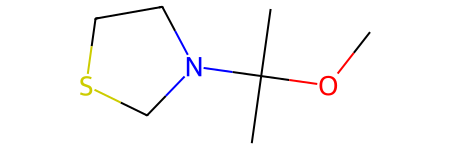

In [22]:
replace_hbd_methyl('CC(C)(N1CCSC1)O')

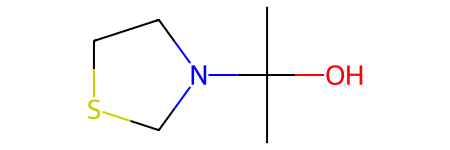

In [23]:
Chem.MolFromSmiles('CC(C)(N1CCSC1)O')

In [5]:
df_1_ = df_1.copy()
df_2 = df_1_.apply(lambda x: replace_hbd_methyl(x['smiles']), axis=1)
df_2

[23:06:21] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:06:21] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:06:21] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:16:40] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:16:40] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:16:40] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:56:17] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:56:17] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[23:56:17] WARNING: could not find number of expected rings. Switching to an approximate ring fi

0          <rdkit.Chem.rdchem.Mol object at 0x7f7f7b7e4e70>
1          <rdkit.Chem.rdchem.Mol object at 0x7f7f7b7e4bd0>
2          <rdkit.Chem.rdchem.Mol object at 0x7f7f7b7e4ed0>
3          <rdkit.Chem.rdchem.Mol object at 0x7f7f7b7f0030>
4          <rdkit.Chem.rdchem.Mol object at 0x7f7f7b7f0150>
                                 ...                       
6479871    <rdkit.Chem.rdchem.Mol object at 0x7f7f31fdeb10>
6479872    <rdkit.Chem.rdchem.Mol object at 0x7f7f31fdea50>
6479873    <rdkit.Chem.rdchem.Mol object at 0x7f7f31fde9f0>
6479874    <rdkit.Chem.rdchem.Mol object at 0x7f7f31fde990>
6479875    <rdkit.Chem.rdchem.Mol object at 0x7f7f31fdec30>
Length: 6479876, dtype: object

In [15]:
new_smiles_arr = []
for i in range(len(df_1)):
    if i % 100000 == 0:
        print("Currently on {}th data".format(i))
    smiles = df_1['smiles'][i]
    smiles_ = replace_hbd_methyl(smiles)
    new_smiles_arr.append(smiles_)

Currently on 0th data
Currently on 100000th data
Currently on 200000th data
Currently on 300000th data
Currently on 400000th data
Currently on 500000th data
Currently on 600000th data
Currently on 700000th data


[14:45:25] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 800000th data
Currently on 900000th data
Currently on 1000000th data
Currently on 1100000th data
Currently on 1200000th data
Currently on 1300000th data
Currently on 1400000th data
Currently on 1500000th data


[14:55:50] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 1600000th data
Currently on 1700000th data
Currently on 1800000th data
Currently on 1900000th data
Currently on 2000000th data
Currently on 2100000th data
Currently on 2200000th data
Currently on 2300000th data
Currently on 2400000th data
Currently on 2500000th data
Currently on 2600000th data
Currently on 2700000th data
Currently on 2800000th data
Currently on 2900000th data
Currently on 3000000th data
Currently on 3100000th data
Currently on 3200000th data
Currently on 3300000th data
Currently on 3400000th data
Currently on 3500000th data
Currently on 3600000th data
Currently on 3700000th data
Currently on 3800000th data
Currently on 3900000th data
Currently on 4000000th data
Currently on 4100000th data
Currently on 4200000th data


[15:33:18] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


Currently on 4300000th data
Currently on 4400000th data
Currently on 4500000th data
Currently on 4600000th data
Currently on 4700000th data
Currently on 4800000th data
Currently on 4900000th data
Currently on 5000000th data
Currently on 5100000th data
Currently on 5200000th data
Currently on 5300000th data
Currently on 5400000th data
Currently on 5500000th data
Currently on 5600000th data
Currently on 5700000th data
Currently on 5800000th data
Currently on 5900000th data
Currently on 6000000th data
Currently on 6100000th data
Currently on 6200000th data
Currently on 6300000th data
Currently on 6400000th data


In [16]:
len(new_smiles_arr)

6479876

In [17]:
df_3 = pd.DataFrame()
df_3['smiles'] = new_smiles_arr
# df_3.to_csv('mod_filter_1_smiles_list_pubchem.csv', index=False)

In [18]:
unique_smiles = df_3['smiles'].unique()
len(unique_smiles)
df_3_unique = pd.DataFrame()
df_3_unique['smiles'] = unique_smiles
df_3_unique

,smiles
0,CC1CCC(CCC2CCC(C(C)(C)C3CCC(C(C)C)CC3)CC2)CC1
1,CC1CCC2(CCCOC2=O)C1
2,COC(C)(C)N1CCSC1
3,CC(C(C)C(C)(C)N(C)C)N(C)C(=O)OCC1CCC2CCC(CC2)C1
4,CN1CCC(N2CCCC2C=O)CC1
...,...
4770615,CN1CN(C)C(=O)N(N(C)C)C1=O
4770616,CC1CCC2C(C1)C(=O)C1CC3C(CC12)C(=O)C1CC(C)CCC13
4770617,CN1C(=O)C2CCN(C)C2N(C)C1=O
4770618,CC(C)C(C)(C(=O)N1CCCC1)N(C)C1OCO1


In [19]:
df_3_unique.to_csv('mod_filter_1_smiles_list_pubchem.csv', index=False)

In [ ]:
# for i in range(len(df_3_unique)):
#     smile = df_3_unique['smiles'][i]
#     mol = Chem.MolFromSmiles(smile)
#     if MolDescriptors.CalcNumHBD(mol) >= 1:
#         print(i, smile)

[02:33:04] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[02:34:45] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.
[02:40:12] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


In [ ]:
df_3_unique = pd.read_csv('mod_filter_1_smiles_list_pubchem.csv')
df_3_unique

,smiles
0,CC1CCC(CCC2CCC(C(C)(C)C3CCC(C(C)C)CC3)CC2)CC1
1,CC1CCC2(CCCOC2=O)C1
2,COC(C)(C)N1CCSC1
3,CC(C(C)C(C)(C)N(C)C)N(C)C(=O)OCC1CCC2CCC(CC2)C1
4,CN1CCC(N2CCCC2C=O)CC1
...,...
4760928,CN1CN(C)C(=O)N(N(C)C)C1=O
4760929,CC1CCC2C(C1)C(=O)C1CC3C(CC12)C(=O)C1CC(C)CCC13
4760930,CN1C(=O)C2CCN(C)C2N(C)C1=O
4760931,CC(C)C(C)(C(=O)N1CCCC1)N(C)C1OCO1


In [3]:
df_4 = df_3_unique.query("~smiles.str.contains('-')")
df_4

,smiles
0,CC1CCC(CCC2CCC(C(C)(C)C3CCC(C(C)C)CC3)CC2)CC1
1,CC1CCC2(CCCOC2=O)C1
2,COC(C)(C)N1CCSC1
3,CC(C(C)C(C)(C)N(C)C)N(C)C(=O)OCC1CCC2CCC(CC2)C1
4,CN1CCC(N2CCCC2C=O)CC1
...,...
4760928,CN1CN(C)C(=O)N(N(C)C)C1=O
4760929,CC1CCC2C(C1)C(=O)C1CC3C(CC12)C(=O)C1CC(C)CCC13
4760930,CN1C(=O)C2CCN(C)C2N(C)C1=O
4760931,CC(C)C(C)(C(=O)N1CCCC1)N(C)C1OCO1


In [4]:
df_4.to_csv('mod_filter_1_smiles_list_pubchem.csv', index=False)